In [4]:
import numpy as np
import scipy
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as colors
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.fonttype'] = 42

import bbi
import pybedtools as pbt
import pickle
import cooler
from copy import deepcopy
import itertools 

import sys
sys.path.append("./code")

from tad_functions import *
from treg_functions import *
from hic_zscore_functions import *
from plotting_functions import *
from aux_functions import *
from init_tss_annotations import *
gpath = './annotations/chromsizes'
import statsmodels.stats
import statsmodels.stats.multitest


import matplotlib.pyplot as plt

plt.rcParams['axes.axisbelow'] = True

In [5]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [6]:
ACOMPARTMENT_CUTOFF = .7
ACOMPARTMENT_CUTOFF_LOOSE = 0

In [7]:
%load_ext autoreload
%autoreload
import scanpy as sc

sc.settings.set_figure_params(dpi=80, color_map='coolwarm', frameon=True)
plt.rcParams.update({'font.size': 12})
plt.rcParams.update({"axes.grid.axis" : 'both'})
plt.rcParams.update({"axes.grid" : True})

plt.rcParams.update({
    'axes.labelsize': 14,       # x and y labels' font size
    'xtick.labelsize': 8,      # x tick labels' font size
    'ytick.labelsize': 8,      # y tick labels' font size
    'axes.titlesize': 14,        # Axes title font size
    'patch.linewidth' : .35,
    'lines.linewidth' : .5,
    'legend.fontsize': 6,      # Legend font size
})
plt.rcParams['pdf.fonttype'] = 42

plt.rcParams.update({
    'axes.labelsize': 8,       # x and y labels' font size
    'xtick.labelsize': 6,      # x tick labels' font size
    'ytick.labelsize': 6,      # y tick labels' font size
    'axes.titlesize': 10,        # Axes title font size
    'patch.linewidth' : .35,
    'lines.linewidth' : .5,
    'xtick.major.pad' : 2,
    'ytick.major.pad' : 2,

})
plt.rcParams['axes.linewidth'] = .25
plt.rcParams['xtick.major.width'] = .25
plt.rcParams['ytick.major.width'] = .25
plt.rcParams['ytick.major.size'] = 2
plt.rcParams['xtick.major.size'] = 2
plt.rcParams['grid.linewidth'] = .25

plt.rcParams['axes.facecolor'] = 'none' # Or any suitable colour...
plt.rcParams['figure.facecolor'] = 'none'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'none'

plt.rcParams['axes.facecolor'] = 'none' # Or any suitable colour...
plt.rcParams['figure.facecolor'] = 'none'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'none'

In [8]:
import cooler
from importlib import reload
import sys
sys.path.append("./code")

import pandas as pd
from ast import literal_eval
import treg_functions

In [9]:
import matplotlib.image as mpimg
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

import scipy, scipy.stats
from hic_zscore_functions import *
from treg_functions import *
from old_make_figures import *
from tad_functions import *


Make loop anchors

In [10]:
import process_loops_from_mustache
from process_loops_from_mustache import *
import glob


def load_mustache_loops_separate():
    dfs = {}
    init_dfs = {}
    
    keysoi = [
        'final_loop_call_for_paper_supplement_Merged_all', 'final_loop_call_for_paper_supplement_Treg_all', 
        'final_loop_call_for_paper_supplement_Treg_rep1_MAPQ30_raw_5000', 'final_loop_call_for_paper_supplement_Treg_rep2_MAPQ30_raw_5000', 
        'final_loop_call_for_paper_supplement_Treg_rep3_MAPQ30_raw_5000', 'final_loop_call_for_paper_supplement_Tconv_all', 
        'final_loop_call_for_paper_supplement_Tn_rep1_MAPQ30_raw_5000', 'final_loop_call_for_paper_supplement_Tn_rep2_MAPQ30_raw_5000', 
        'final_loop_call_for_paper_supplement_Tn_rep3_MAPQ30_raw_5000',
    ]
    for key in keysoi:
        if '_all' in key:
            file = f'./call_loops/output/{key}.mcool/5000__0.05__0.85__1.2/loops.tsv'
        else:
            file = f'./call_loops/output/{key}.cool/5000__0.05__0.85__1.2/loops.tsv'
        init_df = pd.read_csv(file, sep='\t')
        newloopset, anc_mapping, mustache_loop_df = filter_raw_mustache_loops(init_df.copy())
        name = file.split("/")[-3].split(".")[-2]
        
        dfs[name] = mustache_loop_df
        init_dfs[name] = init_df
    
    j = []
    for key in keysoi:
        j.append(dfs[key])
    full_loop_df = pd.concat(j, axis=0)
    print("Original # loops:", len(full_loop_df))
    newloops, anc_mapping, df = filter_raw_mustache_loops(full_loop_df)
    
    new_dfs = []
    for key in keysoi:
        bt = loops_from_df(dfs[key])
        loopset = remap_ancs(bt, anc_mapping)
        grange_list = loopset_to_granges(loopset)
        tmpdf = pd.DataFrame(index=grange_list)
        tmpdf[key] = True
        new_dfs.append(tmpdf)
        
    all_loops = pd.concat(new_dfs, axis=1)
    all_loops = all_loops.fillna(False)
    all_loops = all_loops.astype(int)
    print("Final # loops:", len(all_loops))

    return all_loops, init_dfs

all_loops_df, init_dfs = load_mustache_loops_separate()
all_loops = add_chr_to_bedtool(pbt.BedTool('final_loops/processed_DESEQ/thresh=0/all_loops.csv'))

Original # loops: 59175
Final # loops: 18438


In [11]:
from process_loops_from_mustache import *
v_merged = init_dfs['final_loop_call_for_paper_supplement_Merged_all']
v_treg = init_dfs['final_loop_call_for_paper_supplement_Treg_all']
v_tcon = init_dfs['final_loop_call_for_paper_supplement_Tconv_all']

v_merged = v_merged[v_merged['FDR'] < .02]
v_treg = v_treg[v_treg['FDR'] < .02]
v_tcon = v_tcon[v_tcon['FDR'] < .02]

treg_and_tcon, tcon_mapped_to_treg = add_loops_to_reference(v_treg, v_tcon, res=5000, d = 2)
merged_all_tcon, tcon_mapped_to_all = add_loops_to_reference(v_merged, tcon_mapped_to_treg, res=5000, d = 2)
merged_all_tcon_treg, treg_mapped_to_all = add_loops_to_reference(merged_all_tcon, v_treg, res=5000, d = 2)

In [12]:
import process_loops_from_mustache
from process_loops_from_mustache import *

import glob
dfs = {}
init_dfs = {}
for file in glob.glob('./call_loops/output/*/5000__0.05__0.85__1.2/*'):
    init_df = pd.read_csv(file, sep='\t')
    newloopset, anc_mapping, mustache_loop_df = filter_raw_mustache_loops(init_df.copy())
    name = file.split("/")[-3].split(".")[-2]
#     print(name, len(newloopset))
    dfs[name] = mustache_loop_df
    init_dfs[name] = init_df

In [13]:

all_color_dict = {
    'gray' : '#63666A',
    'lightblue' : 'lightblue'
}

In [14]:
treg_250kb = cooler.Cooler('./Treg_all.mcool::/resolutions/250000')
tcon_250kb = cooler.Cooler('./Tconv_all.mcool::/resolutions/250000')


treg_50kb = cooler.Cooler('./Treg_all.mcool::/resolutions/50000')
tcon_50kb = cooler.Cooler('./Tconv_all.mcool::/resolutions/50000')

treg_cool_5kb = cooler.Cooler('./Treg_all.mcool::/resolutions/5000')
tcon_cool_5kb = cooler.Cooler('./Tconv_all.mcool::/resolutions/5000')
merged_cool_5kb = cooler.Cooler('./Merged_all.mcool::/resolutions/5000')


In [15]:
cooldict_5kb = {
    'treg' : treg_cool_5kb,
    'tcon' : tcon_cool_5kb,
    'merged' : merged_cool_5kb,
}

cooldict_250kb = {
    'treg' : treg_250kb,
    'tcon' : tcon_250kb,
}

replicate_cooldict = {
    'Treg rep1' : cooler.Cooler('./coolfiles/Treg_rep1_MAPQ30_raw_50000.cool'),
    'Treg rep2' : cooler.Cooler('./coolfiles/Treg_rep2_MAPQ30_raw_50000.cool'),
    'Treg rep3' : cooler.Cooler('./coolfiles/Treg_rep3_MAPQ30_raw_50000.cool'),
}

In [16]:
resting_gene_bedtool = pbt.BedTool('./peaks/Treg_rest_vs_Tcon_rest_thresh=0.25.csv.narrowPeak')
resting_gene_bedtool = resting_gene_bedtool.filter(lambda x: float(x[8]) > 4).saveas()

ATAC peaks

In [17]:
atac_peaks = pbt.BedTool('./atac/processed/Treg_rest_vs_Tcon_rest_thresh=0.csv')

Load TF annotations

In [18]:
tfs = pd.read_csv('/Genomics/argo/users/gdolsten/pritlab/jupys/tregs/rudensky_scrna/prelim-analysis/tfdb/Mus_musculus_TF', sep='\t')
tfnames = tfs['Symbol']

Load Compartments

In [19]:
my_treg_comp = np.load('for_s1/my_treg_comp.npy')
my_tcon_comp = np.load('for_s1/my_tcon_comp.npy')

my_treg_comp_50kb = np.load('for_s1/my_treg_comp_50kb.npy')
my_tcon_comp_50kb = np.load('for_s1/my_tcon_comp_50kb.npy')

Load self object

In [20]:
from make_figure4 import *
import pickle


row_colors = ['lightgreen', 'green', 'orange']

columns_to_names = {
    0 : 'Constitutive',
    4 : 'Dynamic',
    18 : 'Repressive',
}

row_colors_dict = {
'Constitutive' : 'lightgreen',
'Dynamic' : 'green',
'Repressive' : 'orange',
}

self = pickle.load(open('./for_s1/self_object', 'rb'))

In [21]:
from initialize import *

(chromsizes, parsed_chroms, region_to_inds, 
    all_region_to_ind, inds_to_region, all_ind_to_region, 
    chrom_to_start, chrom_to_end) = initialize_helper_vars(treg_250kb)


(_, _, region_to_inds_50kb, all_region_to_ind_50kb, 
    inds_to_region_50kb, all_ind_to_region_50kb,
    chrom_to_start_50kb, chrom_to_end_50kb) = initialize_helper_vars(treg_50kb)

Make TSS DF

In [42]:
def make_250kb_annotations():
    n = np.arange(len(my_treg_comp))
    
    _250kb_hub_annotations = pd.DataFrame(index = n)
    _250kb_hub_annotations['Hub'] = "Others"
    
    active_hub_a_comp = np.nanmean(my_treg_comp[self.goodinds[(self.clustdict['all'] == 0) | (self.clustdict['all'] == 4)]])
    n = n[~np.isin(n, self.goodinds[(self.merged_clustdict['all'] == 0) | (self.merged_clustdict['all'] == 4)])]
    o = np.argsort(-my_treg_comp[n])
    vals = my_treg_comp[n][o]
    for i in np.arange(len(vals)):
        if np.nanmean(vals[:i]) < active_hub_a_comp:
            break
    print(i)
    _250kb_hub_annotations['Hub'].loc[n[o][:i]] = 'matched_A compartment'
    
    for u in [0, 4, 18]:
        _250kb_hub_annotations.loc[self.goodinds[self.merged_clustdict['all']==u], 'Hub'] = columns_to_names[u]
    return _250kb_hub_annotations
    
_250kb_hub_annotations =  make_250kb_annotations()
_250kb_hub_annotations.to_csv('./annotations/_250kb_hub_annotations.tsv', sep='\t')

1776


/tmp/ipykernel_3274312/186958453.py:12: RuntimeWarning: Mean of empty slice
  if np.nanmean(vals[:i]) < active_hub_a_comp:


In [44]:
from gtf_functions import make_tss_df

gtf_file = pbt.BedTool('./rudensky_scrna/prelim-analysis/bulk_rna_data/annotations/gencode.vM23.annotation.gtf')
transcripts_file = gtf_file.filter(lambda b: b[2] == 'transcript').saveas()
exons = gtf_file.filter(lambda b: b[2] == 'exon').saveas()
my_tss_df, my_transcript_df = make_tss_df(transcripts_file, {'chr' + x for x in PARSED_CHROMS_nochr})

my_tss_df = my_tss_df.loc[~(my_tss_df['support_level'] == 'NA') & (my_tss_df['transcript_type'] == 'protein_coding')]
my_tss_df['support_level'] = my_tss_df['support_level'].astype(int)
my_tss_df = my_tss_df.sort_values("support_level").drop_duplicates("gene_name")


my_tss_df = my_tss_df[my_tss_df['chrom'].isin(add_chr_to_list(parsed_chroms))]
my_tss_df['ind'] = my_tss_df['start']//250_000 + my_tss_df['chrom'].apply(lambda x: chrom_to_start[x[3:]])
my_tss_df['cluster'] = -1
my_tss_df['cluster'] = my_tss_df['cluster'].astype(object)
my_tss_df['hub'] = "none"
for u in _250kb_hub_annotations['Hub'].unique():
    inds = _250kb_hub_annotations.index[_250kb_hub_annotations['Hub'] == u]
    my_tss_df.loc[my_tss_df['ind'].isin(inds), 'hub'] = u

my_tss_df['hub'] = my_tss_df['hub'].astype(object)

for u in np.unique(self.clustdict['all']):
    inds_in_cluster = self.goodinds[self.clustdict['all']==u]
    my_tss_df.loc[my_tss_df['ind'].isin(inds_in_cluster), 'cluster'] = u

my_tss_df.to_csv('./annotations/full_tss_df.csv', sep=',')
my_tss_df = my_tss_df[my_tss_df['gene_name'].isin(gene_dict['Resting'].index)]

# my_tss_df.to_csv('./annotations/my_tss_df.csv', sep=',')

In [24]:
my_tss_df = pd.read_csv('./annotations/my_tss_df.csv', index_col = 0)

Load Gene Expression

In [25]:
import pandas as pd
geneLengths = pd.read_csv('/Genomics/argo/users/gdolsten/pritlab/jupys/tregs/rudensky_scrna/prelim-analysis/bulk_rna_data/counts/SRP272473.SRR12264706.activated_Treg.rep3_counts.txt',
           sep='\t', skiprows=1,).set_index("Geneid")
geneLengths = geneLengths['Length']


active_gene_lfcs = pbt.BedTool('./peaks/Treg_actv_vs_Tcon_actv_thresh=0.25.csv.narrowPeak').to_dataframe().set_index('name')
resting_gene_lfcs = pbt.BedTool('./peaks/Treg_rest_vs_Tcon_rest_thresh=0.25.csv.narrowPeak').to_dataframe().set_index('name')

active_gene_lfcs = active_gene_lfcs[active_gene_lfcs['itemRgb'] > 4]
resting_gene_lfcs = resting_gene_lfcs[resting_gene_lfcs['itemRgb'] > 4]

active_gene_lfcs = active_gene_lfcs[active_gene_lfcs.index.isin(my_tss_df['gene_name']) & 
                                    active_gene_lfcs.index.isin(geneLengths.index)]
resting_gene_lfcs = resting_gene_lfcs[resting_gene_lfcs.index.isin(my_tss_df['gene_name']) & 
                                    resting_gene_lfcs.index.isin(geneLengths.index)]

active_gene_lfcs = active_gene_lfcs[~active_gene_lfcs.index.duplicated()]
resting_gene_lfcs = resting_gene_lfcs[~resting_gene_lfcs.index.duplicated()]

active_gene_lfcs['rpkm'] = active_gene_lfcs['itemRgb'] / geneLengths.loc[active_gene_lfcs.index]
resting_gene_lfcs['rpkm'] = resting_gene_lfcs['itemRgb'] / geneLengths.loc[resting_gene_lfcs.index]

gene_dict = {
    'Active' : active_gene_lfcs,
    'Resting' : resting_gene_lfcs,
}

In [26]:
gene_dict['Resting'].to_csv('./annotations/resting_gene_dict.csv', sep='\t')

In [27]:
import initialize
from initialize import *

gene_to_ind, ind_to_gene = initialize_genes(all_ind_to_region, all_region_to_ind)

for x, y in ind_to_gene.items():
    ind_to_gene[x] = [_ for _ in y if _ in gene_dict['Resting'].index]

Load SEs

In [29]:
SEs = pbt.BedTool('superenhancers/common_SE_liftover.bed')
SE_treg = pbt.BedTool('superenhancers/Treg_SE_liftover.bed')
SE_tn = pbt.BedTool('superenhancers/Tn_SE_liftover.bed')
SEs_all = SEs.cat(SE_treg).cat(SE_tn)
SE_count = get_col(pbt.BedTool(add_chr_to_bedtool(all_ind_to_region)).intersect(SEs_all, c=True), -1).astype(int)

SE_treg_count = get_col(pbt.BedTool(add_chr_to_bedtool(all_ind_to_region)).intersect(SE_treg, c=True), -1).astype(int)
SE_tcon_count = get_col(pbt.BedTool(add_chr_to_bedtool(all_ind_to_region)).intersect(SE_tn, c=True), -1).astype(int)
SE_common_count = get_col(pbt.BedTool(add_chr_to_bedtool(all_ind_to_region)).intersect(SEs, c=True), -1).astype(int)

In [30]:
bw_val_df_all_50kb = pd.read_csv('./for_s1/bw_vals_50kb.csv')
bw_val_df_all_250kb = pd.read_csv('./for_s1/bw_vals_250kb.csv')

In [31]:
deseq_effect_mat = np.load('./for_s1/deseq_effect_mat.npy')
deseq_lfc_mat = np.load('./for_s1/deseq_lfc_mat.npy')
deseq_pval_mat = np.load('./for_s1/deseq_pval_mat.npy')

Load loops

In [41]:
loopdict = {
    'NS' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0/ns_loops.csv'),
    'Tcon' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0/Tcon_loops.csv'),
    'Treg' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0/Treg_loops.csv'),
}

anchordict = {
    'All' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0/all_ancs.csv'),
    'NS' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0/ns_ancs.csv'),
    'Tcon' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0/Tcon_ancs.csv'),
    'Treg' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0/Treg_ancs.csv'),
}

anchordict_thresh_025 = {
    'All' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0.25/all_ancs.csv'),
    'NS' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0.25/ns_ancs.csv'),
    'Tcon' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0.25/Tcon_ancs.csv'),
    'Treg' : pbt.BedTool('./final_loops/processed_DESEQ/thresh=0.25/Treg_ancs.csv'),
}



loop_colordict = {
    'NS' : 'lightgray',
    'Tcon' : 'blue',
    'Treg' : 'red',
}

Load TADs

In [44]:
insu_pref = '/Genomics/argo/users/gdolsten/pritlab/mega_tcell_dataset/insulations/'
res = 5000
d = 16
insu_df_treg = pd.read_csv(insu_pref + f'Rename_Treg_all_no_chrM_res={res}_pixels={d}.bw', sep='\t')
insu_df_tcon = pd.read_csv(insu_pref + f'Rename_Tconv_all_no_chrM_res={res}_pixels={d}.bw', sep='\t')

insu_df_tcon['is_boundary_strict'] = insu_df_tcon[f'boundary_strength_{d*res}'] > .4
insu_df_treg['is_boundary_strict'] = insu_df_treg[f'boundary_strength_{d*res}'] > .4

inds = insu_df_tcon[insu_df_tcon['is_boundary_strict'] | insu_df_treg['is_boundary_strict']]
tad_boundaries = add_chr_to_bedtool(pbt.BedTool.from_dataframe(inds).slop(b=10_000, genome='mm10')).merge()

Load Metadomains

In [45]:
all_intra_treg_metadomains = np.load('for_s1/all_intra_treg_metadomains.npy', )
all_intra_tcon_metadomains = np.load('for_s1/all_intra_tcon_metadomains.npy', )
all_intra_metadomains = np.load('for_s1/all_intra_metadomains.npy')

In [46]:
all_inter_metadomains = np.load('./for_s1/all_inter_metadomains.npy')
all_inter_treg_metadomains = np.load('./for_s1/all_inter_treg_metadomains.npy')
all_inter_tcon_metadomains = np.load('./for_s1/all_inter_tcon_metadomains.npy')

In [47]:
inter_and_intra_connections = np.load('for_s1/inter_and_intra_connections.npy')
inter_and_intra_connections_tcon = all_intra_tcon_metadomains + all_inter_tcon_metadomains
inter_and_intra_connections_treg = all_intra_treg_metadomains + all_inter_treg_metadomains

Load Log O/E matrices

In [48]:
from construct_oe_mat import construct_oe_mat_dict
treg_tcon_oe_mat = construct_oe_mat_dict(cooldict_250kb, all_ind_to_region, parsed_chroms, 
                      chrom_to_start, chrom_to_end, verbose=True, pc=1e-4, log=True)

sep_oe_mat_treg = treg_tcon_oe_mat['treg']
sep_oe_mat_tcon = treg_tcon_oe_mat['tcon']

/Genomics/pritykinlab/gabe/jupys/tregs/./code/hic_zscore_functions.py:148: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.diag(balanced_mat, k=off_diag_k))


Done with treg
Done with tcon


Load differential hub DFs

In [49]:
newline = '\n'

hub_pileup_stat_df_250kb = pd.read_csv('./diff_ms_dfs/stat_df.csv', index_col = 0)
hub_pileup_pval_df_250kb = pd.read_csv('./diff_ms_dfs/pval_df.csv', index_col = 0)

hub_pileup_stat_df_250kb.columns = hub_pileup_stat_df_250kb.columns.astype(int)
hub_pileup_pval_df_250kb.columns = hub_pileup_pval_df_250kb.columns.astype(int)

HIC_PCO = .01
HIC_STATCO = 1.5

In [50]:
def make_metadomain_hub_freq_df():
    metadomain_mat_dict = {
            'Treg' : (inter_and_intra_connections_tcon == 0) & (inter_and_intra_connections_treg > 0),
            'Both' : (inter_and_intra_connections_tcon > 0) & (inter_and_intra_connections_treg > 0),
            'Tcon' : (inter_and_intra_connections_tcon > 0) & (inter_and_intra_connections_treg == 0),
            'Neither' : (inter_and_intra_connections_tcon == 0) & (inter_and_intra_connections_treg == 0),
    
    }
    
    metadomain_hub_freq_df = pd.DataFrame()
    for key, metadomain_mat in metadomain_mat_dict.items():
        data = []
        us = [0, 4, 18]
        for u in us:
            inds = self.goodinds[self.merged_clustdict['all']==u]
            data.append(np.sum(metadomain_mat[inds, :][:, inds]))
        series_data = pd.Series(data, index=us)
        metadomain_hub_freq_df[key] = series_data
    metadomain_hub_freq_df.index = [columns_to_names.get(x, "Other") for x in metadomain_hub_freq_df.index]
    metadomain_hub_freq_df = (metadomain_hub_freq_df.T / metadomain_hub_freq_df.sum(axis=1)).T
    metadomain_hub_freq_df = metadomain_hub_freq_df.drop("Neither", axis=1)    
    return metadomain_hub_freq_df

In [51]:
metadomain_hub_freq_df = make_metadomain_hub_freq_df()

Load Motifs

In [52]:
%autoreload 2
from supp_figures_plotting_functions import get_motif_counts
from motif_metadata_functions import get_motif_metadata

meme_motif_df, motif_id_to_name_dict = get_motif_counts()
motif_metadata = get_motif_metadata(motif_id_to_name_dict)

Imported plotting functions


/Genomics/argo/users/gdolsten/.conda/envs/mamba/envs/new_3dgenome/lib/python3.10/site-packages/pyjaspar/__init__.py:338: BiopythonWarning: Failed to fetch internal database ID for JASPAR motif with matrix ID 'MA1621.1'. No JASPAR motif with this matrix ID appears to exist.
  warnings.warn(


Load H3K27ac

In [53]:
from supp_figures_plotting_functions import get_h3k27ac_motif_counts

h3k27ac_motif_df, _ = get_h3k27ac_motif_counts()

In [46]:
all_h3k27ac = add_chr_to_bedtool(pbt.BedTool('peaks/differential/all_threshold_27ac.csv')).to_dataframe()
all_h3k27ac.index = bedtool_to_index(add_chr_to_bedtool(pbt.BedTool('peaks/differential/all_threshold_27ac.csv')))
all_h3k27ac['score'] = -all_h3k27ac['score']
all_h3k27ac = all_h3k27ac[(all_h3k27ac['name'] < 400) | (all_h3k27ac['name'] > 10)]
all_h3k27ac.to_csv('./annotations/final_h3k27ac.csv')


In [54]:
# import pickle

# pickle.dump(gene_dict, open('./annotations/rna_lfc_dict.p', 'wb'))

Load scRNA correlations

In [55]:
from supp_figures_plotting_functions import load_rna
treg_precursor_rna_corr, tregs_rna_corr = load_rna()

Load metaloop anchors dataframe

In [52]:
!mkdir -p final_loops/metaloops
!cp final_loops/megaloops/refined_megaloops/refined_megaloop_anchors.bed final_loops/metaloops/refined_metaloop_anchors.bed

In [53]:
metaloop_anchors = add_chr_to_bedtool(pbt.BedTool('./final_loops/metaloops/refined_metaloop_anchors.bed'))

In [57]:
metaloops = pbt.BedTool('./final_loops/metadomains/refined_metadomains/refined_metadomains.bed')

Load ChIP Compendium

In [58]:
adata = sc.read_h5ad('./final_chipseq_adata/FINAL_adata')

#### Table S1

In [ ]:
from supp_figures_plotting_functions import make_table_s1

!mkdir -p plots/paper/tables
table_s1 = make_table_s1()

#### Table S2

In [ ]:
from supp_figures_plotting_functions import make_table_s1

table_s1 = make_table_s2()

In [ ]:
loop_df = loopdict['All'].to_dataframe(header=None)
loop_df.columns = ['chr1', 'start1', 'end1', 'chr2', 'start2', 'end2', 'baseMean', 'LFC', 'lfcSE',
                    'statistic', 'pvalue', 'FDR']

loop_df.to_csv('./plots/paper/tables/table_s2_loops.tsv', sep='\t')
tad_boundaries[['chrom' ,'start', 'end']].to_csv('./plots/paper/tables/table_s2_boundaries.tsv', sep='\t')

#### Table S3

Metadomains

In [ ]:
all_data = []
rows, cols = np.where(np.triu(all_intra_metadomains + all_inter_metadomains > 0))
for row, col in zip(rows, cols):
    data = (list(all_ind_to_region[row]) + list(all_ind_to_region[col])
            + [inter_and_intra_connections_treg[row, col] > 0]
            + [inter_and_intra_connections_tcon[row, col] > 0]
            + [deseq_effect_mat[row, col]]
            + [deseq_pval_mat[row, col]]
            + [deseq_lfc_mat[row, col]]
            + ['; '.join(ind_to_gene.get(row, []))]
            + ['; '.join(ind_to_gene.get(col, []))]
           )
    all_data.append(data)

In [ ]:
metadomains = pd.DataFrame(all_data,
                          columns = ['chrom1', 's1', 'e1',
                                    'chrom2', 's2', 'e2',
                                    'treg_metadomain',
                                     'tcon_metadomain',
                                    'Wald Statistic',
                                     'FDR',
                                     'DESeq2_LFC Treg / Tcon',
                                     'genes_anchor_1',
                                     'genes_anchor_2'])
metadomains['is_interchromosomal'] = metadomains['chrom1'] != metadomains['chrom2']
metadomains.to_csv('./plots/paper/tables/table_s3_metadomains.tsv', sep='\t')

Deseq2

In [ ]:
all_data = []
rows, cols = np.where(np.triu(deseq_pval_mat < .05))
for row, col in zip(rows, cols):
    data = (list(all_ind_to_region[row]) + list(all_ind_to_region[col])
            + [inter_and_intra_connections_treg[row, col] > 0]
            + [inter_and_intra_connections_tcon[row, col] > 0]
            + [deseq_effect_mat[row, col]]
            + [deseq_pval_mat[row, col]]
            + [deseq_lfc_mat[row, col]]
            + ['; '.join(ind_to_gene.get(row, []))]
            + ['; '.join(ind_to_gene.get(col, []))]
           )
    all_data.append(data)

In [ ]:
intra_deseq_values = pd.DataFrame(all_data,
                          columns = ['chrom1', 's1', 'e1',
                                    'chrom2', 's2', 'e2',
                                    'treg_metadomain',
                                     'tcon_metadomain',
                                    'Wald Statistic',
                                     'FDR',
                                     'DESeq2_LFC Treg / Tcon',
                                     'genes_anchor_1',
                                     'genes_anchor_2'])
intra_deseq_values['is_interchromosomal'] = intra_deseq_values['chrom1'] != intra_deseq_values['chrom2']
intra_deseq_values.to_csv('./plots/paper/tables/table_s3_differential_interactions.tsv', sep='\t')

#### Table S4

#### Table S5

#### Figure S1

A. Reads in Dataset

In [113]:
!mkdir -p ./plots/paper/s1

Imported plotting functions


Imported plotting functions


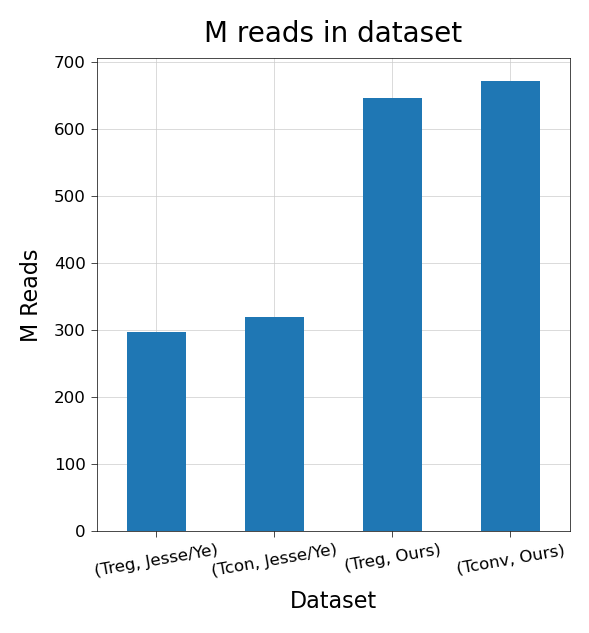

In [119]:
from supp_figures_plotting_functions import make_hic_jesseye_readcount_barplot

fig = make_hic_jesseye_readcount_barplot()
fig.savefig('./plots/paper/s1/loop_manhattan.pdf', bbox_inches='tight')

B. Reproducibility

In [1740]:
coolfiles = {
    'Treg_rep1' : cooler.Cooler('./coolfiles/Treg_rep1_MAPQ30_raw_100000.cool'),
    'Treg_rep2' : cooler.Cooler('./coolfiles/Treg_rep2_MAPQ30_raw_100000.cool'),
    'Treg_rep3' : cooler.Cooler('./coolfiles/Treg_rep3_MAPQ30_raw_100000.cool'),
    'Tn_rep1' : cooler.Cooler('./coolfiles/Tn_rep1_MAPQ30_raw_100000.cool'),
    'Tn_rep2' : cooler.Cooler('./coolfiles/Tn_rep2_MAPQ30_raw_100000.cool'),
    'Tn_rep3' : cooler.Cooler('./coolfiles/Tn_rep3_MAPQ30_raw_100000.cool'),
}

AUTOSOMES = cooler.Cooler('./coolfiles/Treg_rep1_MAPQ30_raw_100000.cool').chromnames[:-3]

from aux_functions import *
from make_figure4 import normalize_raw_intra
data_dfs = []
for chrom in AUTOSOMES:
    data_df = pd.DataFrame()
    for name,  cool in coolfiles.items():
        data = []
        mat = cool.matrix().fetch(chrom)
        m = normalize_raw_intra(mat, nan_to_zero=False, pc = 1e-4)
        x, y = np.triu_indices(m.shape[0])
        dist = np.abs(x-y)
        x, y = x, y
        data_df[name] = m[x, y]
    
    data_df['chrom'] = chrom
    data_df['distance'] = dist
    data_df = data_df.dropna()
    data_df.columns = data_df.columns.str.replace("Tn", "Tcon")
    data_dfs.append(data_df)

data_df_merged = pd.concat(data_dfs, axis=0)
data_df_merged.columns = data_df_merged.columns.str.replace("Tn", "Tcon")

all_rs = []
for u in data_df_merged['distance'].unique():
    rs = data_df_merged[data_df_merged['distance']==u].drop('distance', axis=1).groupby('chrom').corr().reset_index().melt(['chrom', 'level_1'])
    rs['distance'] = u
    all_rs.append(rs)

all_rs = pd.concat(all_rs, axis=0)
all_rs = all_rs[all_rs['level_1']!=all_rs['variable']]
all_rs['cond1'] = all_rs['level_1'].apply(lambda x: x.split("_rep")[0])
all_rs['cond2'] = all_rs['variable'].apply(lambda x: x.split("_rep")[0])
all_rs['final_cond'] = 'Treg-Tcon'
all_rs.loc[(all_rs['cond1'] == 'Treg') & (all_rs['cond2'] == 'Treg'), 'final_cond'] = 'Treg-Treg'
all_rs.loc[(all_rs['cond1'] == 'Tcon') & (all_rs['cond2'] == 'Tcon'), 'final_cond'] = 'Tcon-Tcon'
all_rs['kb'] = (all_rs['distance'] * 100_000)/1e3
all_rs['mb'] = (all_rs['distance'] * 100_000)/1e6
all_rs = all_rs.reset_index()

/Genomics/pritykinlab/gabe/jupys/tregs/./code/hic_zscore_functions.py:148: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.diag(balanced_mat, k=off_diag_k))
/Genomics/pritykinlab/gabe/jupys/tregs/./code/hic_zscore_functions.py:148: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.diag(balanced_mat, k=off_diag_k))
/Genomics/pritykinlab/gabe/jupys/tregs/./code/hic_zscore_functions.py:148: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.diag(balanced_mat, k=off_diag_k))
/Genomics/pritykinlab/gabe/jupys/tregs/./code/hic_zscore_functions.py:148: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.diag(balanced_mat, k=off_diag_k))
/Genomics/pritykinlab/gabe/jupys/tregs/./code/hic_zscore_functions.py:148: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.diag(balanced_mat, k=off_diag_k))
/Genomics/pritykinlab/gabe/jupys/tregs/./code/hic_zscore_functions.py:148: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.diag(balanced_mat, k=off_diag_k))
/Genomics/

In [1749]:
rs2 = all_rs.groupby(['chrom', 'level_1', 'variable', 'mb'])['value'].mean().reset_index()

In [1752]:
all_rs['final_cond2'] = all_rs['level_1'] + '-' + all_rs['variable']

In [1759]:
all_rs = all_rs[all_rs['level_1'] > all_rs['variable']]

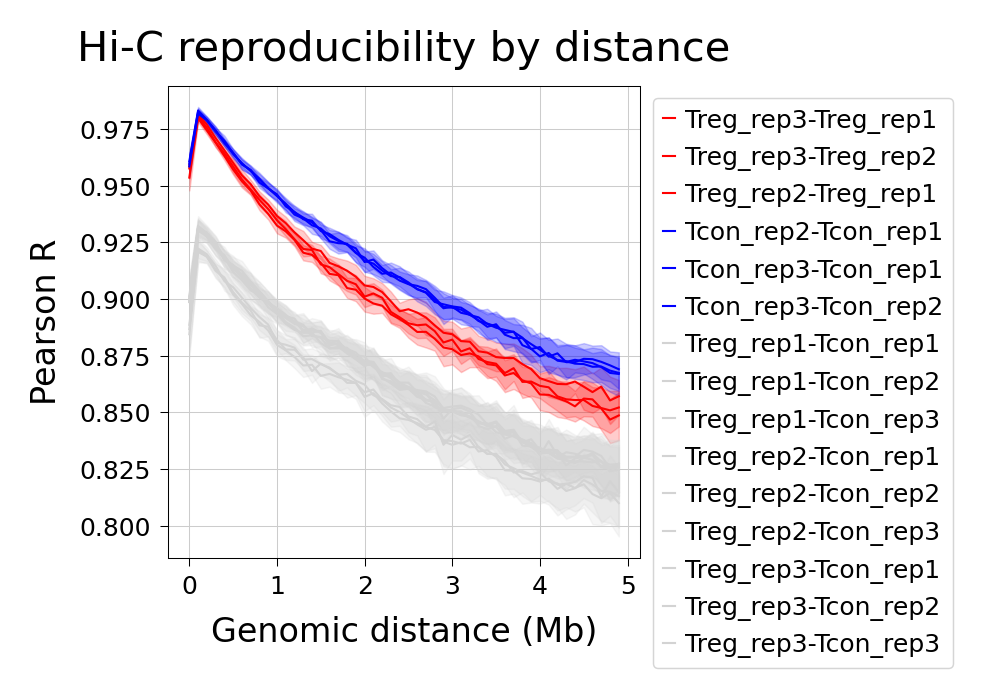

In [1765]:
fig, axs = init_subplots_exact(1, 1, fgsz=(40*mm, 40*mm), dpi = 150)
sns.lineplot(data=all_rs[all_rs['distance'] < 50], x = 'mb', y = 'value', hue='final_cond2', ax=axs,
            palette=['red', 'red', 'red', 'blue', 'blue', 'blue', 'lightgray', 'lightgray', 'lightgray', 
                     'lightgray', 'lightgray', 'lightgray', 'lightgray', 'lightgray', 'lightgray'],
            hue_order=[ 'Treg_rep3-Treg_rep1', 'Treg_rep3-Treg_rep2', 'Treg_rep2-Treg_rep1', 'Tcon_rep2-Tcon_rep1', 
                       'Tcon_rep3-Tcon_rep1', 'Tcon_rep3-Tcon_rep2', 'Treg_rep1-Tcon_rep1', 'Treg_rep1-Tcon_rep2', 
                       'Treg_rep1-Tcon_rep3', 'Treg_rep2-Tcon_rep1', 'Treg_rep2-Tcon_rep2', 'Treg_rep2-Tcon_rep3', 
                       'Treg_rep3-Tcon_rep1', 'Treg_rep3-Tcon_rep2', 'Treg_rep3-Tcon_rep3',]
            )
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.xlabel('Genomic distance (Mb)')
plt.ylabel('Pearson R')
plt.title("Hi-C reproducibility by distance")
fig.savefig('./plots/paper/s1/reproducibility_by_distance.pdf', bbox_inches='tight')

#### Figure S2

A. Looping venn diagram

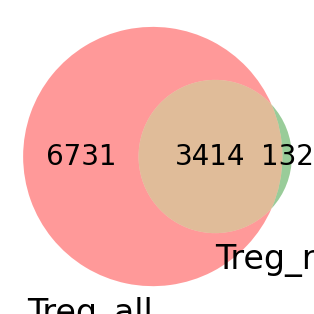

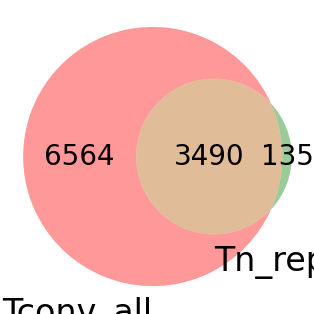

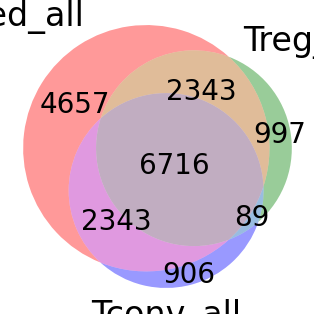

In [338]:
from supp_figures_plotting_functions import make_venn_diagrams

fig_treg, fig_tcon, fig_merged = make_venn_diagrams(all_loops_df)
# fig_treg.savefig("./plots/paper/s2/loop_venn_treg.pdf", bbox_inches='tight')
# fig_tcon.savefig("./plots/paper/s2/loop_venn_tcon.pdf", bbox_inches='tight')
# fig_merged.savefig("./plots/paper/s2/loop_venn_merged.pdf", bbox_inches='tight')

B. Jaccard looping

Imported plotting functions


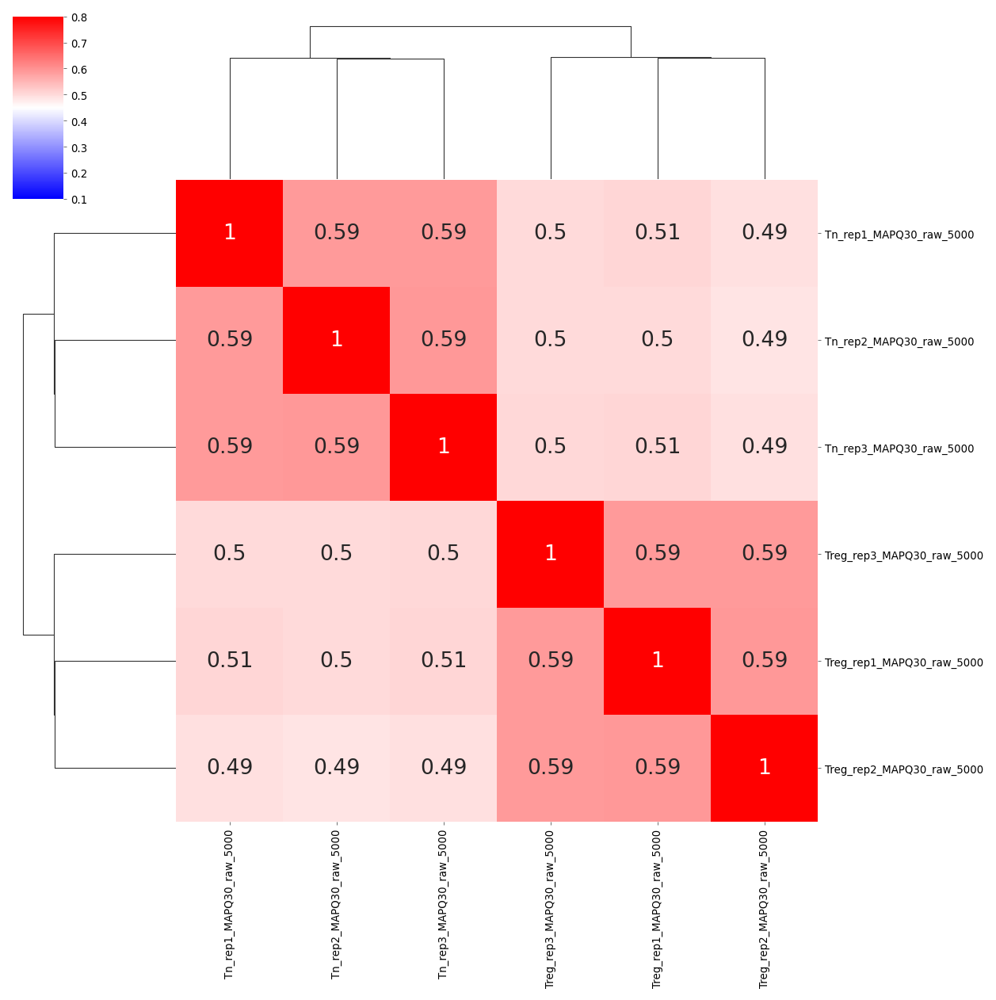

In [123]:
%autoreload 2
from supp_figures_plotting_functions import make_jaccard_clustermap

fig_jacc = make_jaccard_clustermap(all_loops_df)
fig_jacc.savefig("./plots/paper/s2/loop_jacc.pdf", bbox_inches='tight')

C. Mustache FDRs

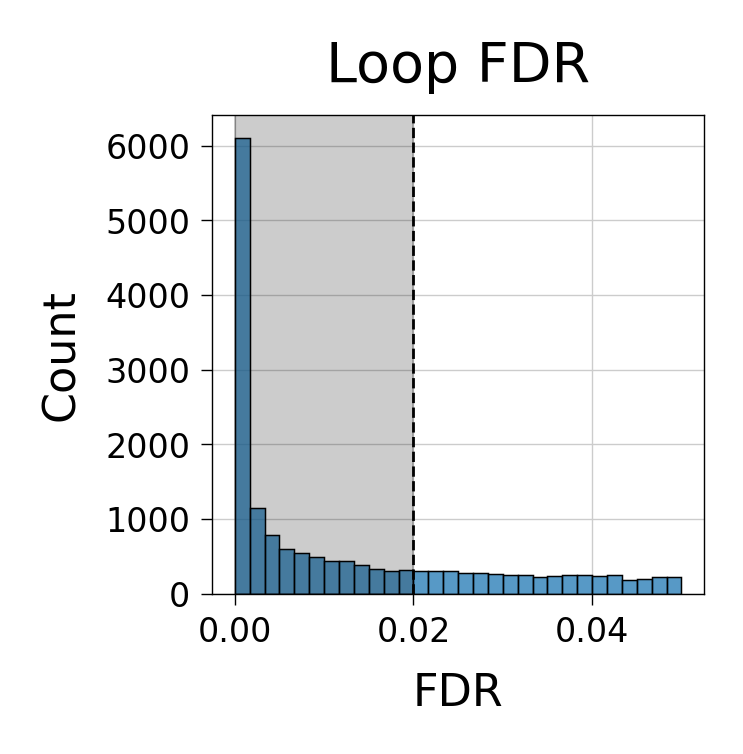

In [131]:
from supp_figures_plotting_functions import make_fdr_histogram

fig = make_fdr_histogram(init_dfs)
fig.savefig("./plots/paper/s2/loop_fdrs.pdf", bbox_inches='tight')

D1. Random examples

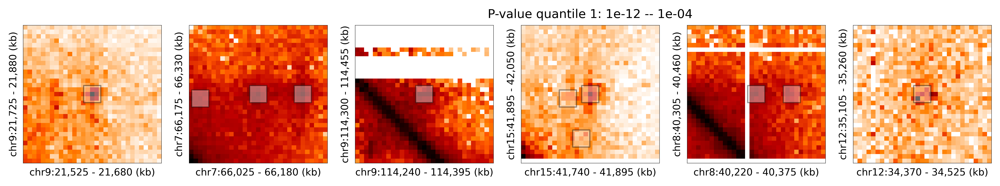

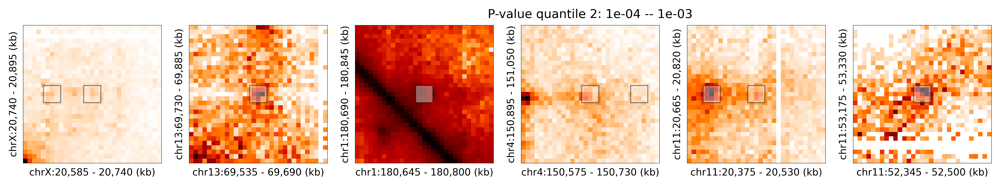

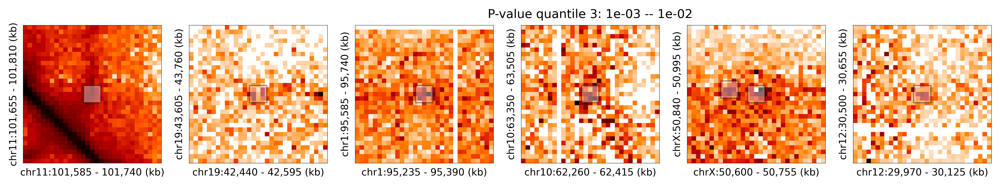

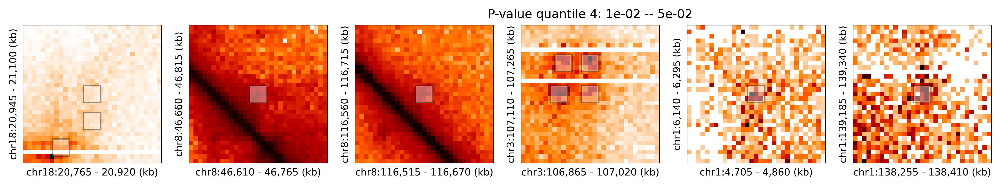

In [135]:
from supp_figures_plotting_functions import plot_random_examples

figs = plot_random_examples(init_dfs, cooldict_5kb)

D2. Looops by replicate

In [126]:
name = 'by_replicates'
oe_df = pd.read_csv(f'./data_for_enhancer_umap/oe_df_{name}.csv', sep='\t', index_col = 0)

with open(f'./full_pileup_dict_{name}', 'rb') as f:
    full_pileup_dict = pickle.load(f)

In [94]:
loops_with_FDR = pd.read_csv('final_loops/all_loops.csv', sep='\t', index_col = 0)

In [133]:
def df_to_loop_grange_list(df):
    loop_grange_list = []
    for _, row in  df.iterrows():
        loop_grange = granges_to_loop_grange(tuple_to_grange(*add_chr_to_anc(make_str(row[:3].values))),
                                             tuple_to_grange(*add_chr_to_anc(make_str(row[3:6].values))))
        loop_grange_list.append(loop_grange)
    return loop_grange_list



Imported plotting functions


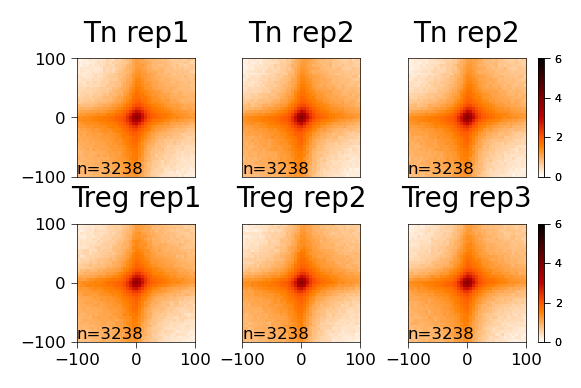

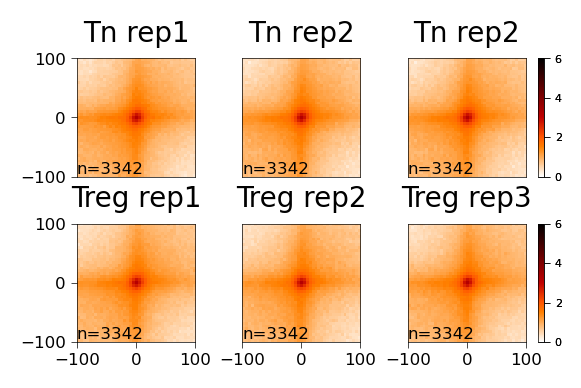

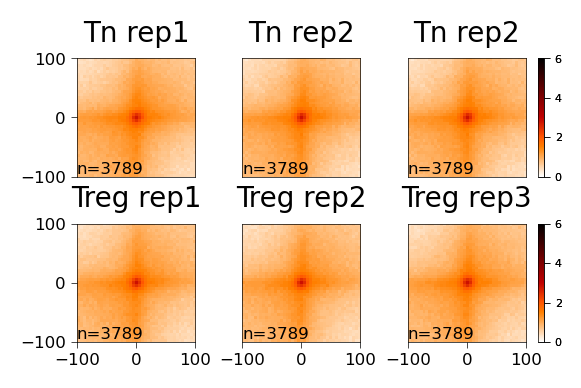

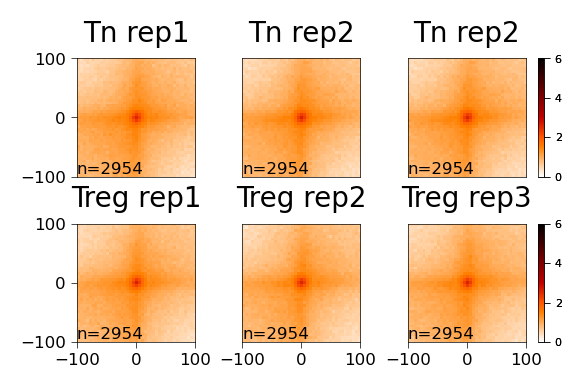

In [158]:
from supp_figures_plotting_functions import plot_apa

quants = [0, .0001, .002, .01, .02, 1]
qs = pd.cut(loops_with_FDR['FDR'], quants, labels=False)
for u in np.unique(qs):
    idx = qs == u
    loop_granges = pd.Series(arr(df_to_loop_grange_list(loops_with_FDR[idx].iloc[:, :6])))
    oe_idx = oe_df.index.isin(loop_granges)
    fig  = plot_apa(full_pileup_dict, idx = oe_idx, res=5000)
    fig.savefig(f'./plots/paper/s2/baseline_loops_{quants[u]}-{quants[u+1]}.pdf', 
               bbox_inches='tight')

E. Manhattan plot

Imported plotting functions


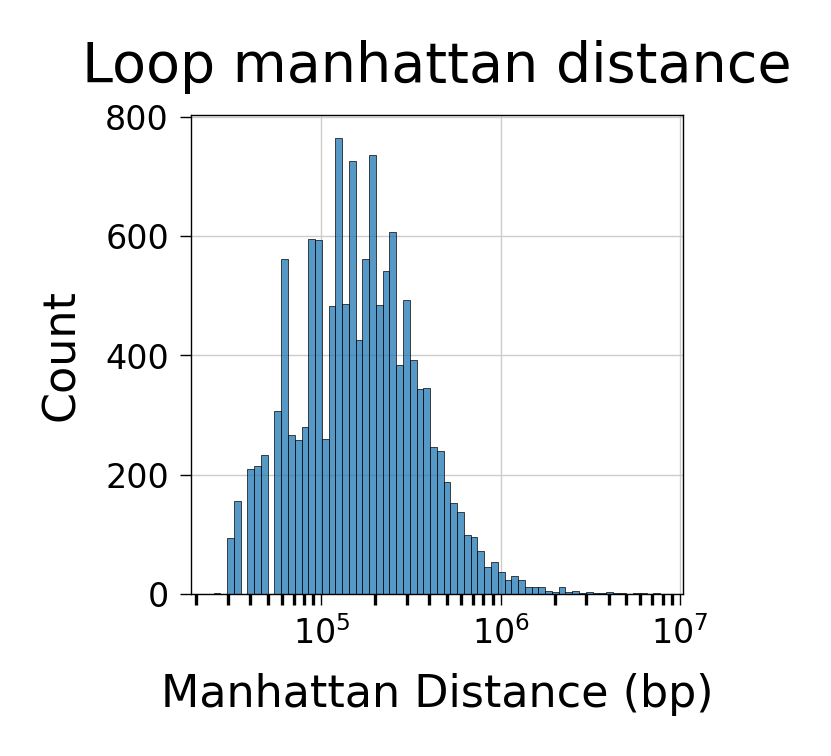

In [176]:
from supp_figures_plotting_functions import make_manhattan_distance_plot

make_manhattan_distance_plot(all_loops)

F. DESeq2 MA Plot

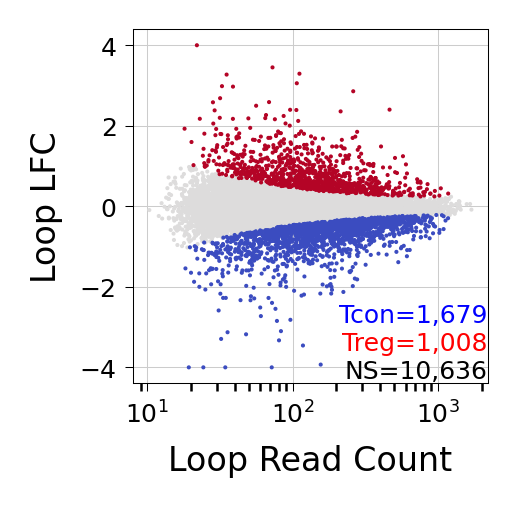

In [172]:
from supp_figures_plotting_functions import deseq_ma_plot

fig = deseq_ma_plot(all_loops.to_dataframe(header=None))
fig.savefig("./plots/paper/s2/deseq_maplot.pdf", bbox_inches='tight')

Compare Jesse/Ye loops with our loops

Imported plotting functions


/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:260: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['bin1_start'], df['bin1_end'] = zip(*new_coords_bin1)
/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['bin2_start'], df['bin2_end'] = zip(*new_coords_bin2)


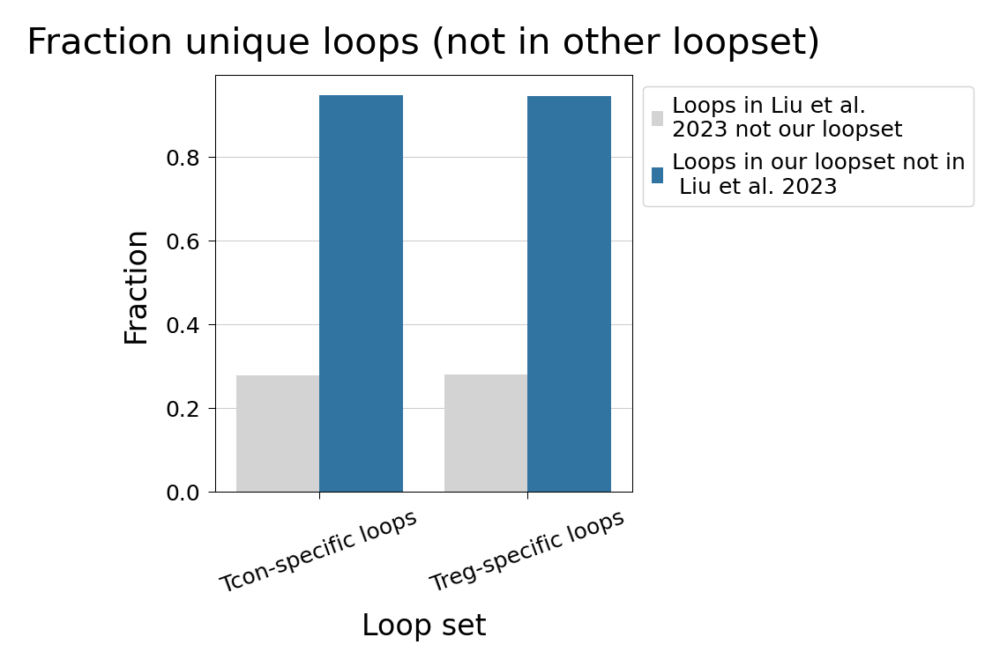

In [186]:
from supp_figures_plotting_functions import compare_jesseye_loops_to_our_loops

compare_jesseye_loops_to_our_loops(loopdict)

#### Figure S3

In [307]:
import aux_functions
from aux_functions import *

In [73]:
%autoreload 2
from supp_figures_plotting_functions import process_deseq2_output

d = process_deseq2_output()

Imported plotting functions


A. Venn Diagrams

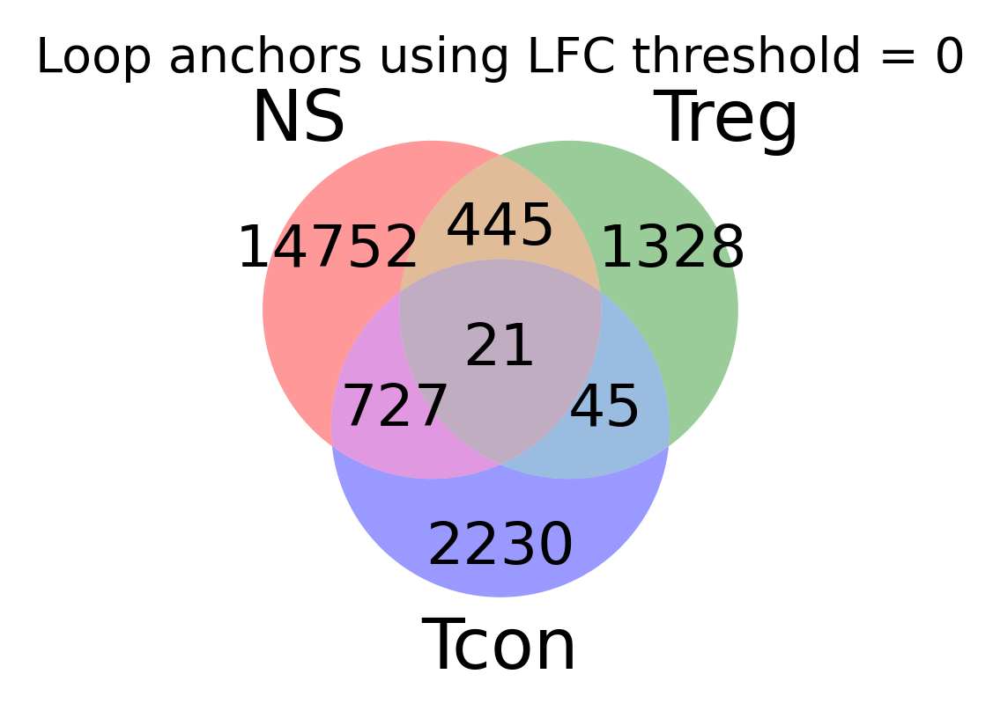

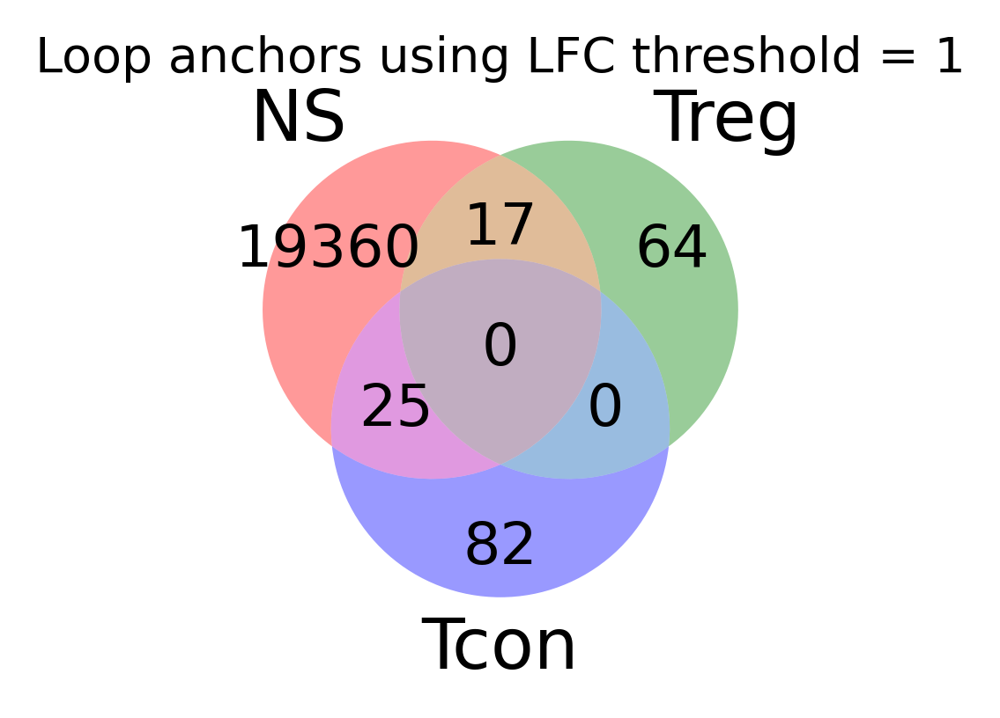

In [183]:
from supp_figures_plotting_functions import make_venn_diagram_plot_s3

make_venn_diagram_plot_s3()


B. LFC plots

Imported plotting functions
1
1


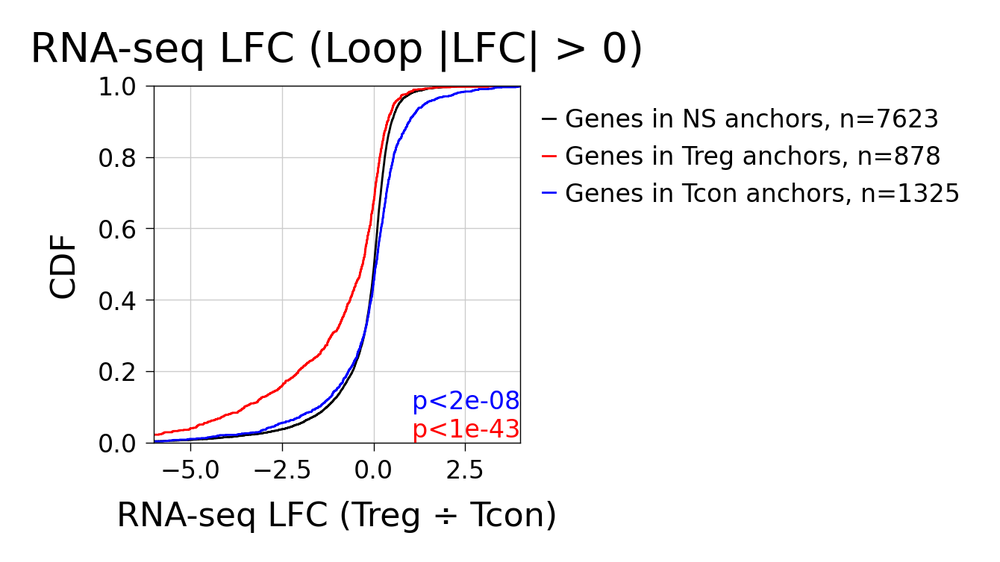

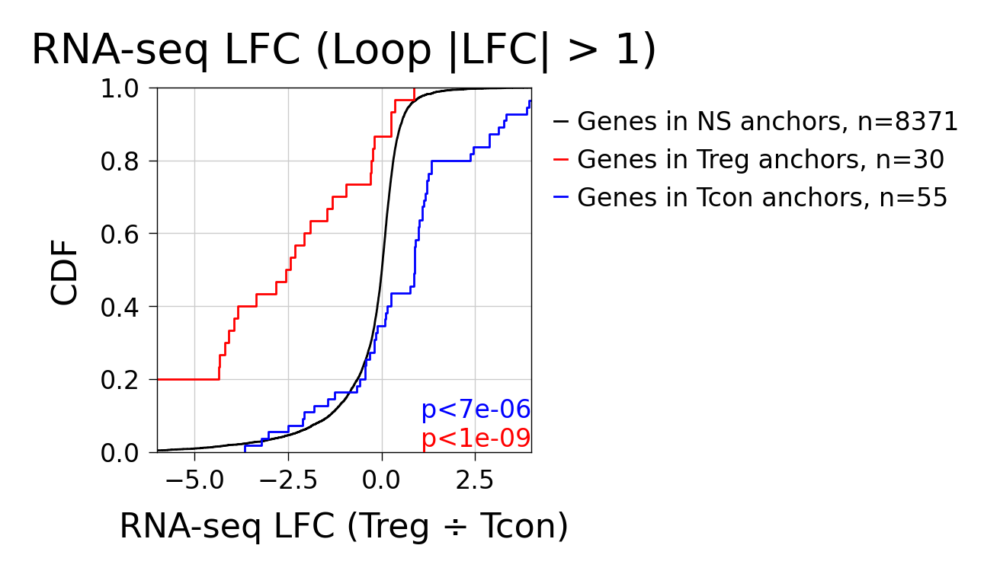

In [43]:
%autoreload 2
from supp_figures_plotting_functions import make_loop_lfc_cdf_plot

make_loop_lfc_cdf_plot(resting_gene_bedtool)

C. TAD Boundaries

Imported plotting functions


Imported plotting functions
3
Could not fetch in  Treg  error:  Genomic region out of bounds: [119750000, 120155000)
Could not fetch in  Treg  error:  Genomic region out of bounds: [181735000, 182140000)
Could not fetch in  Treg  error:  Genomic region out of bounds: [145045000, 145450000)
Done with Treg


/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:269: RuntimeWarning: Mean of empty slice
/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:270: RuntimeWarning: Mean of empty slice
/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:278: RuntimeWarning: divide by zero encountered in log2


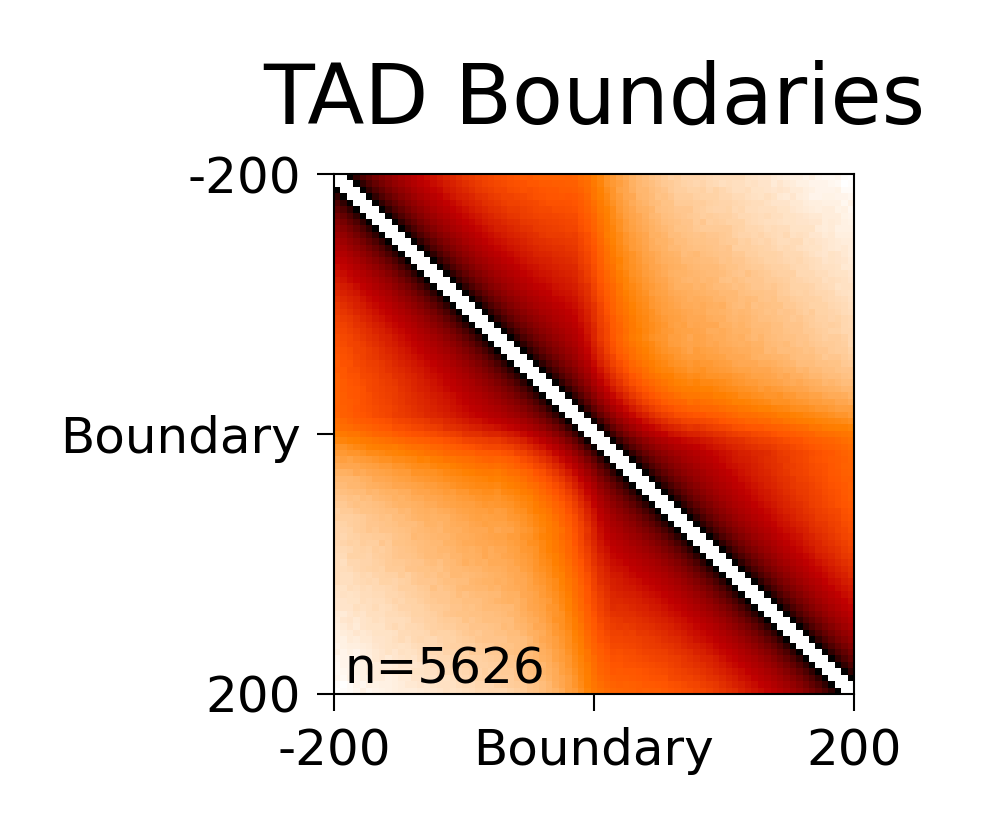

In [316]:
%autoreload 2

from supp_figures_plotting_functions import make_tad_plot2
from apa_figures import apa_diag_nonorm

make_tad_plot2()

TSS with loops

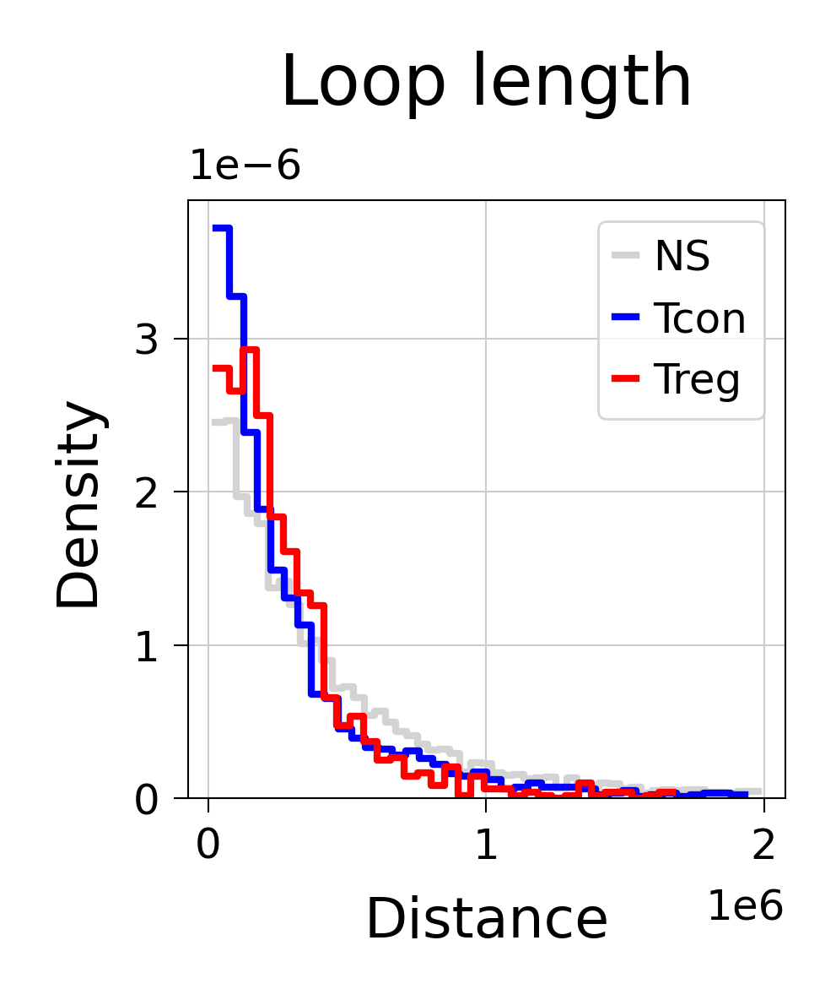

In [320]:
from supp_figures_plotting_functions import make_looplength_plot

make_looplength_plot(loopdict, loop_colordict)

G

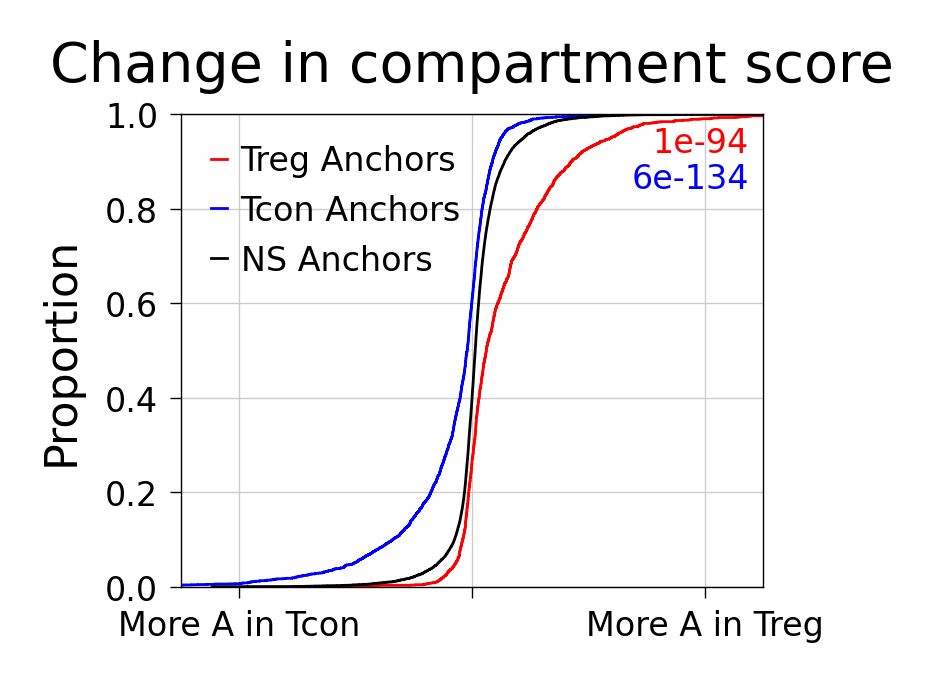

In [1119]:
treg_ancs = np.where(get_col(pbt.BedTool(all_ind_to_region_50kb).intersect(anchordict['Treg'], c=True), -1).astype(int)>0)[0]
tcon_ancs = np.where(get_col(pbt.BedTool(all_ind_to_region_50kb).intersect(anchordict['Tcon'], c=True), -1).astype(int)>0)[0]
ns_ancs = np.where(get_col(pbt.BedTool(all_ind_to_region_50kb).intersect(anchordict['NS'], c=True), -1).astype(int)>0)[0]

d = (my_treg_comp_50kb-my_tcon_comp_50kb)
fig, axs = init_subplots_exact(1, 1, fgsz=(37*mm, 30*mm), dpi = 200)
sns.ecdfplot(d[treg_ancs], color='red', ax=axs, label=f'Treg Anchors')
sns.ecdfplot(d[tcon_ancs], color='blue', ax=axs, label=f'Tcon Anchors')
sns.ecdfplot(d[ns_ancs], color='black', ax=axs, label=f'NS Anchors')

treg_pstr = format_pvalue(nonan_test(d[treg_ancs], d[ns_ancs])[1])
tcon_pstr = format_pvalue(nonan_test(d[tcon_ancs], d[ns_ancs])[1])
plt.text(0.975, .975, treg_pstr, color='red', transform = plt.gca().transAxes, va='top', ha='right', fontsize=6)
plt.text(0.975, .9, tcon_pstr, color='blue', transform = plt.gca().transAxes, va='top', ha='right', fontsize=6)
plt.xticks([-1, 0, 1])
plt.xlim([-1.25, 1.25])
axs.set_xticklabels(["More A in Tcon", '', 'More A in Treg'])
plt.title("Change in compartment score")
plt.legend(frameon=False)
fig.savefig('./plots/paper//compartment_score_loop_anchors.pdf', bbox_inches='tight')

Fraction of TSS with loops

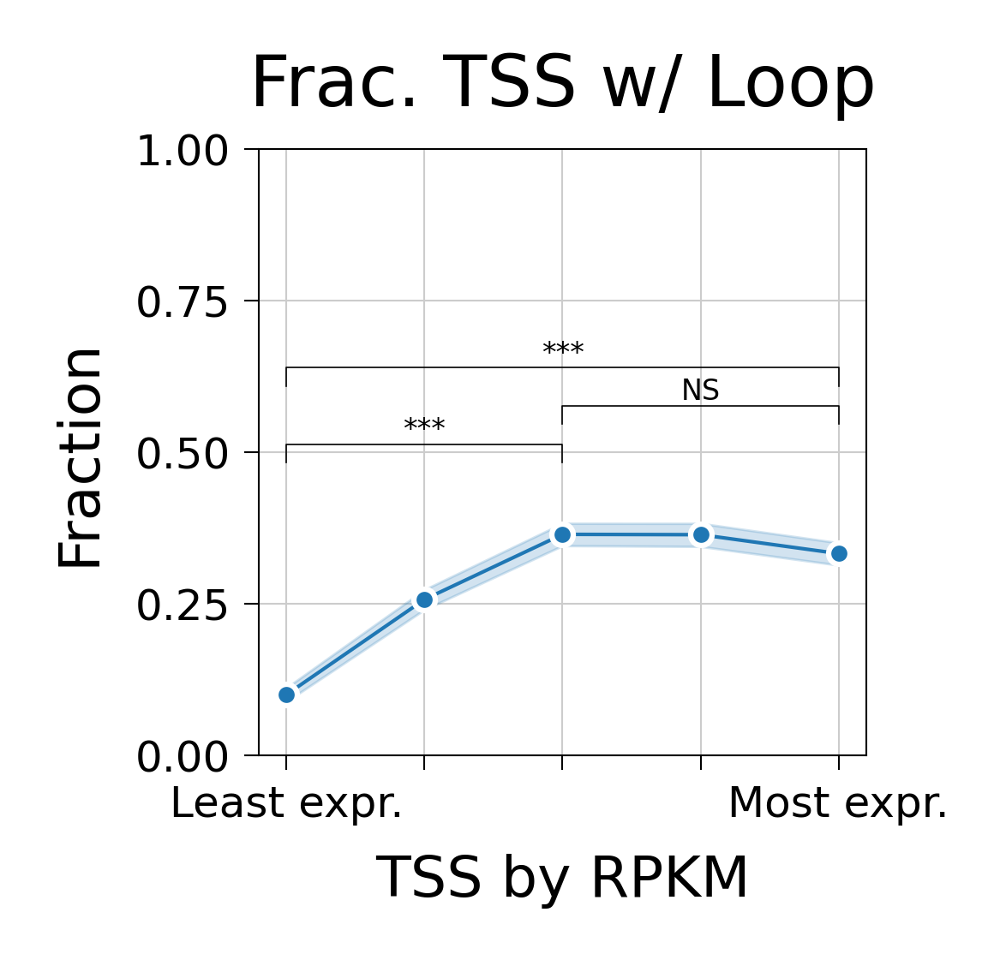

In [1472]:
v = make_tss_lineplot3(gene_dict['Resting'], anchordict)

In [1471]:
from plot_pvals import add_stat_annotation_boxplot_no_hue
def make_tss_lineplot3(resting_gene_lfcs, anchordict):
    idx = resting_gene_lfcs.index[my_tss_df.set_index('gene_name').loc[resting_gene_lfcs.index]['chrom'].isin(add_chr_to_list(parsed_chroms))]
    transcribed_genes = resting_gene_lfcs.loc[idx]
    v = transcribed_genes['rpkm']
    
    v = v.loc[idx]
    
    # v = transcribed_genes['itemRgb'][idx]
    # return v, transcribed_genes['itemRgb'][idx]
    quantile_cut = pd.qcut(v, np.linspace(0, 1, 6))
    
    # Accessing the codes (integer representation) of the bins
    categorical_data = quantile_cut.cat
    codes = categorical_data.codes

    tmp_gene_bedtool = pbt.BedTool.from_dataframe(my_tss_df.set_index('gene_name').loc[idx][['chrom', 'start', 'end']])
    anchors = add_chr_to_bedtool(anchordict['All'])
    has_anchor = pd.Series(get_col(tmp_gene_bedtool.intersect(anchors, c=True), -1).astype(int),
                          index = v.index) > 0
    data = pd.concat([codes, has_anchor, v], axis=1)
    data.columns = ['quantile', 'has_anchor', 'rpkm']
    
    data['quantile'] /= data['quantile'].max()
    fig, ax = init_subplots_exact(1, 1, fgsz=(30*mm, 30*mm), dpi=300)
    sns.lineplot(data=data, x='quantile', y='has_anchor', marker='o', markersize=3)
    # plt.plot(arr(quantiles) / np.max(arr(quantiles)), ls, marker='o', markersize=2)
    plt.xlabel("TSS by RPKM")
    plt.ylabel("Fraction")
    plt.title("Frac. TSS w/ Loop")
    plt.yticks([0, .25, .5, .75, 1])
    plt.xticks([0, .25, .5, .75, 1])
    
    _, p = scipy.stats.fisher_exact([ [(data[data==1]['has_anchor'] > 0).sum(), (data[data==1]['has_anchor'] == 0).sum()],
                                     [(data[data==0]['has_anchor'] > 0).sum(), (data[data==0]['has_anchor'] == 0).sum()],
                                    ])
    add_stat_annotation_boxplot_no_hue(ax, data, 'quantile', 'has_anchor',
                                      [0, .25, .5, .75, 1], [
                                          [0, .5],
                                          [.5, 1],
                                          [0, 1],
                                              ], ymax=.4, h=.03,
                                       x_skip = 1/4,
                                      )
    plt.ylim([0, 1])    
    ax.set_xticklabels(['Least expr.', '', '', '', 'Most expr.'])
    fig.savefig('./plots/paper/s3/frac_genes_in_loops.pdf', bbox_inches='tight', dpi=300)
    plt.show()


In [887]:
def make_tss_lineplot2(resting_gene_lfcs, gene_lengths, my_tss_df, anchordict):
    transcribed_genes = resting_gene_lfcs
    idx = gene_lengths.index.intersection(transcribed_genes.index)
    
    gene_lengths = gene_lengths.loc[idx]
    transcribed_genes = transcribed_genes.loc[idx]
    my_tss_df = my_tss_df.set_index('gene_name').loc[idx]

    v = transcribed_genes['itemRgb'] / gene_lengths

    quantile_cut = pd.qcut(v, np.linspace(0, 1, 10))
    
    # Accessing the codes (integer representation) of the bins
    categorical_data = quantile_cut.cat
    codes = categorical_data.codes

    ls = []
    readcount = []
    quantiles = []
    for i in sorted(codes.unique()):
        genesoi = codes.index[codes == i]
        subdf = my_tss_df.loc[genesoi].reset_index()
        rpkms = v.loc[genesoi]
        tmp_gene_bedtool = pbt.BedTool.from_dataframe(subdf[['chrom', 'start', 'end']])
        ls.append(bedprop(tmp_gene_bedtool, add_chr_to_bedtool(anchordict['All'])))
        readcount.append(rpkms.mean())
        quantiles.append(i)
    
    fig, ax = init_subplots_exact(1, 1, fgsz=(30*mm, 30*mm), dpi=300)
    plt.plot(arr(quantiles) / np.max(arr(quantiles)), ls, marker='o', markersize=2)
    plt.xlabel("TSS by gene expression")
    plt.ylabel("Fraction")
    plt.title("Frac. TSS w/ Loop")
    plt.yticks([0, .25, .5, .75, 1])
    plt.xticks([0, .25, .5, .75, 1])
    ax.set_xticklabels(['Least expr.', '', '', '', 'Most expr.'])
    fig.savefig('./plots/paper/s3/frac_genes_in_loops.pdf', bbox_inches='tight', dpi=300)
    plt.show()


I. Loops crossing TAD boundaries

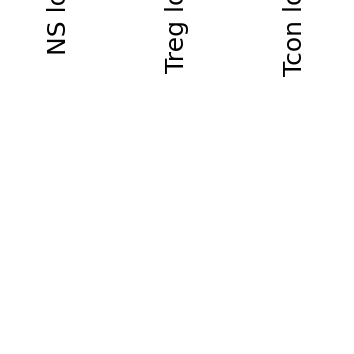

In [2420]:
from supp_figures_plotting_functions import loop_tad_overlap

loop_tad_overlap(loopdict, tad_boundaries)

### Supplement 4

Check coolbox plotting notebook

### Supplement 5

ABC plotting

### Supplement 6

In [227]:
from importlib import reload
import call_compartments
reload(call_compartments)
from call_compartments import *
import bbi

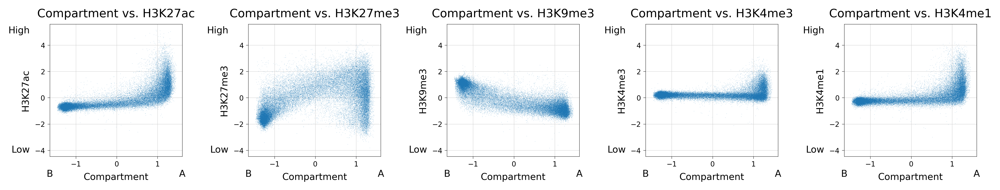

In [222]:
from supp_figures_plotting_functions import make_chip_compartment_plots

fig = make_chip_compartment_plots(my_treg_comp_50kb, bw_val_df_all_50kb)
fig.savefig('./plots/paper/s7/compartment_lfc_corr.pdf', bbox_inches='tight', dpi=1000)

B.

Imported plotting functions


/Genomics/argo/users/gdolsten/.conda/envs/mamba/envs/new_3dgenome/lib/python3.10/site-packages/seaborn/axisgrid.py:1760: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  f.tight_layout()


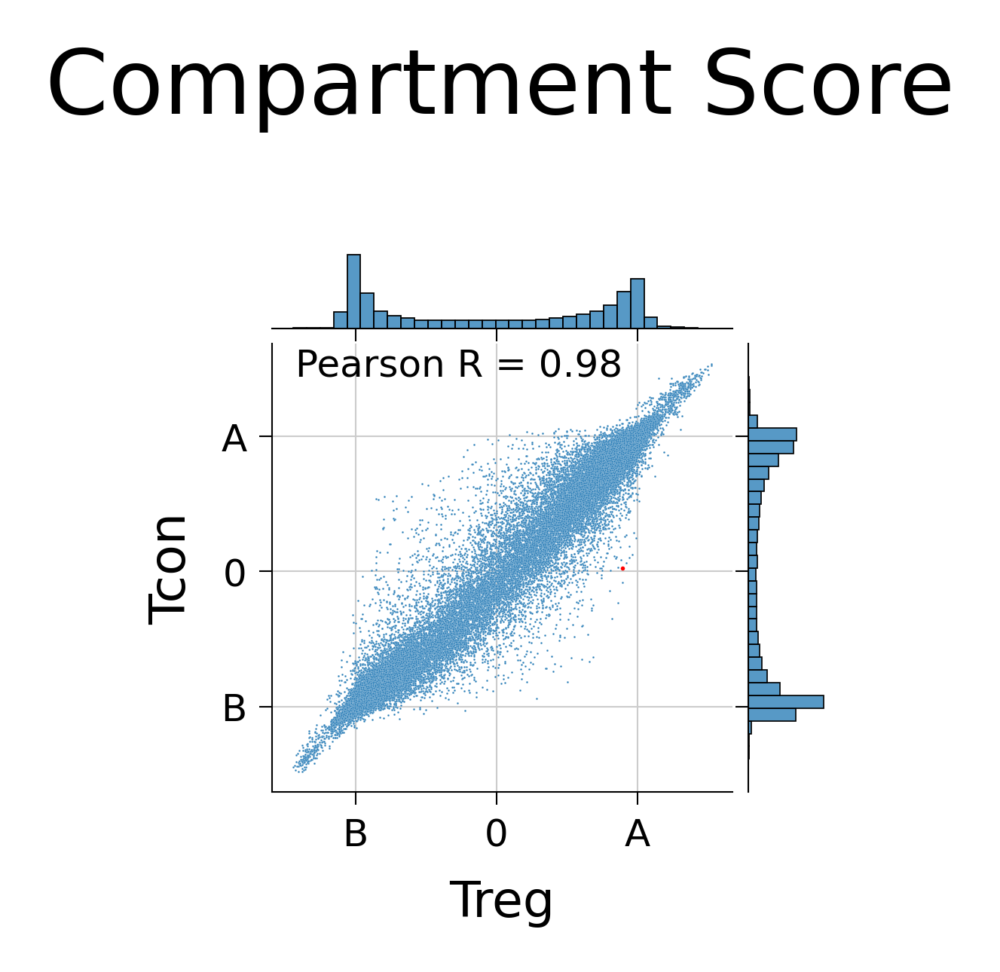

In [217]:
from supp_figures_plotting_functions import make_compartment_jointplot

fig = make_compartment_jointplot(my_treg_comp_50kb, my_tcon_comp_50kb)


### Figure S7

A. 

/Genomics/argo/users/gdolsten/.conda/envs/mamba/envs/new_3dgenome/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,


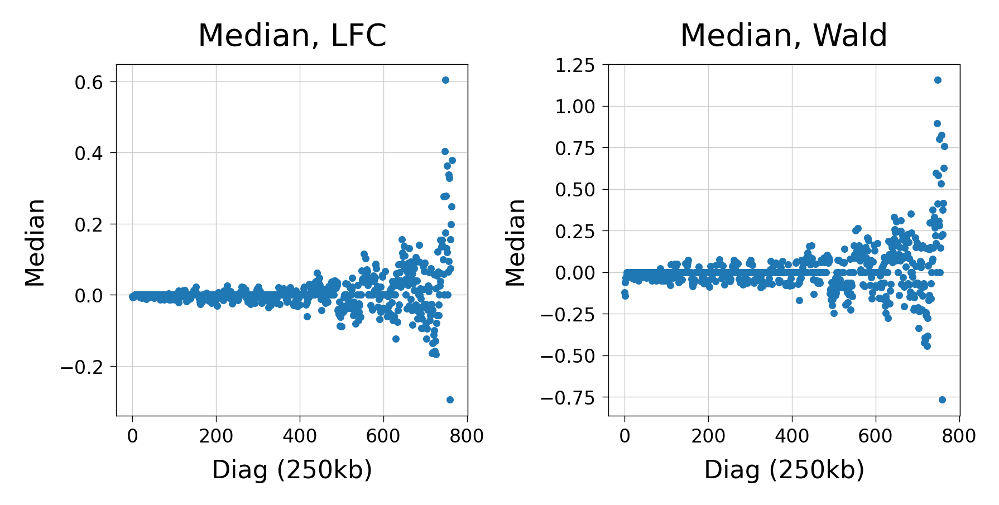

In [331]:
from supp_figures_plotting_functions import balanced_supplement_plots

fig = balanced_supplement_plots(deseq_lfc_mat, deseq_effect_mat)


B. Gene DESeq LFCs vs. A/B Compartment

Imported plotting functions


/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:450: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


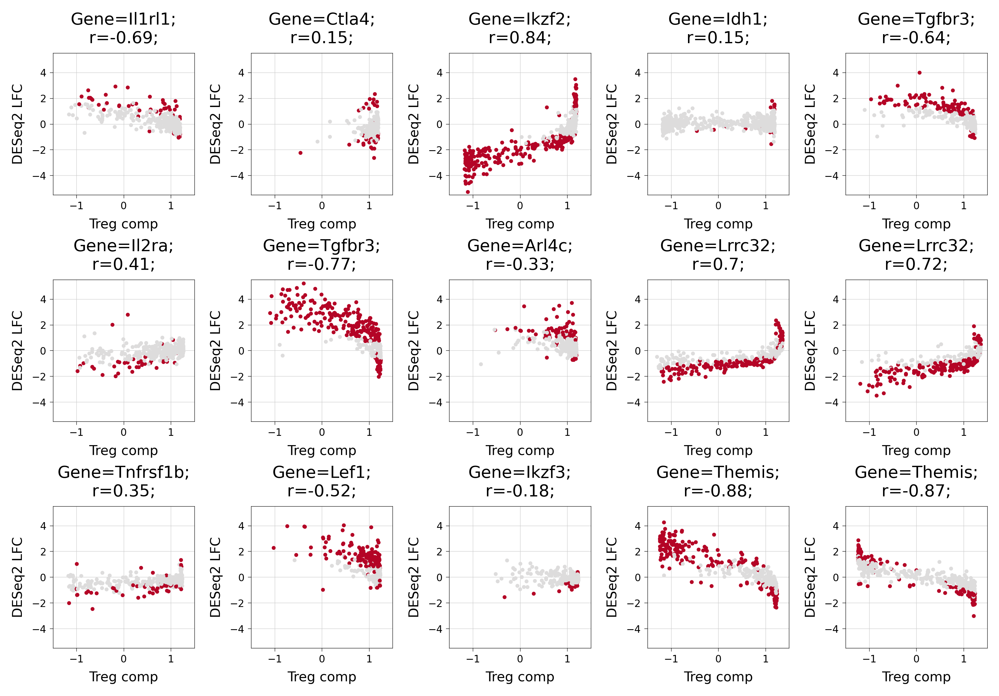

In [337]:
from supp_figures_plotting_functions import deseq_lfc_vs_compartment_fc

fig = deseq_lfc_vs_compartment_fc(all_ind_to_region, chrom_to_start, chrom_to_end, my_treg_comp, deseq_lfc_mat, deseq_pval_mat, ind_to_gene)

C. DESeq LFC vs. A/B Compartment

Imported plotting functions


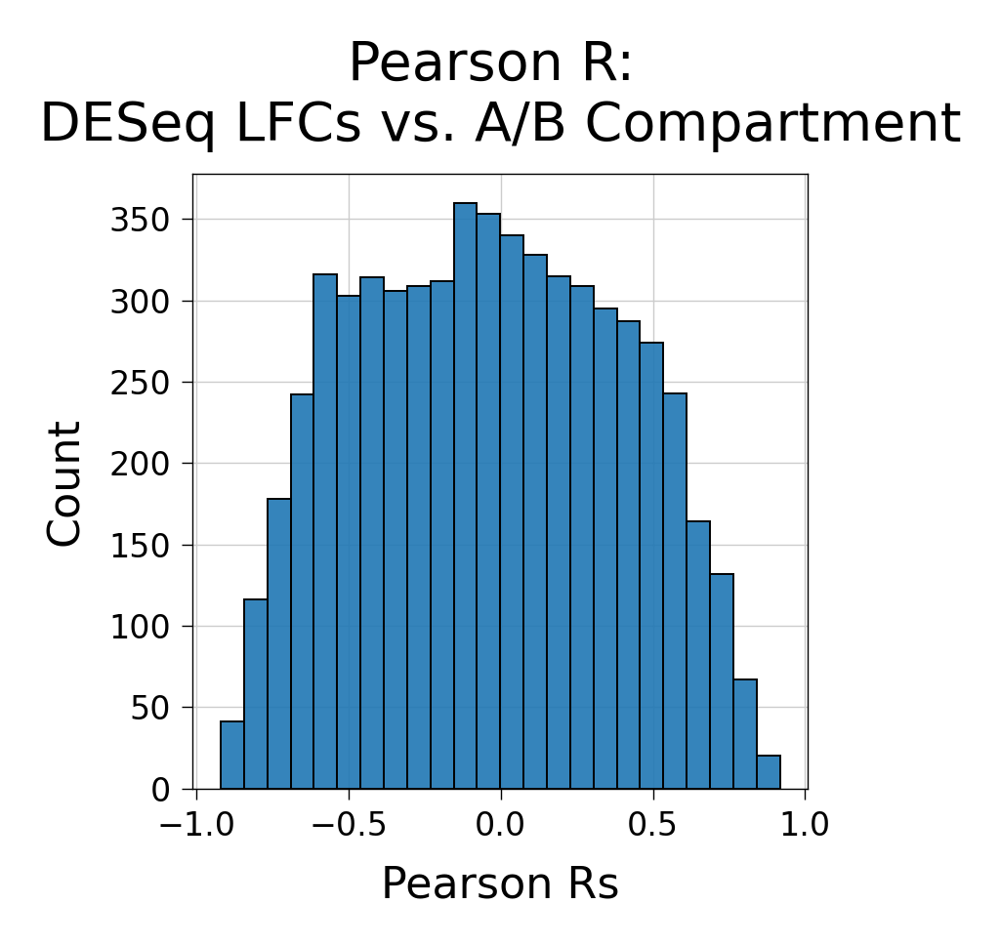

In [339]:
from supp_figures_plotting_functions import deseq_lfc_vs_ab_compartment_correlations

fig = deseq_lfc_vs_ab_compartment_correlations(all_ind_to_region, chrom_to_start, chrom_to_end, my_treg_comp, deseq_lfc_mat, deseq_effect_mat)


D. Genes per 250kb bin

Imported plotting functions


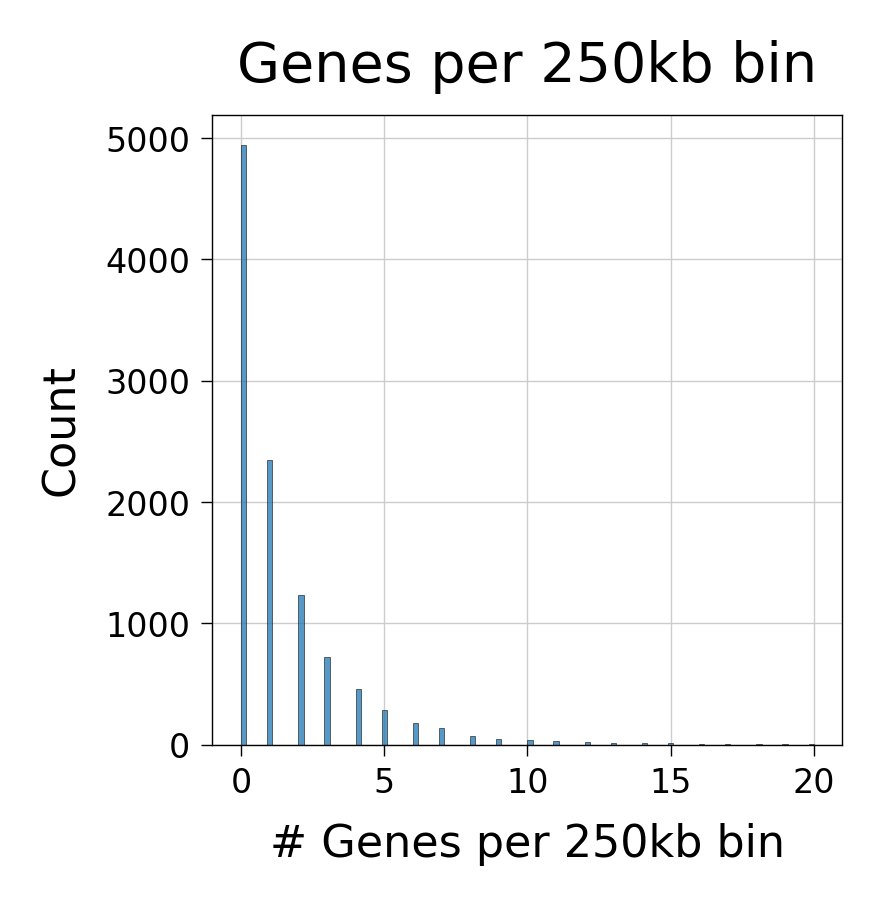

In [207]:
from supp_figures_plotting_functions import n_genes_per_bin

fig = n_genes_per_bin(ind_to_gene, all_ind_to_region)

E. Ikzf2 DESeq2-Histone ChIP Correlation

Imported plotting functions


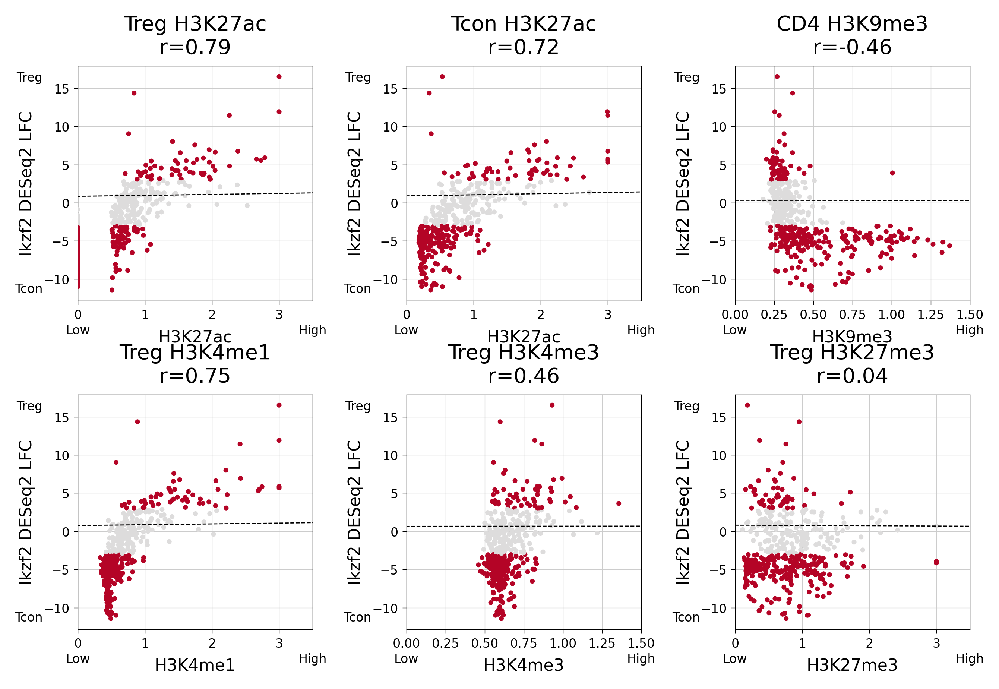

In [341]:
from supp_figures_plotting_functions import ikzf2_histone_correlations

fig = ikzf2_histone_correlations(bw_val_df_all_250kb, deseq_effect_mat, deseq_pval_mat)

F. Reproducibility of DESeq2

In [1047]:
from supp_figures_plotting_functions import deseq2_reproducibility_heatmap

g = deseq2_reproducibility_heatmap(deseq_pval_mat, deseq_effect_mat)
g.cax.set_ylabel('Z-score')
g.fig.savefig('./plots/paper/s6/ikzf2_replicate_heatmap.pdf', bbox_inches='tight')


/tmp/ipykernel_717572/3239441578.py:1: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.


### Supplement 8

A. Chromosome-wide DESeq2 Heatmaps

5


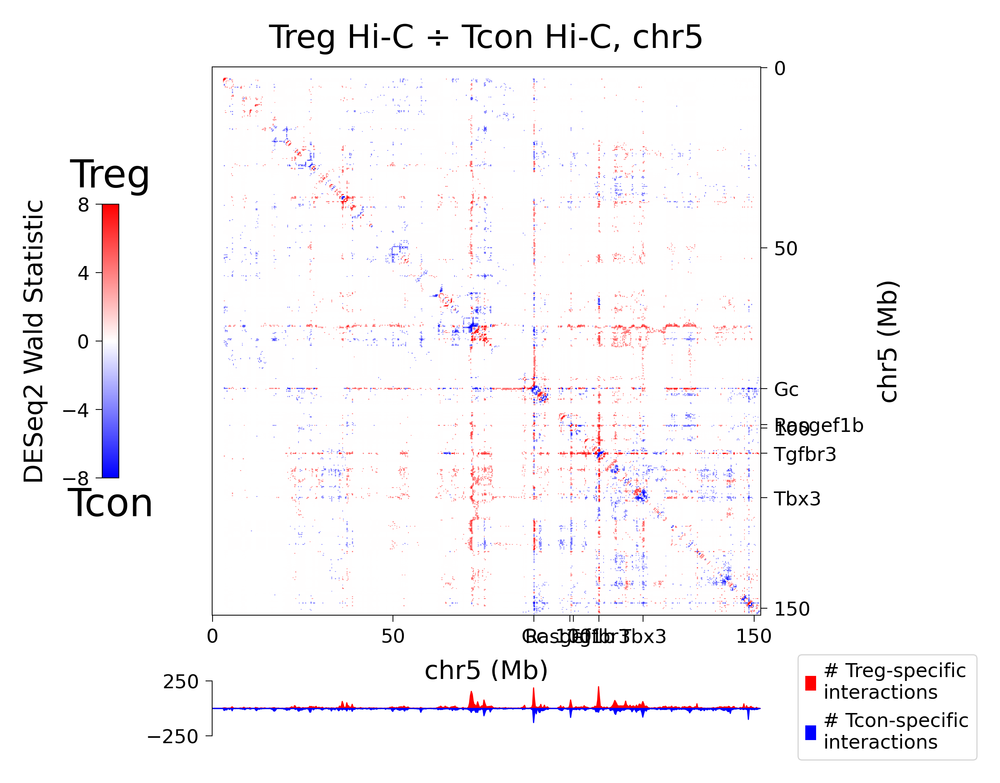

In [352]:
from supp_figures_plotting_functions import make_chromosomewide_deseq_plot

label_list = [[3208, 'Tgfbr3'], [3176, 'Rasgef1b'], [3136, 'Gc'], [3257, 'Tbx3']]
fig = make_chromosomewide_deseq_plot(deseq_effect_mat, deseq_pval_mat, '5', chrom_to_start, chrom_to_end, label_list, dpi = 300)
fig.savefig('./plots/paper/s8/chr5.pdf', bbox_inches='tight', dpi = 300)

4


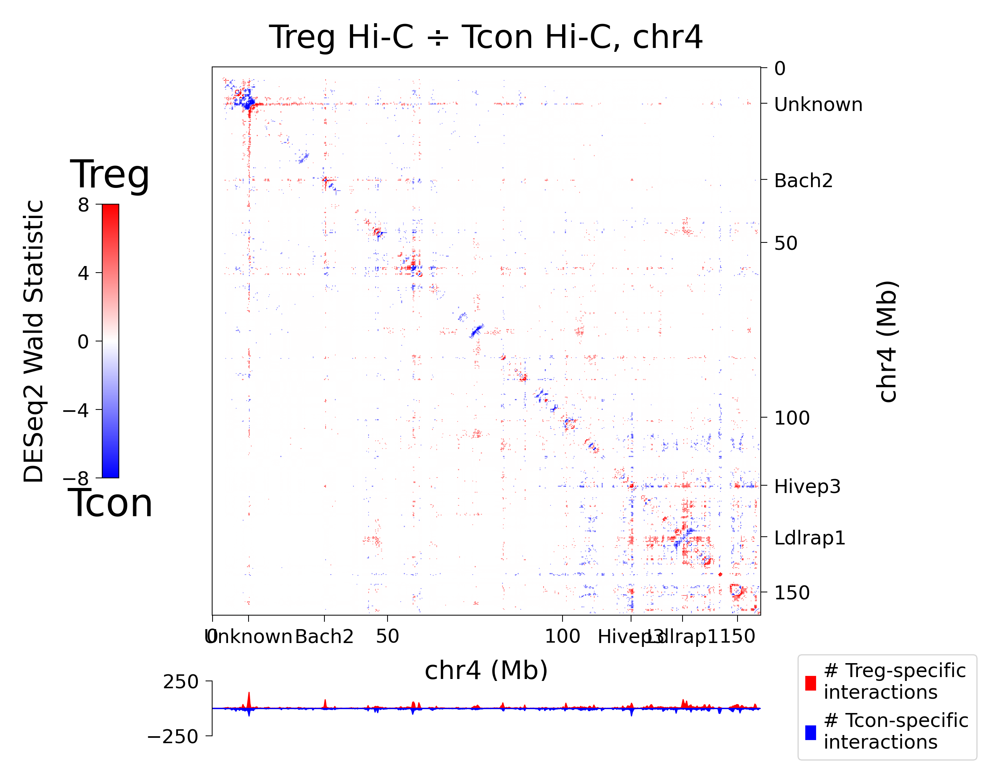

In [205]:
from supp_figures_plotting_functions import make_chromosomewide_deseq_plot

label_list = [[2281, 'Bach2'], [2194, 'Unknown'], [2631, 'Hivep3'], [2690, 'Ldlrap1']]
fig = make_chromosomewide_deseq_plot(deseq_effect_mat, deseq_pval_mat, '4', chrom_to_start, chrom_to_end, label_list, dpi = 300)
fig.savefig('./plots/paper/s8/chr4.pdf', bbox_inches='tight', dpi = 300)

In [ ]:
from supp_figures_plotting_functions import make_chromosomewide_deseq_plot

label_list = [[1287, 'Atp8b4'], [1254, 'Gm13986'], [981, 'Lypd6b'], [1325, 'Plcb4']]
fig = make_chromosomewide_deseq_plot(deseq_effect_mat, deseq_pval_mat, '2', chrom_to_start, chrom_to_end, label_list, dpi = 300)
fig.savefig('./plots/paper/s8/chr2.pdf', bbox_inches='tight', dpi = 300)

B. Differential interactions manhattan plots

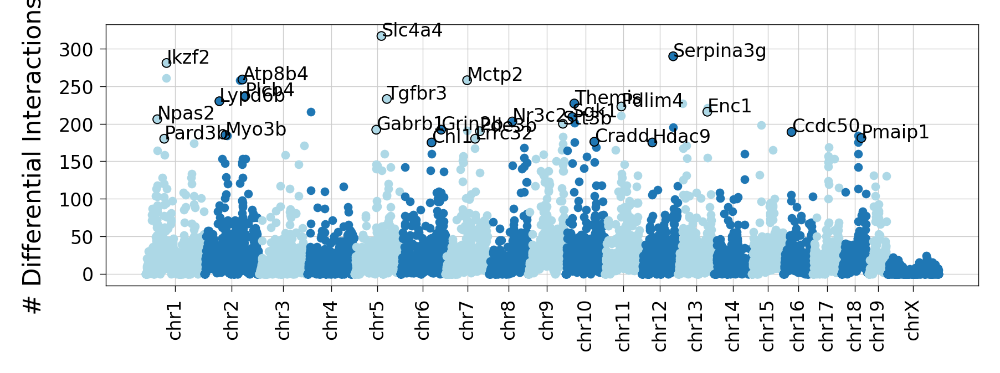

In [223]:
from supp_figures_plotting_functions import make_manhattan_plot

fig = make_manhattan_plot(deseq_pval_mat, all_ind_to_region, chrom_to_start, chrom_to_end, ind_to_gene, bin_cutoff=0, label_cutoff=175, dpi=200)
fig.savefig('./plots/paper/s8/manhattan_plot.pdf', bbox_inches='tight')

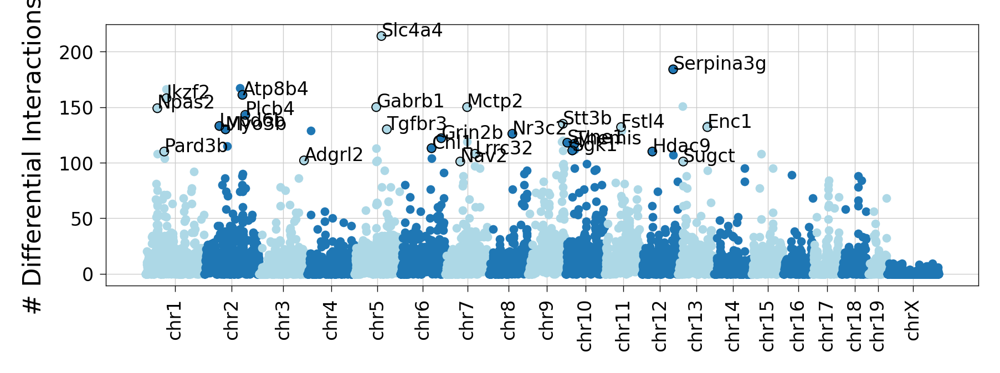

In [224]:
from supp_figures_plotting_functions import make_manhattan_plot

fig = make_manhattan_plot(deseq_pval_mat, all_ind_to_region, chrom_to_start, chrom_to_end, ind_to_gene, bin_cutoff=80, label_cutoff=100, dpi=200)
fig.savefig('./plots/paper/s8/manhattan_plot_distal.pdf', bbox_inches='tight')

### S9-S10

A-B.

All plots for long-range contacts shown in (Secondary File)


### S10.5

A-D.

In [1297]:
from supp_figures_plotting_functions import make_replicate_plot

make_replicate_plot(replicate_cooldict, all_ind_to_region, ind_to_gene)

Imported plotting functions


### Figure S11

(965, 5)


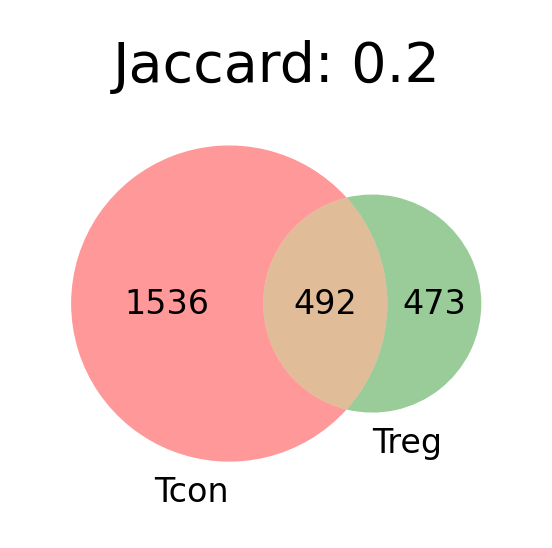

(14482, 5)


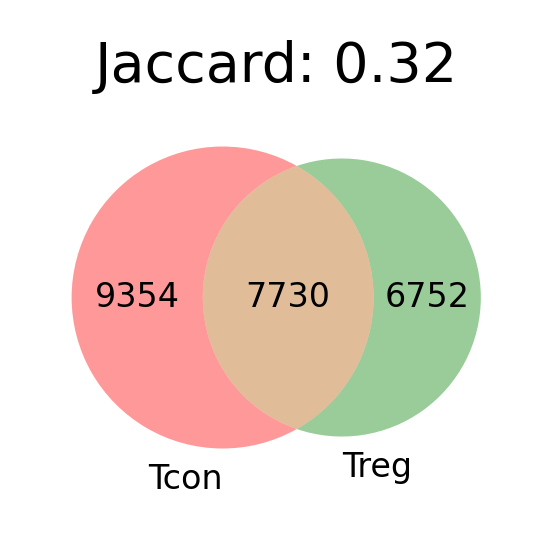

In [309]:
from supp_figures_plotting_functions import generate_metadomain_venn_diagrams

generate_metadomain_venn_diagrams(deseq_pval_mat, all_intra_treg_metadomains, all_intra_tcon_metadomains)

B. metadomain volcano plot

Imported plotting functions


/Genomics/pritykinlab/gabe/jupys/tregs/./code/volcano_plot.py:23: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  plt.scatter(x, y, zorder = 3, c = colors, linewidth=0, s = s, rasterized=rasterized, vmin=vmin, vmax=vmax, alpha=alpha)


ignoring None-Ptprt
ignoring Themis-None
ignoring None-Dusp6
ignoring Ankmy2-Dock4
ignoring Ank-None
ignoring Ank-None
ignoring Trio-None
ignoring Trio-None
ignoring Rftn1-None
ignoring None-None
ignoring Csnk1g3-Lmnb1
ignoring None-None


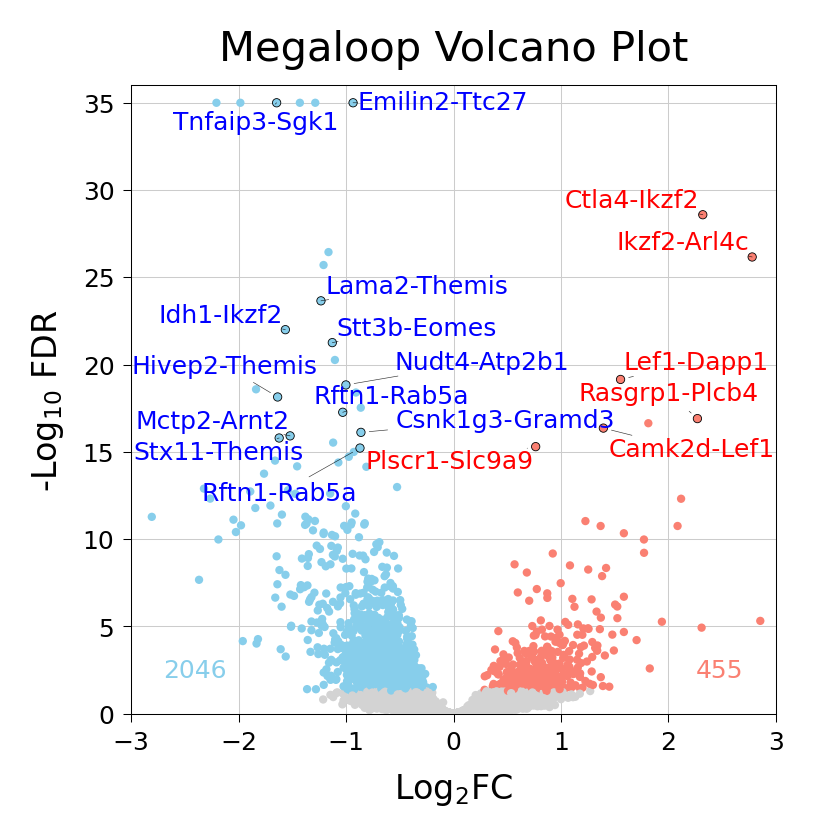

In [311]:
from volcano_plot import volcano_plot
from supp_figures_plotting_functions import generate_metadomain_volcano_plot

ignore_set = { 'Trio-Ctnnd2', 'Ank-Ctnnd2', 'Fam105a-Ctnnd2', 'Dazl-Kcnh8', 'AY702103-Efhb', 'Ankmy2-Dock4', 'Csnk1g3-Lmnb1', 'Mctp2-Cemip' }
generate_metadomain_volcano_plot(all_intra_metadomains,  deseq_lfc_mat,  deseq_pval_mat,  
                               ind_to_gene,  ignore_set,  './plots/paper/s11/intra_volcano_plot.pdf')

C. Pileup

All pileups shown elsewhere

D. 

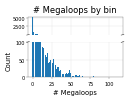

In [267]:
from supp_figures_plotting_functions import generate_metadomain_count_plot
generate_metadomain_count_plot(deseq_effect_mat, all_intra_metadomains, cutoff=4)

E. 

Imported plotting functions


/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:972: UserWarning: The following kwargs were not used by contour: 'label'


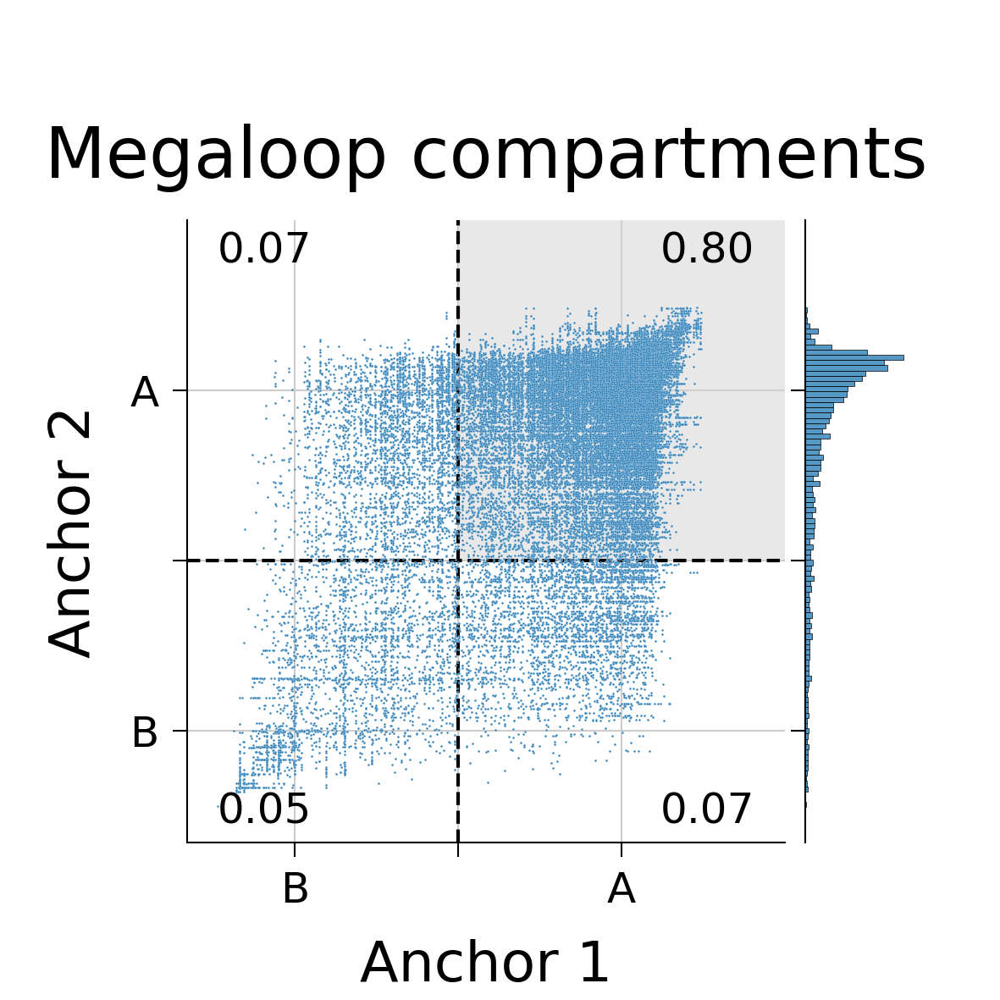

In [1309]:
from supp_figures_plotting_functions import generate_metadomain_compartment_plot

fig = generate_metadomain_compartment_plot(all_intra_metadomains, my_treg_comp, ACOMPARTMENT_CUTOFF_LOOSE, )
fig.savefig('./plots/paper/s11/compartment_of_metadomains.pdf', dpi=1000)    

In [1313]:
def make_shrunk_mat(input_mat, chrom_n, binarize=True, sum=True):
    created_n = len(input_mat)
    fullmat = np.zeros((5*chrom_n, 5*chrom_n))
    if binarize:
        fullmat[:created_n, :created_n] = (input_mat > 0)
    else:
        fullmat[:created_n, :created_n] = (input_mat)
    if sum:
        shrunkmat = fullmat.reshape(chrom_n, 5, chrom_n, 5).sum(axis=(1, 3))
    else:
        shrunkmat = fullmat.reshape(chrom_n, 5, chrom_n, 5).max(axis=(1, 3))
    return shrunkmat

In [1363]:
metadomain_mat_pref = './metadomain_prominent_peak_output'
n = len(all_ind_to_region)

all_dataframes = []
for rep in ['treg_rep1_', 'treg_rep2_', 'treg_rep3_', 'treg_', 'tcon_rep1_', 'tcon_rep2_', 'tcon_rep3_', 'tcon_',]:
    for chrom in PARSED_CHROMS_nochr:
        s, e = chrom_to_start[chrom], chrom_to_end[chrom]
        chrom_n = e - s
        mat = np.load(f'{metadomain_mat_pref}/{rep}res=50000_intrachromosomal_chrL={chrom}_chrR={chrom}_collapsed_logp_mat.npy')
        shrunkmat = make_shrunk_mat(mat, chrom_n)
        i, j = np.where(shrunkmat)
        data = pd.DataFrame()
        data['i'] = i
        data['j'] = j
        data['chrom'] = chrom
        data['rep'] = rep
        all_dataframes.append(data)
results = pd.concat(all_dataframes, axis=0).value_counts(['i', 'j', 'chrom', 'rep']).reset_index(
    ).pivot(columns=['i', 'j', 'chrom'], index=['rep']).fillna(0)

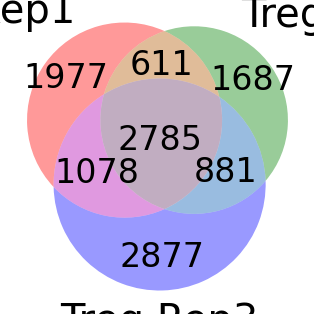

In [1354]:
fig, axs = init_subplots_exact(1, 1, fgsz=(40*mm, 40*mm), dpi = 100)
venn3([set(np.where(results.loc['treg_rep1_'])[0]), 
       set(np.where(results.loc['treg_rep2_'])[0]),
       set(np.where(results.loc['treg_rep3_'])[0])],
     ['Treg Rep1', 'Treg Rep2', 'Treg Rep3'],
     ax=axs,)
fig.savefig('./plots/paper/s11/longshot_reproducibility.pdf', bbox_inches='tight')

In [1376]:
jac_coeffs = pd.DataFrame()
conds = ['treg_rep1_', 'treg_rep2_', 'treg_rep3_', 'tcon_rep1_', 'tcon_rep2_', 'tcon_rep3_']
for i in conds:
    jacs = []
    for j in conds:
        num = ((results.loc[i]>0) & (results.loc[j]>0)).sum()
        den = ((results.loc[i]>0) | (results.loc[j]>0)).sum()
        jac = num / den
        jacs.append(jac)
    jac_coeffs[i] = jacs
jac_coeffs.index = jac_coeffs.columns

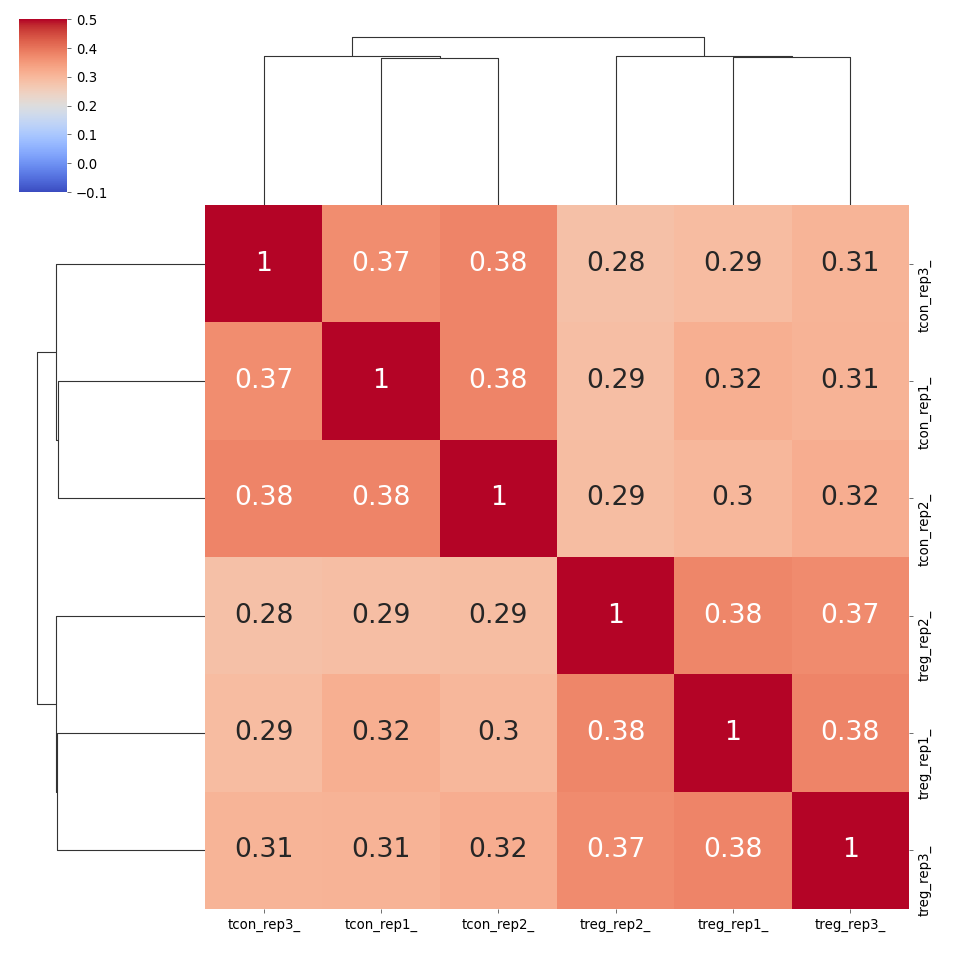

In [1387]:
g = sns.clustermap(jac_coeffs, vmax=.5, cmap='coolwarm', vmin=-.1, annot=True, figsize=(6, 6))
g.fig.savefig('./plots/paper/s11/longshot_reproducibility.pdf', bbox_inches='tight')

### S12

A-B. Chromosome heatmap clustering

/Genomics/pritykinlab/gabe/jupys/tregs/./code/aux_functions.py:190: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = scipy.cluster.hierarchy.linkage(matrix, method=method, metric=metric)
/Genomics/pritykinlab/gabe/jupys/tregs/./code/aux_functions.py:193: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  ordering = scipy.cluster.hierarchy.optimal_leaf_ordering(linkage, matrix)


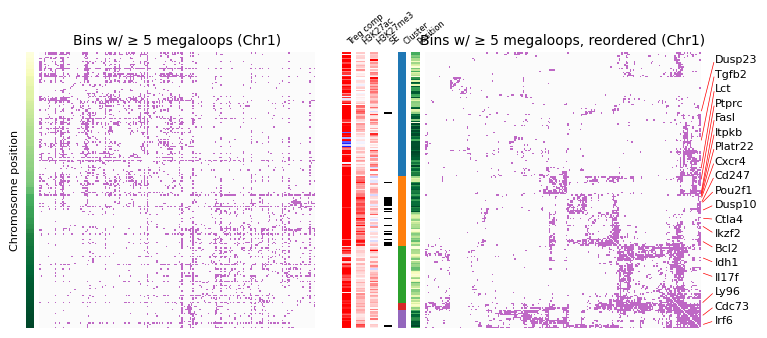

In [398]:
from supp_figures_plotting_functions import generate_chromosome_heatmap
logging.getLogger().setLevel(logging.CRITICAL)
intra_clustering = generate_chromosome_heatmap('1', all_intra_metadomains, gene_to_ind, SE_count, bw_val_df_all_250kb, 
                            my_treg_comp, chrom_to_start, chrom_to_end, cutoff=5, dpi=50,
                                              n_clusters=5)

10


/Genomics/pritykinlab/gabe/jupys/tregs/./code/aux_functions.py:176: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = scipy.cluster.hierarchy.linkage(matrix, method=method, metric=metric)
/Genomics/pritykinlab/gabe/jupys/tregs/./code/aux_functions.py:176: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = scipy.cluster.hierarchy.linkage(matrix, method=method, metric=metric)


10


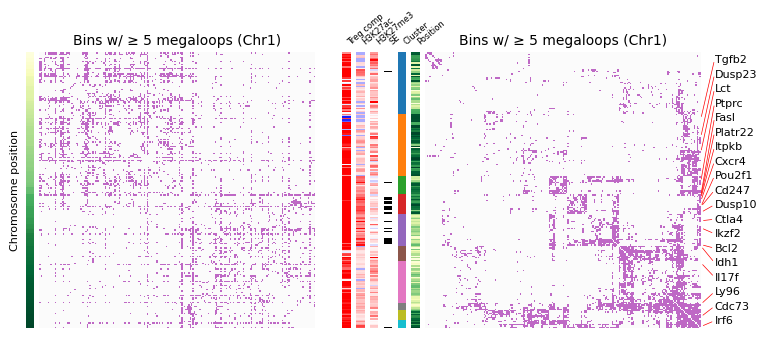

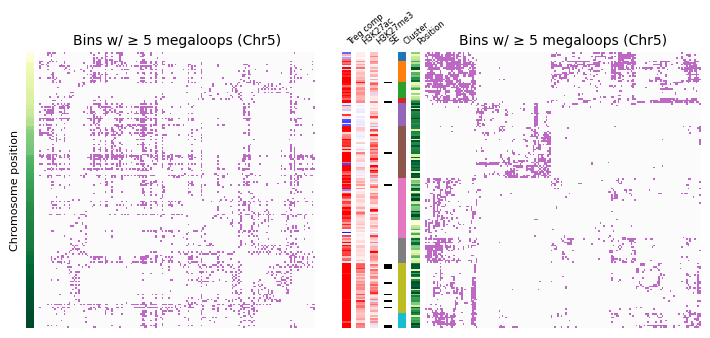

In [274]:
!mkdir -p plots/paper/s12

generate_chromosome_heatmap('5', all_intra_metadomains, gene_to_ind, SE_count, bw_val_df_all_250kb, 
                            my_treg_comp, chrom_to_start, chrom_to_end, cutoff=5, dpi=50)

/Genomics/pritykinlab/gabe/jupys/tregs/./code/aux_functions.py:176: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = scipy.cluster.hierarchy.linkage(matrix, method=method, metric=metric)


10


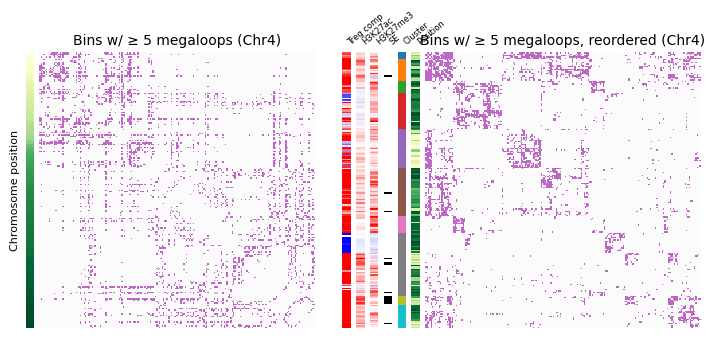

In [313]:
from supp_figures_plotting_functions import generate_chromosome_heatmap

generate_chromosome_heatmap('4', all_intra_metadomains, gene_to_ind, SE_count, bw_val_df_all_250kb, 
                            my_treg_comp, chrom_to_start, chrom_to_end, cutoff=5, dpi=50)


/Genomics/pritykinlab/gabe/jupys/tregs/./code/aux_functions.py:176: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = scipy.cluster.hierarchy.linkage(matrix, method=method, metric=metric)


10


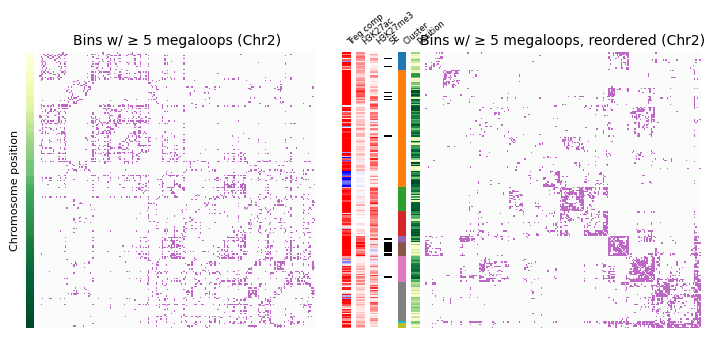

In [314]:
from supp_figures_plotting_functions import generate_chromosome_heatmap

generate_chromosome_heatmap('2', all_intra_metadomains, gene_to_ind, SE_count, bw_val_df_all_250kb, 
                            my_treg_comp, chrom_to_start, chrom_to_end, cutoff=5, dpi=50)


C. 

Pileups shown separately

### S13


[0.0, 5000000.0, 10000000.0, 15000000.0, 20000000.0, 25000000.0, 16625000.0] ['0 Mb', '5 Mb', '10 Mb', '15 Mb', '20 Mb', '25 Mb', 'Ly96']


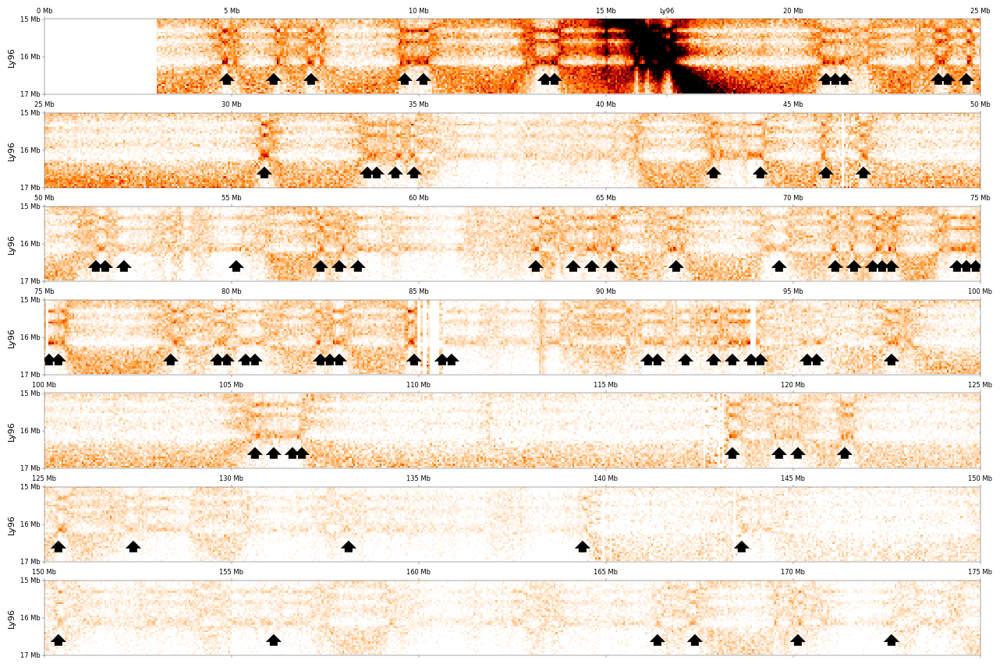

In [336]:
!mkdir -p ./plots/paper/s13
from supp_figures_plotting_functions import make_wrapped_plot

fig = make_wrapped_plot(inter_and_intra_connections, treg_50kb, all_ind_to_region, chrom_to_start, 
                      chrom_to_end, og_ind=66, compare_with = '1', dpi = 50, gene='Ly96')
fig.savefig('./plots/paper/s13/ly96_chr1_wrapped_plot.pdf', bbox_inches='tight')

[50000000.0, 55000000.0, 60000000.0, 65000000.0, 70000000.0, 75000000.0, 69625000.0] ['50 Mb', '55 Mb', '60 Mb', '65 Mb', '70 Mb', '75 Mb', 'Ikzf2']


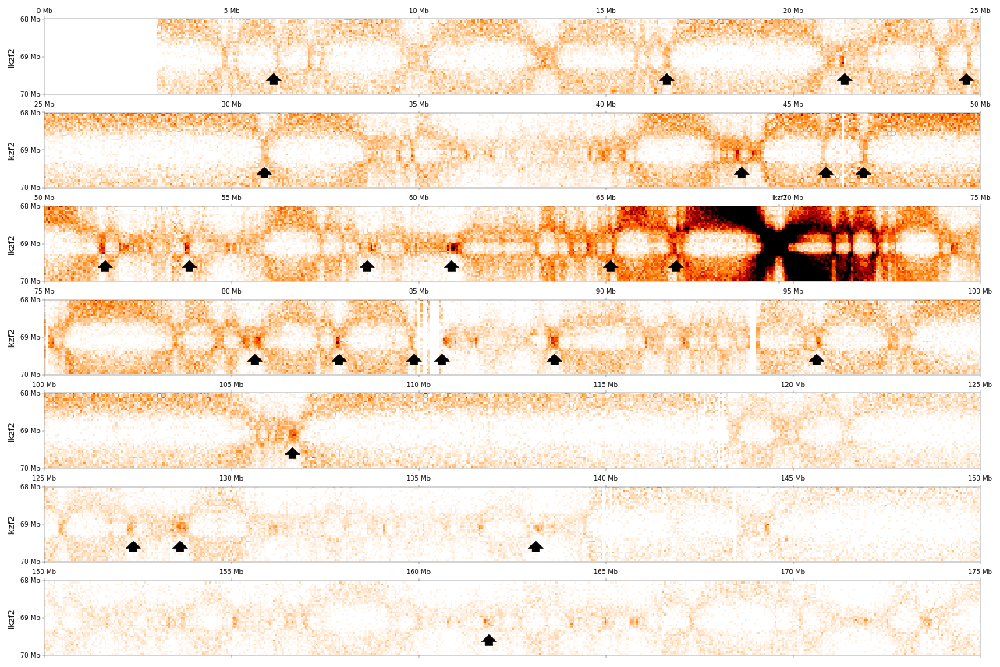

In [337]:
fig = make_wrapped_plot(inter_and_intra_connections, treg_50kb, all_ind_to_region, chrom_to_start, 
                      chrom_to_end, og_ind=278, compare_with = '1', dpi = 50, gene='Ikzf2')
fig.savefig('./plots/paper/s13/ikzf2_chr1_wrapped_plot.pdf', bbox_inches='tight')

### S14

A. Pileup plotted elsewhere

B. Inter metadomain scatterplot

Imported plotting functions


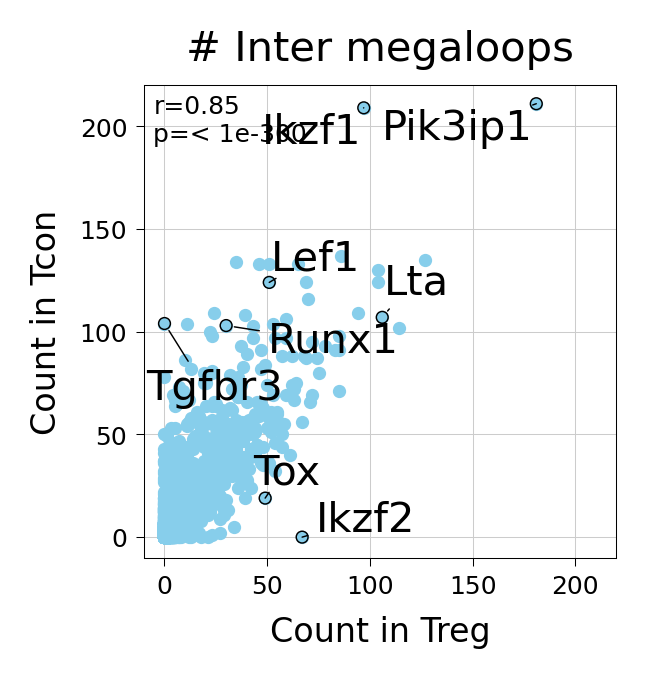

In [370]:
from supp_figures_plotting_functions import treg_tcon_inter_metadomains

fig = treg_tcon_inter_metadomains(all_inter_treg_metadomains, all_inter_tcon_metadomains, ind_to_gene)
fig.savefig('./plots/paper/s14/treg_tcon_inter_metadomains.pdf', bbox_inches = 'tight',
           dpi=1000)

Imported plotting functions


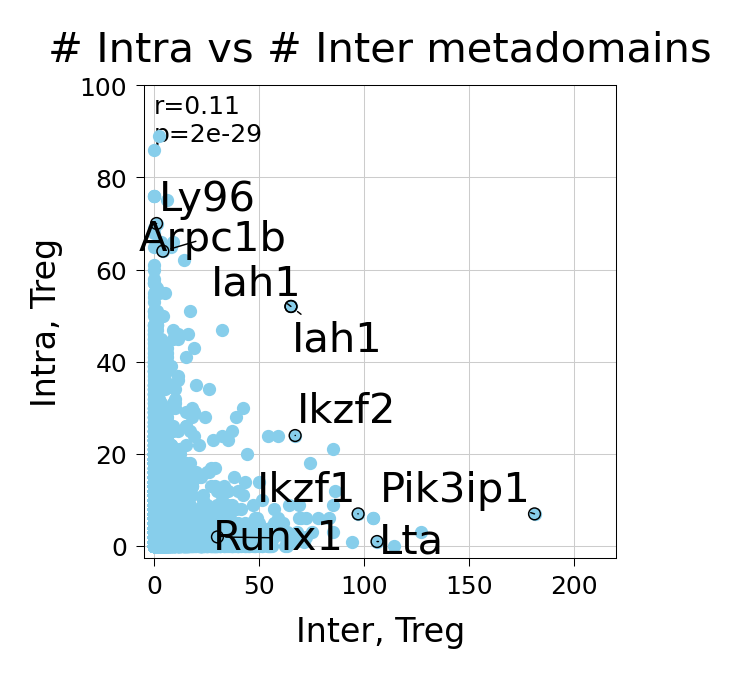

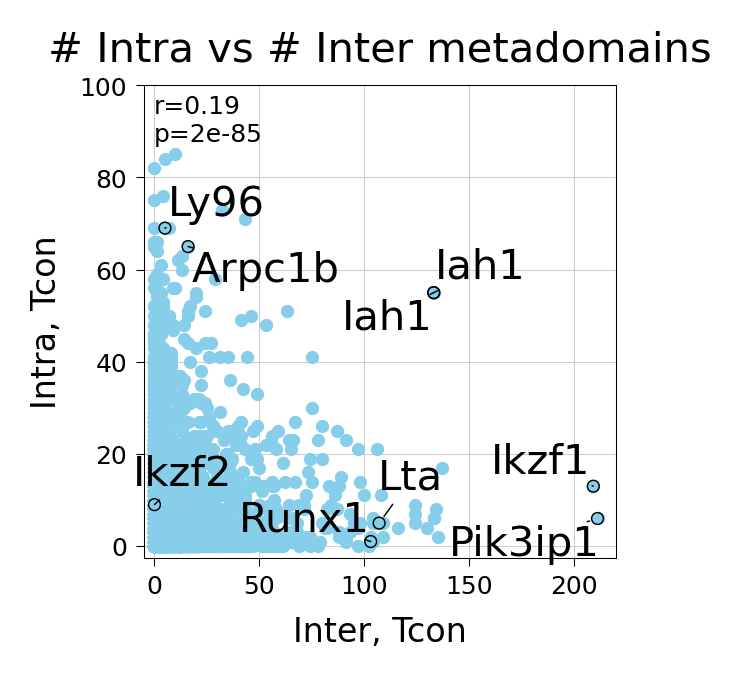

In [328]:
from supp_figures_plotting_functions import inter_intra_metadomains

fig = inter_intra_metadomains(all_inter_treg_metadomains, all_intra_treg_metadomains, ind_to_gene, celltype='Treg')
fig.savefig('./plots/paper/s14/number_treg_intra_inter_metadomains.pdf', bbox_inches = 'tight', dpi=1000)

fig = inter_intra_metadomains(all_inter_tcon_metadomains, all_intra_tcon_metadomains, ind_to_gene, celltype='Tcon')
fig.savefig('./plots/paper/s14/number_tcon_intra_inter_metadomains.pdf', bbox_inches = 'tight', dpi=1000)

Imported plotting functions


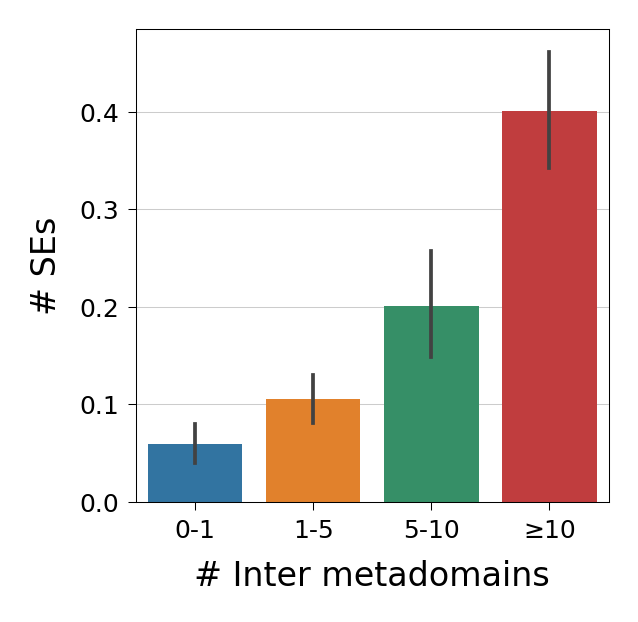

In [636]:
from supp_figures_plotting_functions import inter_metadomains_vs_SE

fig = inter_metadomains_vs_SE(all_inter_treg_metadomains, SE_count)
fig.savefig('./plots/paper/s14/treg_inter_metadomains_vs_SE.pdf', bbox_inches = 'tight',
           dpi=1000)

C. Pileup shown elsewhere

Imported plotting functions


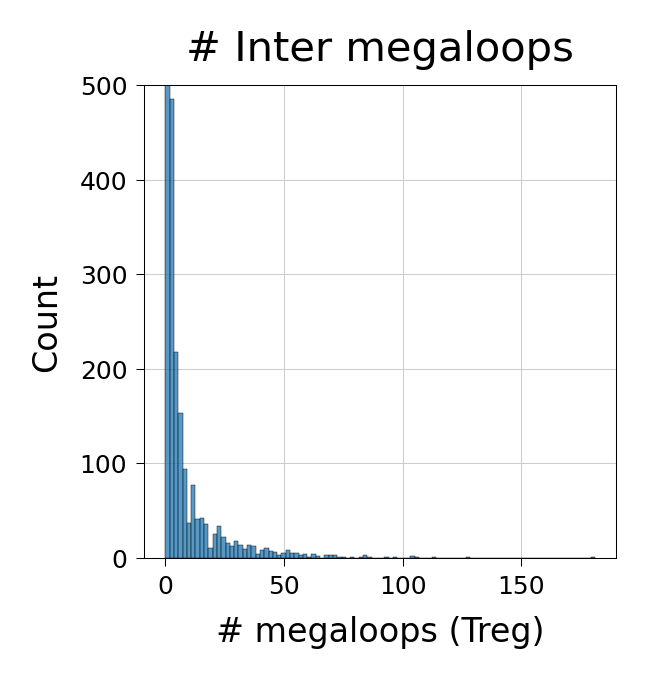

In [369]:
from supp_figures_plotting_functions import inter_metadomain_barplot

fig = inter_metadomain_barplot(all_inter_treg_metadomains)
fig.savefig('./plots/paper/s14/number_interchromosomal_metadomains_hist.pdf', bbox_inches = 'tight', dpi = 1000)

### S15

A. Inter vs. Intra metadomains

In [512]:
!mkdir -p plots/paper/s15

Imported plotting functions


/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:1197: RuntimeWarning: invalid value encountered in divide
  x, y = np.ravel(np.log2(1+bw_val_df_all_250kb[key])), all_intra_treg_megaloops.sum(axis=1)/all_mega


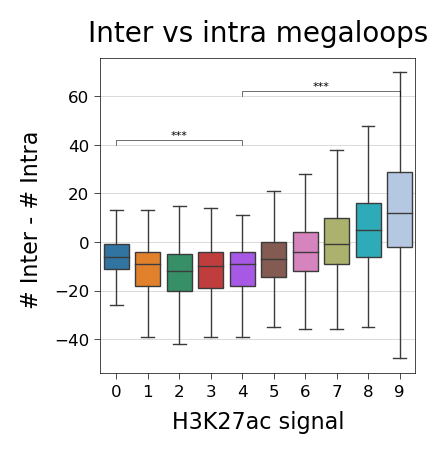

In [379]:
from supp_figures_plotting_functions import inter_vs_intra_h3k27ac_boxplot

fig = inter_vs_intra_h3k27ac_boxplot(all_intra_treg_metadomains, all_inter_treg_metadomains, 
                                   all_intra_metadomains, all_inter_metadomains, bw_val_df_all_250kb)
fig.savefig('./plots/paper/s15/inter_vs_intra_h3k27ac_box.pdf', bbox_inches = 'tight', dpi = 300)

/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:1231: RuntimeWarning: invalid value encountered in divide
  x, y = np.ravel(np.log2(1+bw_val_df_all_250kb[key])), delta


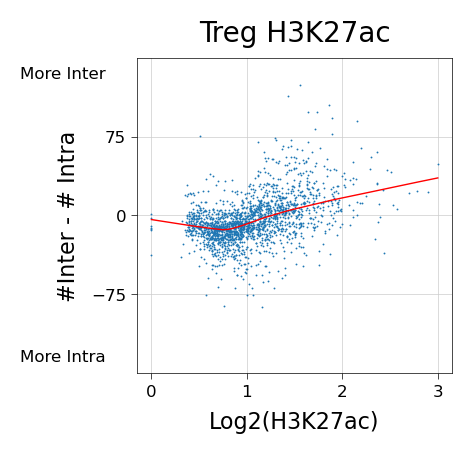

In [380]:
from supp_figures_plotting_functions import inter_vs_intra_h3k27ac_scatterplot

fig = inter_vs_intra_h3k27ac_scatterplot(all_intra_treg_metadomains, all_inter_treg_metadomains, 
                                   all_intra_metadomains, all_inter_metadomains, bw_val_df_all_250kb)
fig.savefig('./plots/paper/s15/inter_vs_intra_h3k27ac_scatter.pdf', bbox_inches = 'tight', dpi = 300)

D.

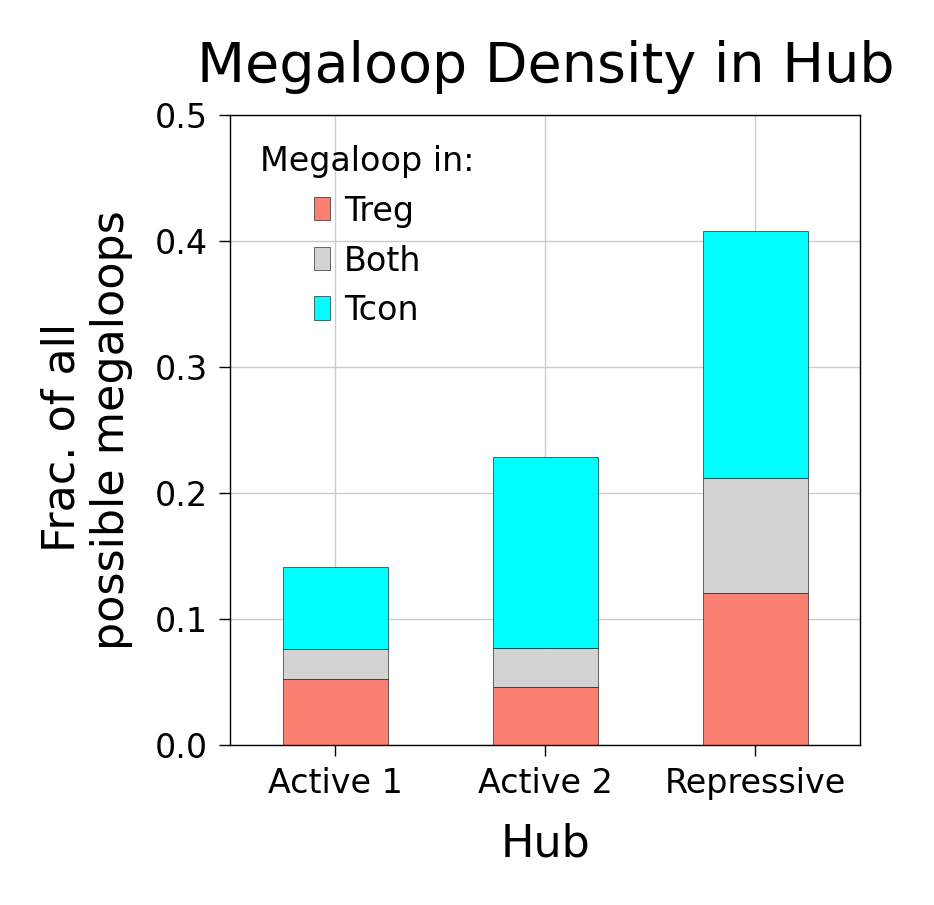

In [544]:
from supp_figures_plotting_functions import metadomain_density_barplot

fig = metadomain_density_barplot(metadomain_hub_freq_df)
fig.savefig(f'./plots/paper/s15/E_metadomain_density.pdf', bbox_inches='tight')

E

Imported plotting functions


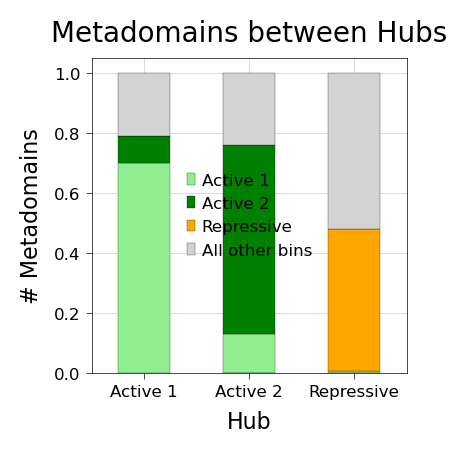

In [588]:
from supp_figures_plotting_functions import metadomain_between_hub_barplot

fig = metadomain_between_hub_barplot(all_inter_metadomains, self, columns_to_names,
                                row_colors, dpi = 100)
fig.savefig(f'./plots/paper/s15/F_metadomain_hubs.pdf', bbox_inches='tight')

F.

Imported plotting functions


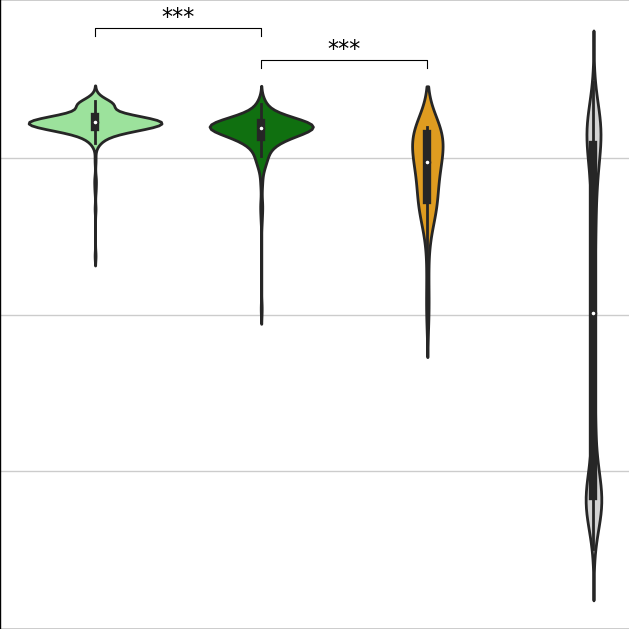

In [2089]:
from supp_figures_plotting_functions import treg_comp_violin_plot

treg_comp_violin_plot(my_treg_comp, self, columns_to_names)

G

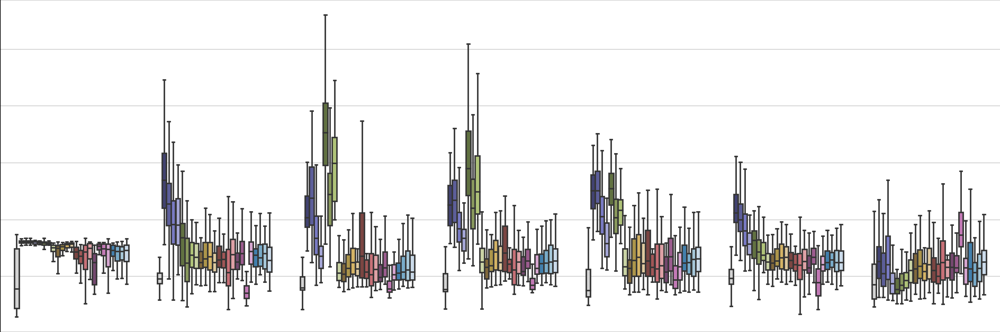

In [319]:
from supp_figures_plotting_functions import plot_inter_metadomain_clustering_chip

fig = plot_inter_metadomain_clustering_chip(bw_val_df_all_250kb, self, my_treg_comp)
fig.savefig('./plots/paper/s15/INTER_CHIP.pdf', bbox_inches='tight')

Housekeeping

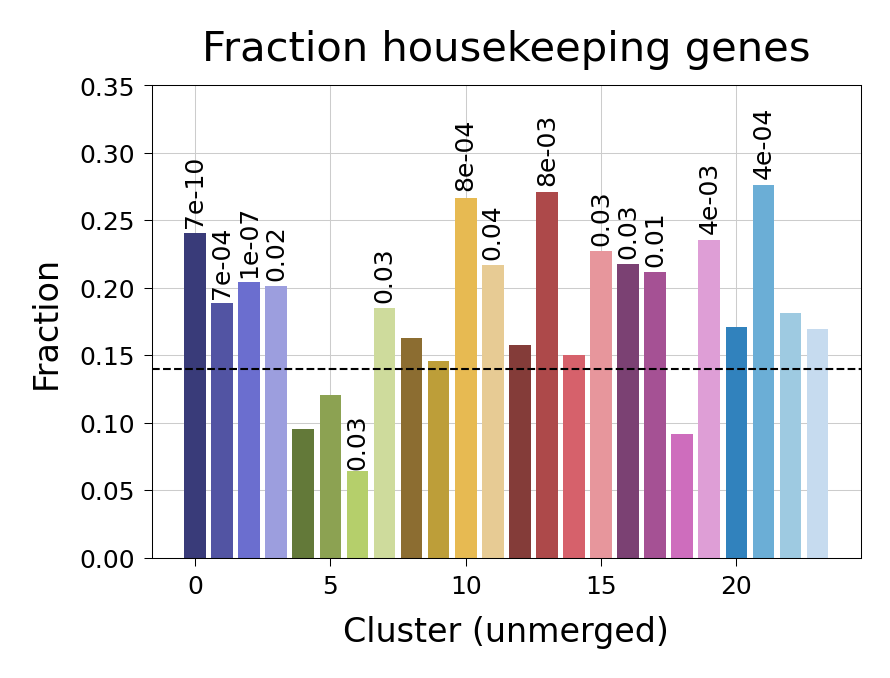

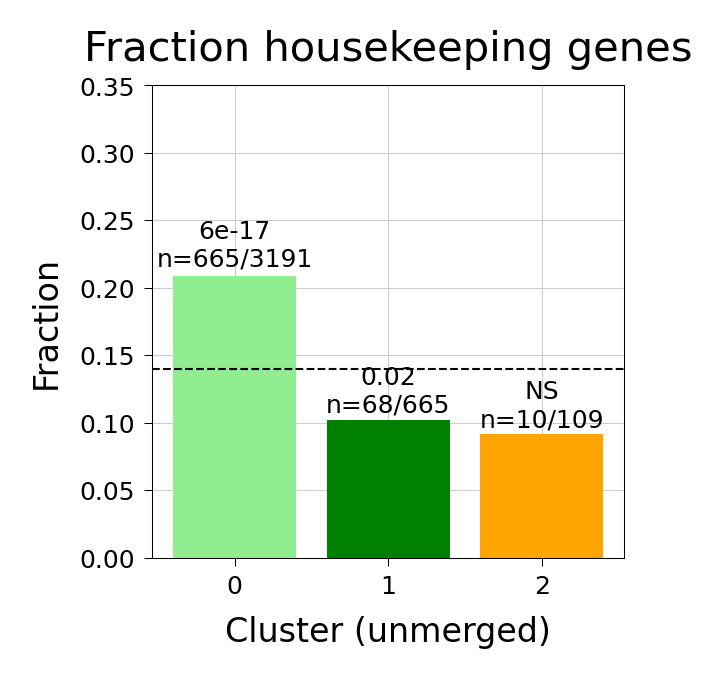

In [751]:
from supp_figures_plotting_functions import housekeeping_barplots

housekeeping_barplots(self, gene_to_ind, ind_to_gene, row_colors)

Imported plotting functions
Active 2 Treg
Active 2 Common


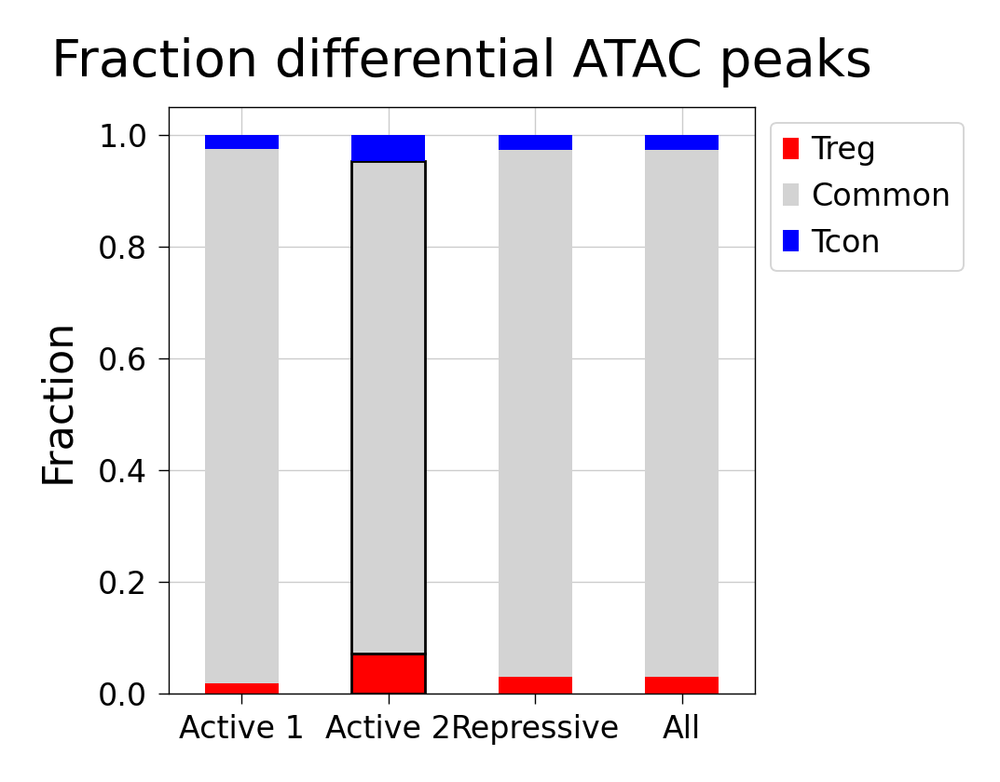

In [759]:
from supp_figures_plotting_functions import make_atac_enrichments_in_hub_with_pvals

data = make_atac_enrichments_in_hub_with_pvals(self, all_ind_to_region, columns_to_names)

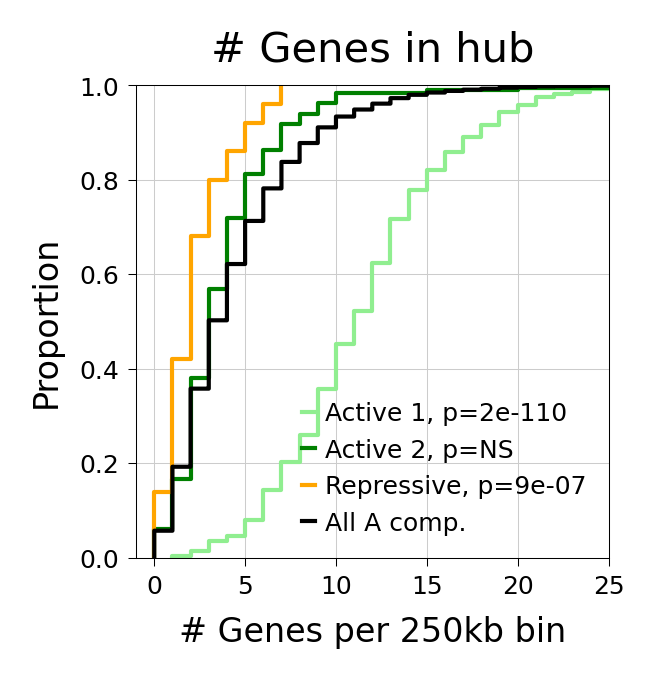

In [775]:
from supp_figures_plotting_functions import n_genes_per_hub

fig = n_genes_per_hub(self, ind_to_gene, columns_to_names, row_colors_dict, my_treg_comp)
fig.savefig('./plots/paper/s15/genes_in_hub.pdf', bbox_inches='tight')

Imported plotting functions


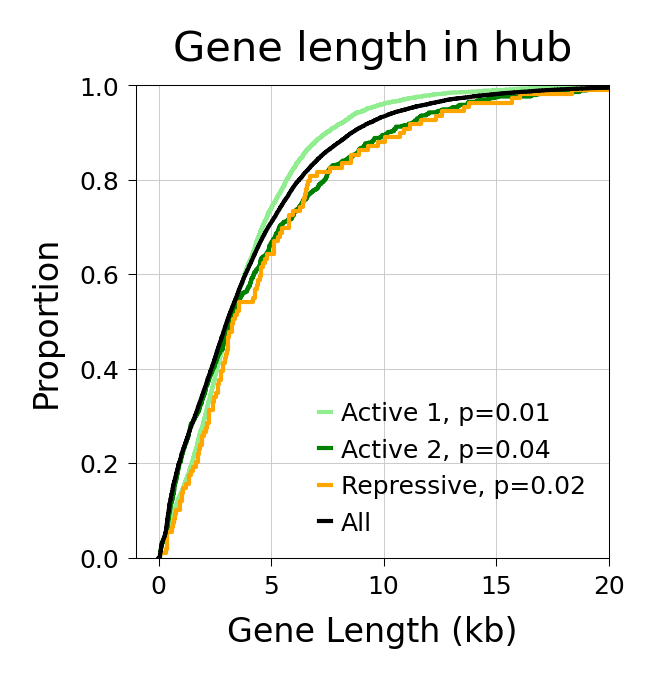

In [774]:
from supp_figures_plotting_functions import gene_length_per_hub

fig = gene_length_per_hub(self, gene_to_ind, ind_to_gene, columns_to_names, row_colors_dict, geneLengths)
fig.savefig('./plots/paper/s15/gene_length_in_hub.pdf', bbox_inches='tight')

In [762]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

Imported plotting functions
9263
7263
267


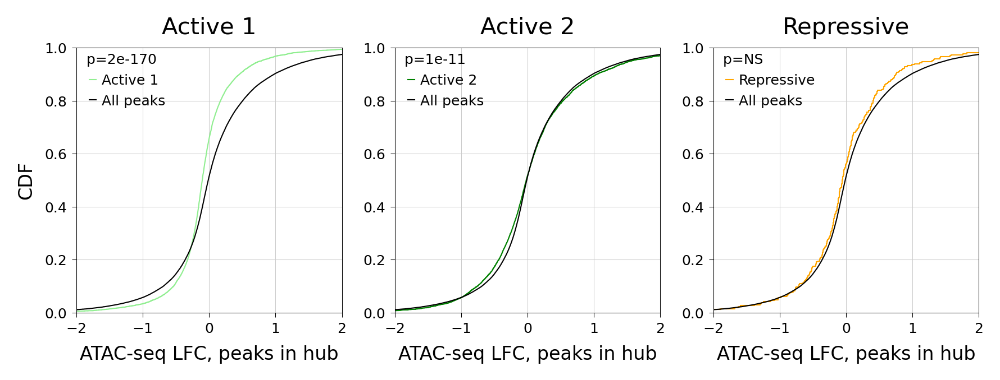

In [329]:
from supp_figures_plotting_functions import make_atac_enrichments_in_hub_quant

make_atac_enrichments_in_hub_quant(atac_peaks,  self, all_ind_to_region, columns_to_names, row_colors_dict)

#### Figure S16

In [ ]:
gene_names = ['Ly96', 'Ctla4', 'Ikzf2', 'Ets1', 'Pdlim7']
for c, i in enumerate([66, 243, 278, 5216, 7299]):
    name = gene_names[c]
    fig = make_wrapped_plot(inter_and_intra_connections, treg_50kb, all_ind_to_region, chrom_to_start, 
                            chrom_to_end, og_ind=i, compare_with = '3', dpi = 50, ylabel=name,
                            intra=False, gene=name)
    fig.savefig(f'./plots/paper/s16/{name}_chr1_wrapped_plot.pdf', bbox_inches='tight')

#### Figure S17-19


All such plots made in another notebook

#### Figure S20

A. 

Imported plotting functions


/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:1487: RuntimeWarning: divide by zero encountered in log2


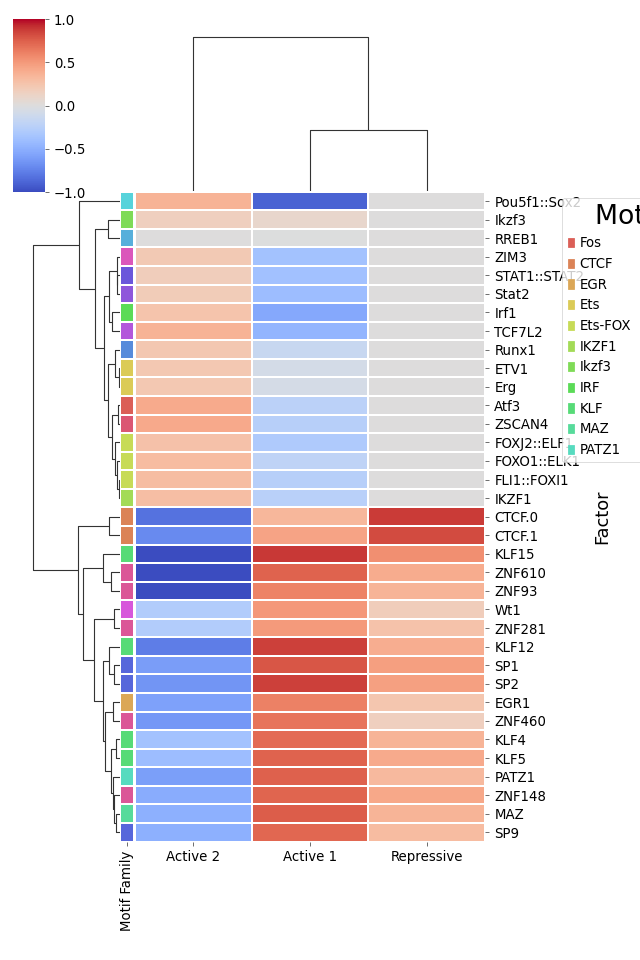

In [1415]:
from supp_figures_plotting_functions import make_motif_enrichment_plot

results = make_motif_enrichment_plot(self, all_ind_to_region, meme_motif_df, motif_metadata, columns_to_names)

/Genomics/pritykinlab/gabe/jupys/tregs/./code/supp_figures_plotting_functions.py:1978: RuntimeWarning: divide by zero encountered in log2
  vals.append([col, p, delta])


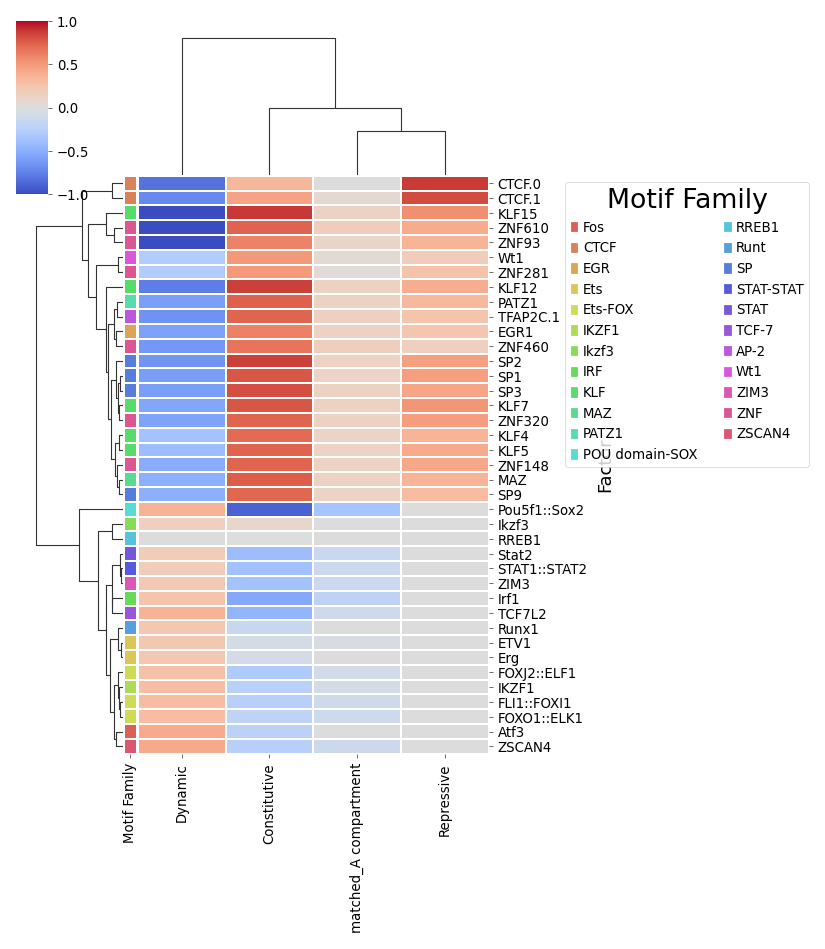

In [507]:
from supp_figures_plotting_functions import make_motif_enrichment_plot

results = make_motif_enrichment_plot(self, _250kb_hub_annotations, all_ind_to_region, meme_motif_df, motif_metadata, columns_to_names)

B-C. 

Shown elsewhere

E. GO

In [199]:
from gprofiler import gprofiler

In [451]:
import textwrap

def wrap_text(text, width=30):
    # Wrap the text to the specified width.
    wrapped_text = textwrap.fill(text, width=width)
    return wrapped_text


from gprofiler import GProfiler
def make_go_enrichment_plot(control_key='Other genes'):
    
    gp = GProfiler(return_dataframe=True)
    
    gene_lists = []
    result_dict = {}
    sources = ["GO:BP", "KEGG", "REAC", "WP"]
    for key in [0, 4, 18]:
        # Your list of genes
        gene_list = list(my_tss_df[my_tss_df['hub']==columns_to_names[key]]['gene_name'])
        control = list(my_tss_df['gene_name'])

        # # Perform the GO analysis
        result = gp.profile(organism='mmusculus',  # Replace with your organism
                             query=gene_list,
                             background = control,
                             sources=sources,
                            no_evidences=False,
                           )  # GO Biological Process, Molecular Function, Cellular Component
        result_dict[key] = result
        gene_lists.append(gene_list)
    
    fig, axs = init_subplots_exact(3, 1, fgsz=(25*mm, 80*mm), dpi = 150, xspace = 2)
    for c, (key, v) in enumerate(result_dict.items()):
        xs = []
        ys = []
        cs = []
        plt.sca(axs[c])
        v['name'] = v['name'].str.capitalize()
        v = v.drop_duplicates(['name']).sort_values('p_value').iloc[:20]
        c = row_colors_dict[columns_to_names[key]]
        for _, row in v.iterrows():
            x = row['name']
            x = x.replace("Tcr", 'TCR')
            x = x.replace(' ', '\n')
            x = wrap_text(x)
            xs.append(x)
            ys.append(-np.log10(row['p_value']))
            cs.append(c)
        plt.yticks(fontsize=4)
        plt.xlim([0, 10])
        plt.scatter(ys, xs, c=cs)
        plt.xlabel("-np.log10(p)")
        plt.title(columns_to_names[key])
        plt.gca().set_axisbelow(True)
    fig.savefig('./plots/paper/s20/all_go_terms.pdf', bbox_inches='tight')

[3.7656765216121, 2.8356411157005885, 2.1511013771476772, 1.797226049005395, 1.474139461381382, 1.3303141213180596]
[6.348820131298132, 6.344824000125675, 6.219551293971505, 5.925647958995387, 5.41436456925211, 5.060373661377833, 4.824278377915908, 4.511300933366355, 4.395184251926288, 4.2655486939445195, 3.988672554227866, 3.905892929715918, 3.8658016675723665, 3.792835264296665, 3.6091549255887125, 3.5753560756056793, 3.4482895848784696, 3.3012114892147446, 3.299467267671646, 3.2083709959105073]
[4.525484474663296, 4.079352264846813, 3.828416181080943, 3.7457740893759284, 2.9167151482362357, 2.212409382311154, 2.0858445539310946, 2.001500147892825, 1.924361981891578, 1.897379527508007, 1.656506535687157, 1.4119917827774422]


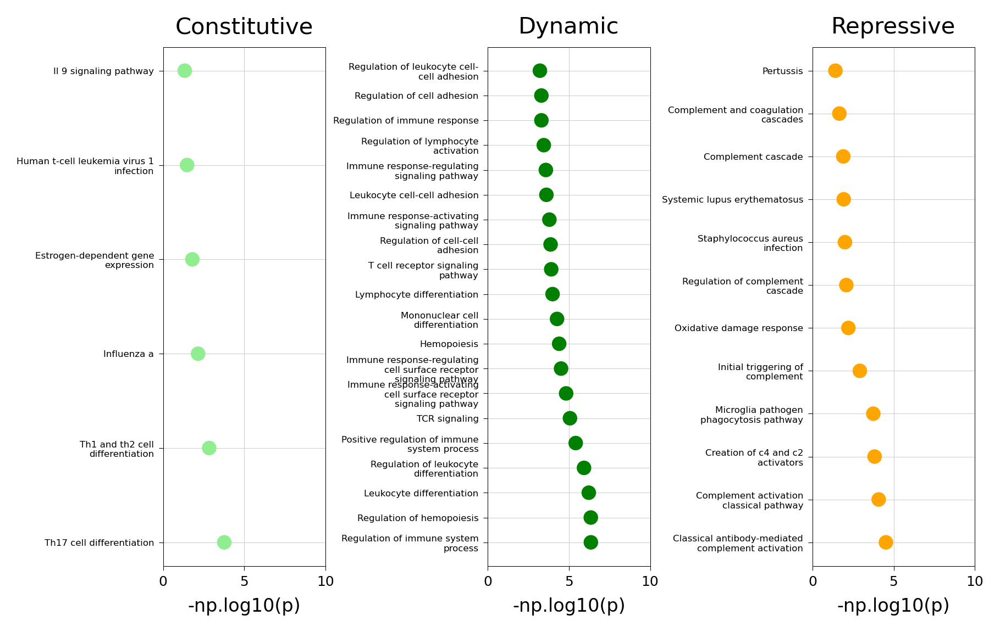

In [450]:
r = make_go_enrichment_plot()

In [209]:
import textwrap

def wrap_text(text, width=30):
    # Wrap the text to the specified width.
    wrapped_text = textwrap.fill(text, width=width)
    return wrapped_text


from gprofiler import GProfiler
def make_go_enrichment_plot():
    
    gp = GProfiler(return_dataframe=True)
    
    gene_lists = []
    result_dict = {}
    sources = ["GO:BP", "KEGG", "REAC", "WP"]
    for key in self.cluster_to_subset_for_further_clustering:
        # Your list of genes
        gene_list = list(itertools.chain(*[ind_to_gene.get(x, []) for x in self.goodinds[self.clustdict['all']==key]]))
        control = list(itertools.chain(*ind_to_gene.values()))
        # # Perform the GO analysis
        result = gp.profile(organism='mmusculus',  # Replace with your organism
                             query=gene_list,
                             background = control,
                             sources=sources,
                            no_evidences=False,
                           )  # GO Biological Process, Molecular Function, Cellular Component
        result_dict[key] = result
        gene_lists.append(gene_list)
    return result_dict
    
    xs = []
    ys = []
    cs = []
    fig, axs = init_subplots_exact(1, 1, fgsz=(40*mm, 30*mm), dpi = 150)
    for key, v in result_dict.items():
        v = v.sort_values('p_value').iloc[:20]
        if len(v) > 5:
            v = v.iloc[::5]
        c = row_colors_dict[columns_to_names[key]]
        for _, row in v.iterrows():
            x = row['name'].capitalize()
            x = x.replace("Tcr", 'TCR')
            x = x.replace(' ', '\n')
            x = wrap_text(x)
            xs.append(x)
            ys.append(-np.log10(row['p_value']))
            cs.append(c)
    plt.yticks(fontsize=4)
    
    plt.scatter(ys, xs, c=cs)
    plt.xlabel("-np.log10(p)")
    plt.title('GO enrichment')
    plt.gca().set_axisbelow(True)
    # fig.savefig('./plots/gene_ontology/enrichment.pdf', bbox_inches='tight')

In [210]:
r = make_go_enrichment_plot()

/tmp/ipykernel_590436/250110533.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v['name'] = v['name'].str.capitalize()


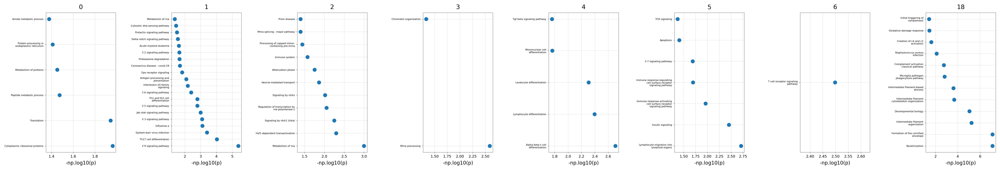

In [198]:
fig, axs = init_subplots_exact(8, 1, fgsz=(40*mm, 80*mm), dpi = 150, xspace=1.8)
for c, (key, v) in enumerate(r.items()):
    xs = []
    ys = []
    cs = []
    plt.sca(axs[c])
    v = v[v['term_size'] < 2000]
    # v = v[v['p_value'] < .01]
    v['name'] = v['name'].str.capitalize()
    v = v.sort_values('p_value').drop_duplicates(['name'])
    # c = row_colors_dict[columns_to_names[key]]
    for _, row in v.iterrows():
        x = row['name']
        x = x.replace("Tcr", 'TCR')
        x = x.replace(' ', '\n')
        x = wrap_text(x)
        xs.append(x)
        ys.append(-np.log10(row['p_value']))
        # cs.append(c)
    plt.yticks(fontsize=4)
    
    plt.scatter(ys, xs)
    plt.xlabel("-np.log10(p)")
    plt.title(key)
    plt.gca().set_axisbelow(True)

F. Active 1 / Active 2 ChIP

In [433]:
import concurrent.futures
import numpy as np
import bbi
import glob

def process_bigwig_file(i, merged_inds_to_subset, goodinds, merged_clustdict, all_ind_to_region):
    bw = bbi.open(i)
    vs = []
    for u in merged_inds_to_subset:
        cluster_bedtools = add_chr_to_bedtool([all_ind_to_region[x] for x in goodinds[merged_clustdict['all'] == u]])
        peak_bedtool = add_chr_to_bedtool(atac_peaks).intersect(cluster_bedtools, u=True)
        v = np.mean(np.log2(1 + get_mean_val_from_bigwig(bw, peak_bedtool)))
        vs.append(v)
    bw.close()
    vs = pd.Series(vs)
    vs.name = i
    vs.index = merged_inds_to_subset
    return vs

def get_bw_signal():
    bws = glob.glob('/Genomics/argo/users/gdolsten/pritlab/snakemake_sras/bws/*.bw')
    
    merged_inds_to_subset = self.merged_inds_to_subset
    goodinds = self.goodinds
    merged_clustdict = self.merged_clustdict

    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = [executor.submit(process_bigwig_file, i, merged_inds_to_subset, goodinds, merged_clustdict, all_ind_to_region) for i in bws]
        results = [future.result() for future in concurrent.futures.as_completed(futures)]
    
    chip_data = pd.concat(results, axis=1).T

    bws = glob.glob('/Genomics/argo/users/gdolsten/pritlab/snakemake_sras/cutrun_bws/*.bw')
    
    merged_inds_to_subset = self.merged_inds_to_subset
    goodinds = self.goodinds
    merged_clustdict = self.merged_clustdict
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = [executor.submit(process_bigwig_file, i, merged_inds_to_subset, goodinds, merged_clustdict, all_ind_to_region) for i in bws]
        results = [future.result() for future in concurrent.futures.as_completed(futures)]
    
    cutrun_data = pd.concat(results, axis=1).T

    bws = glob.glob('/Genomics/argo/users/gdolsten/pritlab/snakemake_sras/atac_bws/*.bw')
    
    merged_inds_to_subset = self.merged_inds_to_subset
    goodinds = self.goodinds
    merged_clustdict = self.merged_clustdict
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = [executor.submit(process_bigwig_file, i, merged_inds_to_subset, goodinds, merged_clustdict, all_ind_to_region) for i in bws]
        results = [future.result() for future in concurrent.futures.as_completed(futures)]
    
    atac_data = pd.concat(results, axis=1).T
    return chip_data, cutrun_data, atac_data

In [434]:
chip_data, cutrun_data, atac_data = get_bw_signal()

In [1288]:
val_df = pd.DataFrame()
cldict = {}
for i in self.cluster_to_subset_for_further_clustering:
    cl0 = pd.Series(list(bedtool_to_grange_set(metaloop_anchors.intersect(add_chr_to_bedtool([all_ind_to_region[x] 
                                                                                              for x in self.goodinds[self.clustdict['all']==i]]),
                          u=True))))
    cl0 = cl0[cl0.isin(adata.obs.index)]
    cldict[i] = cl0
    val_df[i] = adata[cl0].X.mean(axis=0)
val_df.index = adata.var.index
val_df = val_df[~(val_df==0).all(axis=1)]
bad = (metadata_df['Experiment'] =='Input') | (metadata_df['Experiment']=='No') | (~metadata_df['Celltype'].isin(['Treg', 'Tcon']))

val_df = val_df.loc[~bad]
val_df.index = [' '.join(x) for x in metadata_df.loc[~bad].values]

In [1285]:
from processAdata import *


val_df = pd.DataFrame()
cldict = {}
for i in [0, 4, 18]:
    cl0 = pd.Series(list(bedtool_to_grange_set(metaloop_anchors.intersect(add_chr_to_bedtool([all_ind_to_region[x] 
                                                                                              for x in self.goodinds[self.merged_clustdict['all']==i]]),
                          u=True))))
    cl0 = cl0[cl0.isin(adata.obs.index)]
    cldict[i] = cl0
    val_df[i] = adata[cl0].X.mean(axis=0)
val_df.index = adata.var.index
val_df = val_df[~(val_df==0).all(axis=1)]

metadata_df = pd.concat([get_target_from_experiments(val_df.index),
                                       get_celltype_from_experiments(val_df.index)], axis=1)
bad = (metadata_df['Experiment'] =='Input') | (metadata_df['Experiment']=='No') | (~metadata_df['Celltype'].isin(['Treg', 'Tcon']))

val_df = val_df.loc[~bad]
val_df.index = [' '.join(x) for x in metadata_df.loc[~bad].values]
val_df.columns = [columns_to_names[x] for x in val_df.columns]

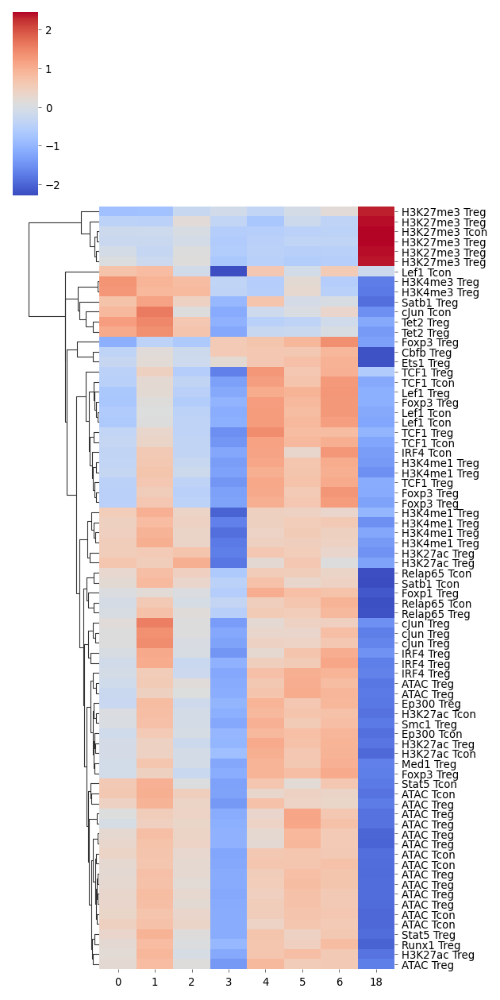

In [1294]:
g = sns.clustermap(val_df.iloc[::2], cmap='coolwarm', z_score=0,
              col_cluster=False,
              yticklabels=True, 
               figsize=(4, 8),
              )
g.fig.savefig('./plots/paper/s31/chip_at_metaloop_anchors.pdf', bbox_inches='tight')

In [1774]:
atac_pref = '/Genomics/argo/users/gdolsten/pritlab/snakemake_sras/atac_bws/'
atac_inputs = []
for c, bw_path in enumerate(glob.glob(atac_pref + "*.bw")):
    name = bw_path.split("/")[-1]
    atac_inputs.append([bw_path, name])
    
    
bw_pref = '/Genomics/argo/users/gdolsten/pritlab/snakemake_sras/bws/'
bw_inputs = []
for c, bw_path in enumerate(glob.glob(bw_pref + "*.bw")):
    name = bw_path.split("/")[-1]
    bw_inputs.append([bw_path, name])
    
    
cutrun_pref = '/Genomics/argo/users/gdolsten/pritlab/snakemake_sras/cutrun_bws/'
cutrun_inputs = []
for c, cutrun_path in enumerate(glob.glob(cutrun_pref + "*.bw")):
    name = cutrun_path.split("/")[-1]
    cutrun_inputs.append([cutrun_path, name])


In [1824]:
rows = []
for input in bw_inputs + cutrun_inputs + atac_inputs:
    try:
        name = input[1].split(".")[2]
        rows.append([input[1], name])
    except:
        continue

names = pd.DataFrame(rows)
names = names[names[1].isin(adata.var.index)].set_index(1)
names = names[names.index.isin(metadata_df.index)]
names['SRR'] = [x.split('.')[1] for x in names[0]]
names['Factor'] = metadata_df['Experiment'].loc[names.index]
names['Celltype'] = metadata_df['Celltype'].loc[names.index]
names = names.drop(0, axis=1)

In [1827]:
from pysradb.sraweb import SRAweb 
db = SRAweb() 

results = db.srr_to_srp(list(names['SRR'][names['SRR'].str.contains("SRR")]))

In [1859]:
names['SRP'] = names['SRR'].apply(dict(zip(results['run_accession'], results['study_accession'])).get)
names.loc[names['SRP'].isnull(), 'SRP'] = 'DRP007087'
names = names[names['Factor'] != 'No']
names.index.name = 'var'
names.to_csv('./plots/paper/tables/table_s4_chip.tsv', sep='\t')

/tmp/ipykernel_590436/2168038800.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  names['SRP'] = names['SRR'].apply(dict(zip(results['run_accession'], results['study_accession'])).get)


#### Figure S21

A.

Imported plotting functions


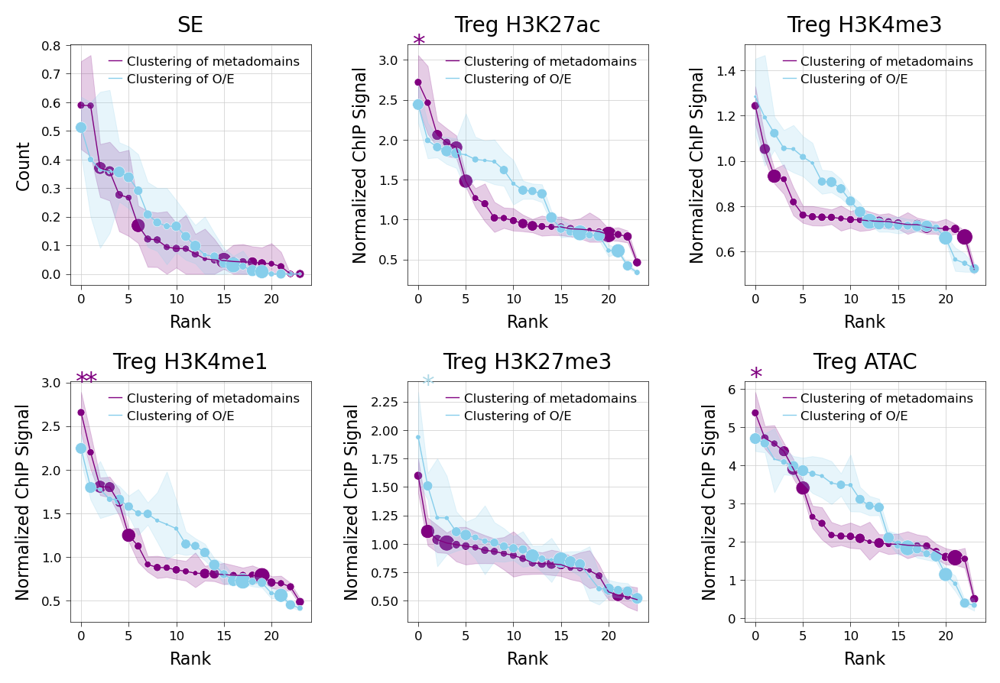

In [349]:
from supp_figures_plotting_functions import metadomain_vs_random_bin_clustering

treal_overlap, trand_overlap = metadomain_vs_random_bin_clustering(self, sep_oe_mat_treg, 
                                         sep_oe_mat_tcon, bw_val_df_all_250kb,
                                         my_treg_comp, {'common_SE': SE_common_count},
                                         all_ind_to_region, method='same'
                                    )

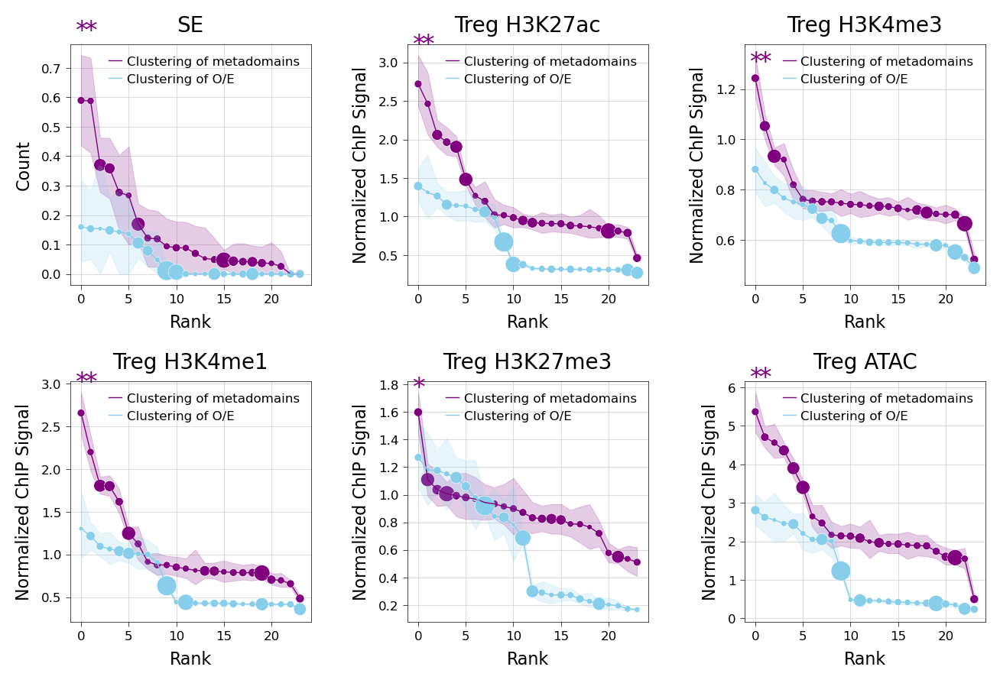

In [348]:
from supp_figures_plotting_functions import metadomain_vs_random_bin_clustering

treal_overlap, trand_overlap = metadomain_vs_random_bin_clustering(self, sep_oe_mat_treg, 
                                         sep_oe_mat_tcon, bw_val_df_all_250kb,
                                         my_treg_comp, {'common_SE': SE_common_count},
                                         all_ind_to_region, method='random'
                                    )

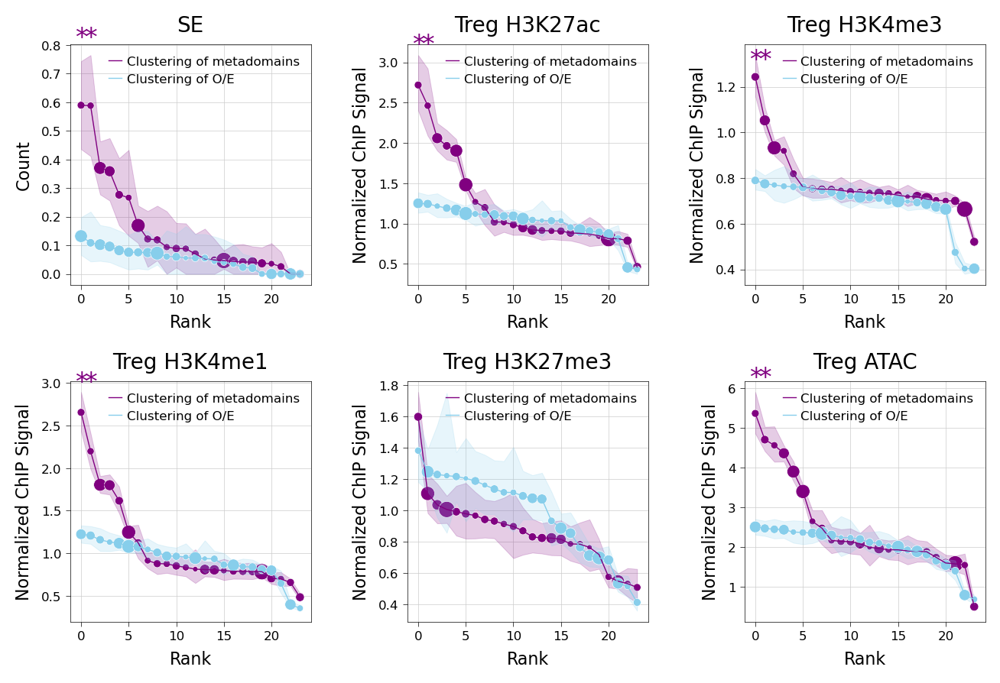

In [347]:
from supp_figures_plotting_functions import metadomain_vs_random_bin_clustering

treal_no_overlap, trand_no_overlap = metadomain_vs_random_bin_clustering(self, sep_oe_mat_treg, 
                                         sep_oe_mat_tcon, bw_val_df_all_250kb,
                                         my_treg_comp, {'common_SE': SE_common_count},
                                         all_ind_to_region, method='acomp_no_overlap'
                                    )

B. 

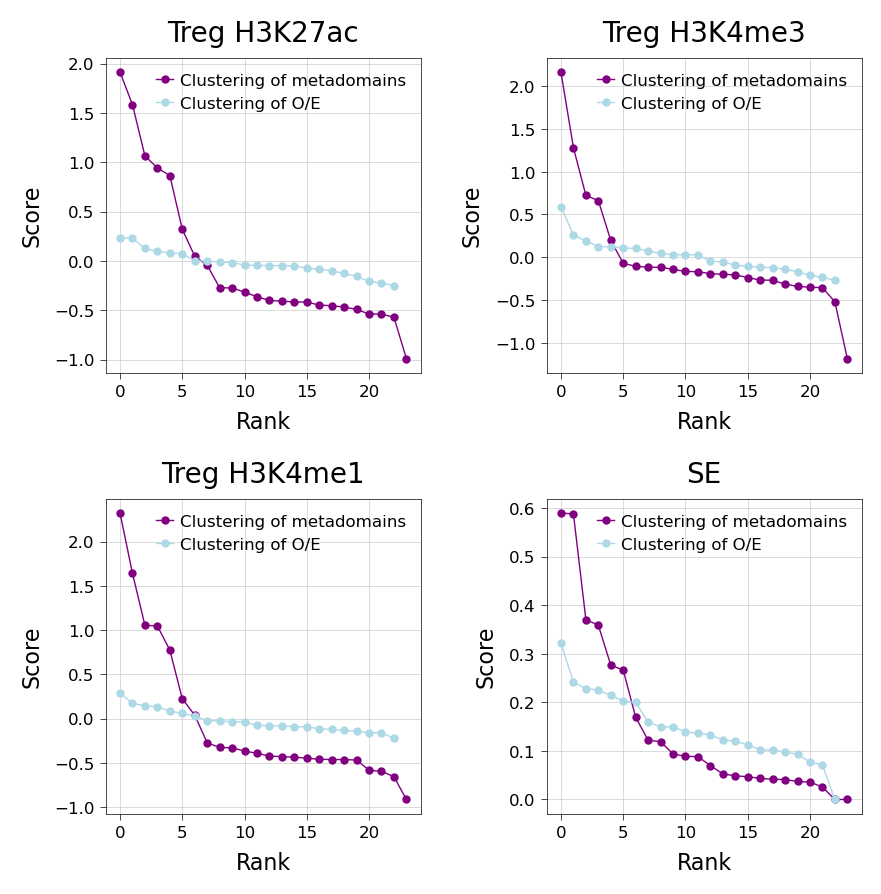

In [413]:
from supp_figures_plotting_functions import metadomain_vs_random_clustering

metadomain_vs_random_clustering(self, sep_oe_mat_treg, bw_val_df_all_250kb)

C.

Imported plotting functions


Text(0.5, 1.0, 'Megaloops')

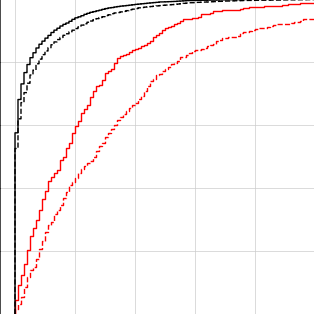

In [353]:
fig, axs = init_subplots_exact(1, 1, fgsz = (40*mm, 40*mm), dpi = 100, xspace=1.4, as_list=True)
plt.sca(axs[0])
sns.ecdfplot(inter_and_intra_connections_treg.sum(axis=1)[(SE_count>0)], color='red', label='SE (Treg metadomains)')
sns.ecdfplot(inter_and_intra_connections_tcon.sum(axis=1)[(SE_count>0)], color='red', label='SE (Tcon metadomains)', linestyle='--')
sns.ecdfplot(inter_and_intra_connections_treg.sum(axis=1)[(SE_count==0)], color='black', label='Other bins (Treg metadomains)')
sns.ecdfplot(inter_and_intra_connections_tcon.sum(axis=1)[(SE_count==0)], color='black', label='Other bins (Tcon metadomains)', linestyle='--')
plt.legend(bbox_to_anchor=(1, 1), handlelength=2, loc='upper left', title='metadomains', title_fontsize=8)
plt.xlim([-5, 100])
plt.xlabel("# metadomains")
plt.ylabel("CDF")
plt.title("metadomains")

#### Figure S22

A.

RanksumsResult(statistic=33.64082729130243, pvalue=4.2463474172948514e-248)
RanksumsResult(statistic=42.88250958643466, pvalue=0.0)
RanksumsResult(statistic=0.4987166836162656, pvalue=0.6179789895781642)


/tmp/ipykernel_1327126/1321383642.py:4: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig('./plots/paper/s22/scrna_correlation_baseline.pdf', bbox_inches='tight', dpi=200)
/Genomics/argo/users/gdolsten/.conda/envs/mamba/envs/new_3dgenome/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Genomics/argo/users/gdolsten/.conda/envs/mamba/envs/new_3dgenome/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


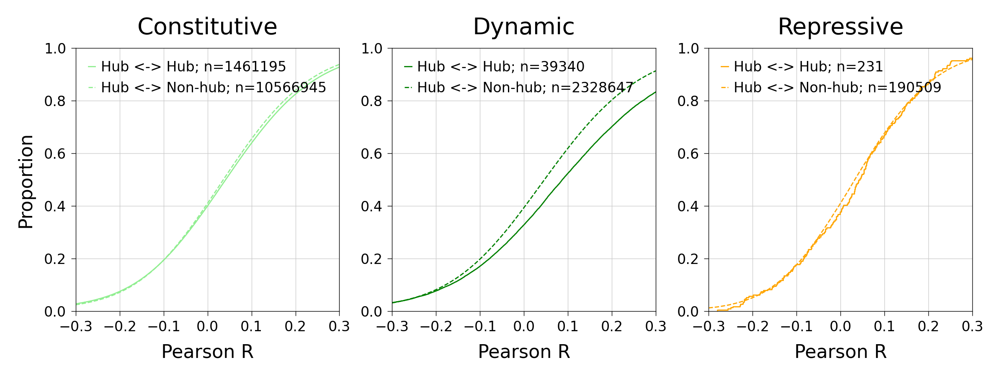

In [685]:
from supp_figures_plotting_functions import baseline_scrna_correlation

fig = baseline_scrna_correlation(gene_dict, ind_to_gene, self, tregs_rna_corr, row_colors_dict, columns_to_names)
fig.savefig('./plots/paper/s22/scrna_correlation_baseline.pdf', bbox_inches='tight', dpi=200)

B.

Imported plotting functions


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


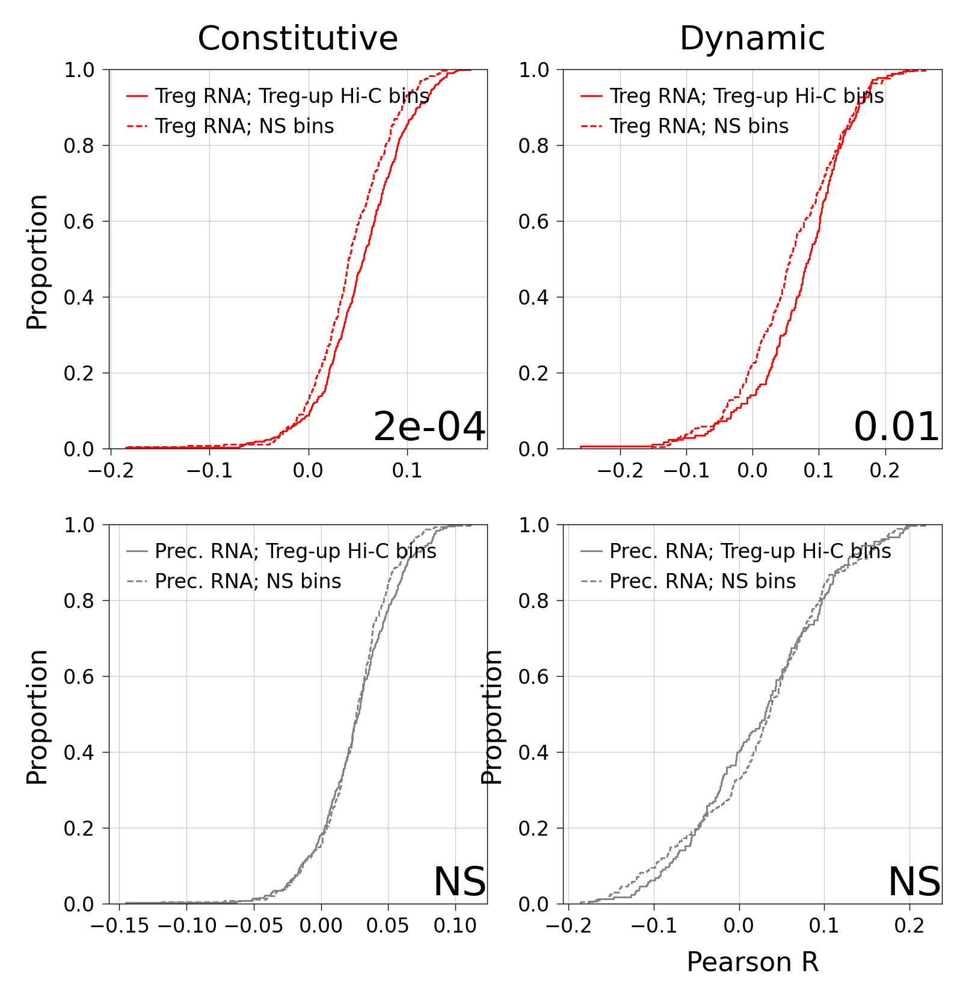

In [688]:
from supp_figures_plotting_functions import differential_scrna_correlation

fig = differential_scrna_correlation(gene_dict, ind_to_gene, self, tregs_rna_corr, treg_precursor_rna_corr, 
                                     hub_pileup_pval_df_250kb, hub_pileup_stat_df_250kb, columns_to_names,
                                    HIC_PCO, HIC_STATCO)
fig.savefig('./plots/paper/s22/scrna_treg_precursor_correlation.pdf', bbox_inches='tight', dpi=200)    

#### Figure S23

Shown elsewhere

#### Figure S24

In [416]:
!mkdir -p plots/paper/s24

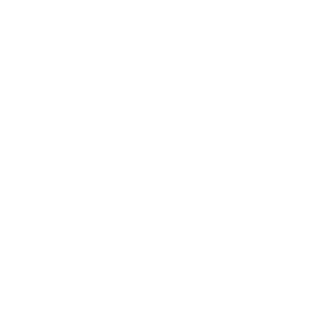

In [417]:
from supp_figures_plotting_functions import superenhancer_metadomain_score_cdf_plot

fig = superenhancer_metadomain_score_cdf_plot(hub_pileup_stat_df_250kb, SE_treg_count, SE_tcon_count, SE_common_count, columns_to_names)
fig.savefig('./plots/paper/s24/superenhancer_metadomain_plot.pdf', bbox_inches='tight')

#### Figure S25

A. Pileups shown elsewhere

B. Quantification of pileups shown elsewhere

#### Figure S26

A. Quantification of pileups shown elsewhere

B. Shown elsewhere

#### Figure S27

Shown in coolbox notebook.

#### Figure S28

A-C. Shown in "Refinement" Notebook

D.

2024-08-29 00:01:29 - INFO - maxp pruned
2024-08-29 00:01:29 - INFO - cmap pruned
2024-08-29 00:01:29 - INFO - kern dropped
2024-08-29 00:01:29 - INFO - post pruned
2024-08-29 00:01:29 - INFO - FFTM dropped
2024-08-29 00:01:29 - INFO - GPOS pruned
2024-08-29 00:01:29 - INFO - GSUB pruned
2024-08-29 00:01:29 - INFO - glyf pruned
2024-08-29 00:01:29 - INFO - Added gid0 to subset
2024-08-29 00:01:29 - INFO - Added first four glyphs to subset
2024-08-29 00:01:29 - INFO - Closing glyph list over 'GSUB': 39 glyphs before
2024-08-29 00:01:29 - INFO - Glyph names: ['.notdef', '.null', 'E', 'F', 'H', 'L', 'S', 'T', 'a', 'c', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'x', 'zero']
2024-08-29 00:01:29 - INFO - Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 32, 40, 41, 43, 47, 54, 55, 68, 70, 72, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 

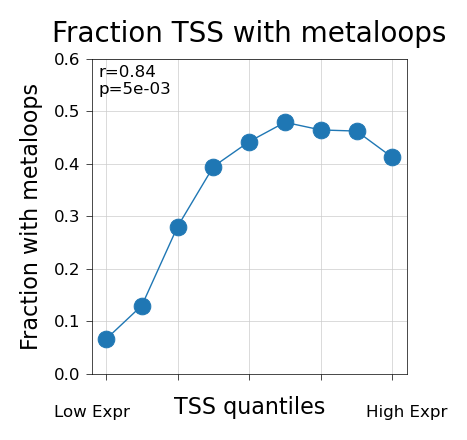

In [54]:
from supp_figures_plotting_functions import fraction_tss_with_metaloops

fraction_tss_with_metaloops(my_tss_df, metaloop_anchors, gene_dict)


E. 

/Genomics/argo/users/gdolsten/.conda/envs/mamba/envs/new_3dgenome/lib/python3.10/site-packages/scipy/stats/_stats_py.py:9205: RuntimeWarning: invalid value encountered in scalar divide
  z = (s - expected) / np.sqrt(n1*n2*(n1+n2+1)/12.0)
2024-08-29 00:01:31 - INFO - maxp pruned
2024-08-29 00:01:31 - INFO - cmap pruned
2024-08-29 00:01:31 - INFO - kern dropped
2024-08-29 00:01:31 - INFO - post pruned
2024-08-29 00:01:31 - INFO - FFTM dropped
2024-08-29 00:01:31 - INFO - GPOS pruned
2024-08-29 00:01:31 - INFO - GSUB pruned
2024-08-29 00:01:31 - INFO - glyf pruned
2024-08-29 00:01:31 - INFO - Added gid0 to subset
2024-08-29 00:01:31 - INFO - Added first four glyphs to subset
2024-08-29 00:01:31 - INFO - Closing glyph list over 'GSUB': 38 glyphs before
2024-08-29 00:01:31 - INFO - Glyph names: ['.notdef', '.null', 'H', 'K', 'L', 'M', 'N', 'S', 'a', 'asterisk', 'c', 'e', 'eight', 'four', 'g', 'greaterequal', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'numbersign', 'o', 'one', 'p', 'p

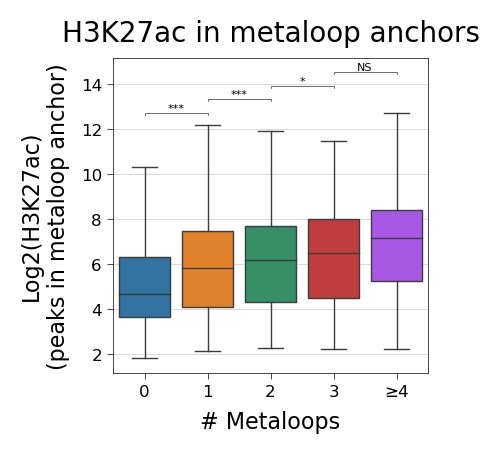

In [55]:
from supp_figures_plotting_functions import metaloop_h3k27ac_boxplot

metaloop_h3k27ac_boxplot(all_h3k27ac, metaloop_anchors)

In [ ]:
rpkm_by_metaloops(metaloop_anchors, my_tss_df, gene_dict)


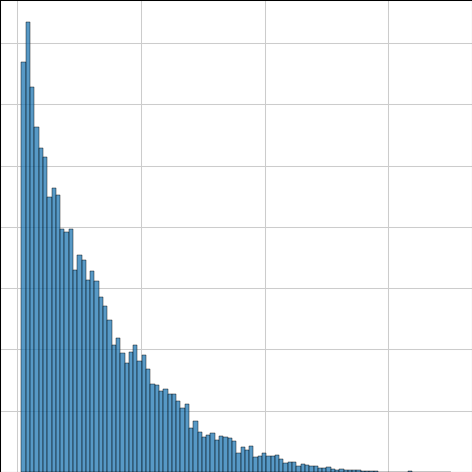

In [2469]:
fig, axs = init_subplots_exact(1, 1, fgsz=(40*mm, 40*mm), dpi = 150)
sns.histplot(
    (metaloops.to_dataframe()['score'] - metaloops.to_dataframe()['thickEnd']).abs()/1e6,
            bins=100, ax=axs)
plt.xlabel("Distance (Mb)")
fig.savefig('./plots/paper/s28/metaloop_distance.pdf', bbox_inches='tight')

#### Figure S29

Shown in "Refinement" Notebook

#### Figure S30

Shown in "Refinement" Notebook

#### Figure S31

A.

In [674]:
from volcano_plot import volcano_plot
def loop_vs_nonloop_motif_enrichment(meme_motif_df, anchors):
    rows = []

    atac_has_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(anchors, c=True), -1).astype(int)
    idx_anchor = atac_has_anchor > 0
    idx_nonanchor = atac_has_anchor == 0
    for col in meme_motif_df:
        x = meme_motif_df.loc[idx_anchor, col] > 0
        y = meme_motif_df.loc[idx_nonanchor, col] > 0
        delta = np.log2(x.mean() / y.mean())
        
        nup = x.sum()
        ndown = y.sum()
        stat, pval = scipy.stats.fisher_exact([[nup, len(x)-nup],
                                               [ndown, len(y)-ndown]
                                              ]
                                           )
        rows.append([col, delta, pval])
    
    df = pd.DataFrame(rows, columns = ['factor', 'delta', 'pval'])
    df.loc[df['pval'] == 0, 'pval'] = 1e-305
    fig, axs = init_subplots_exact(1, 1, fgsz=(40*mm, 40*mm), dpi = 150)
    
    volcano_plot(df['delta'], df['pval'], df['factor'], plt.gca(), label_pval_cutoff=80,
                max_y = 300, ylim=[0, 305], 
                lfc_co=0, genes_to_label=['Stat5a', 'FOXP1'],
                 fontsize = 6, pes=None,
                )
    plt.xlabel("LFC")
    add_xaxis_labels("Not in loop", 'In loop', plt.gca(), fontsize=6)
    plt.gcf().savefig('./plots/paper/s31/atac_in_loop_nonloop.pdf', bbox_inches='tight', dpi = 3000)
    return df

A. 

/Genomics/pritykinlab/gabe/jupys/tregs/./code/volcano_plot.py:23: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


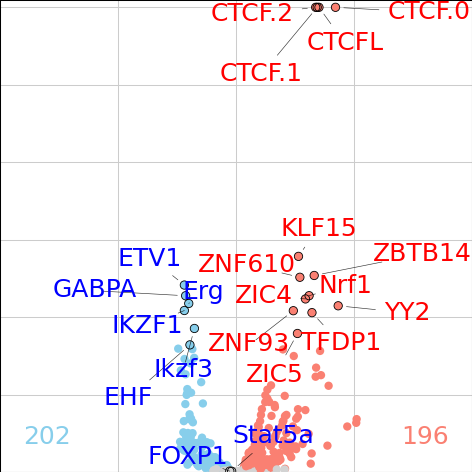

In [625]:
df = loop_vs_nonloop_motif_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['All']))

In [676]:
def metaloop_vs_shortrange_loop_motif_enrichment(meme_motif_df):
    rows = []

    ancs_with_metadomain = add_chr_to_bedtool(anchordict['All']).intersect(metaloop_anchors, u=True)
    ancs_without_metadomain = add_chr_to_bedtool(anchordict['All']).subtract(metaloop_anchors, A=True)
    
    atac_peaks_with_metadomain = get_col(index_to_bedtool(meme_motif_df.index).intersect(ancs_with_metadomain, c=True), -1).astype(int)
    atac_peaks_without_metadomain = get_col(index_to_bedtool(meme_motif_df.index).intersect(ancs_without_metadomain, c=True), -1).astype(int)
    
    for col in meme_motif_df:
        x = meme_motif_df[col][atac_peaks_with_metadomain > 0] > 0
        y = meme_motif_df[col][atac_peaks_without_metadomain > 0] > 0
        delta = np.log2(x.mean() / y.mean())
        
        nup = x.sum()
        ndown = y.sum()
        stat, pval = scipy.stats.fisher_exact([[nup, len(x) - nup],
                                               [ndown, len(y) - ndown]
                                              ]
                                           )
        rows.append([col, delta, pval])
    
    df = pd.DataFrame(rows, columns = ['factor', 'delta', 'pval'])

    fig, axs = init_subplots_exact(1, 1, fgsz=(40*mm, 40*mm), dpi = 150)
    volcano_plot(df['delta'], df['pval'], df['factor'], plt.gca(), label_pval_cutoff=150,
                max_y = 255, ylim=[0, 265], 
                lfc_co=0, fontsize=6, pes=None,)
    plt.xlabel("LFC")
    add_xaxis_labels("Short-range loop anchors", 'Long-range loop anchors', plt.gca(), fontsize=6)
    plt.gcf().savefig('./plots/paper/s31/atac_in_metaloop_nonmetaloop.pdf', bbox_inches='tight', dpi = 3000)
    plt.title("Motifs at metaloop anchors")
    return df

B. 

/Genomics/pritykinlab/gabe/jupys/tregs/./code/volcano_plot.py:23: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


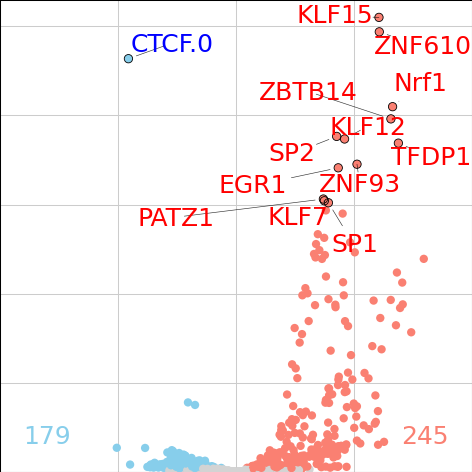

In [677]:
df = metaloop_vs_shortrange_loop_motif_enrichment(meme_motif_df)

In [783]:
def treg_vs_tcon_loop_motif_enrichment(meme_motif_df, anchordict):
    def get_enrichment(meme_motif_df, anchors_treg, anchors_tcon):
        rows = []
    
        atac_has_treg_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(anchors_treg, c=True), -1).astype(int)
        atac_has_tcon_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(anchors_tcon, c=True), -1).astype(int)
    
        idx_treg_anchor = atac_has_treg_anchor > 0
        idx_tcon_anchor = atac_has_tcon_anchor > 0
        shared = idx_treg_anchor & idx_tcon_anchor
        idx_treg_anchor[shared] = 0
        idx_tcon_anchor[shared] = 0
        for col in meme_motif_df:
            x = meme_motif_df.loc[idx_treg_anchor, col] > 0
            y = meme_motif_df.loc[idx_tcon_anchor, col] > 0
            delta = np.log2(x.mean() / y.mean())
            
            nup = x.sum()
            ndown = y.sum()
            stat, pval = scipy.stats.fisher_exact([[nup, len(x)-nup],
                                                   [ndown, len(y)-ndown]
                                                  ]
                                               )
            # stat, pval = scipy.stats.ranksums(meme_motif_df.loc[idx_treg_anchor, col], meme_motif_df.loc[idx_tcon_anchor, col])
    
            rows.append([col, delta, pval])
        df = pd.DataFrame(rows, columns = ['factor', 'delta', 'pval'])
        df.loc[df['pval'] == 0, 'pval'] = 1e-305
        return df

    
    results_treg_ns = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['Treg'].subtract(anchordict['NS'], A=True)), 
                                                 add_chr_to_bedtool(anchordict['NS']),
                                                )
    
    results_tcon_ns = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['NS']),
                                                 add_chr_to_bedtool(anchordict['Tcon'].subtract(anchordict['NS'], A=True)), 
                                                )
    
    results_treg_tcon = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['Treg'].subtract(anchordict['NS'], A=True)), 
                                                 add_chr_to_bedtool(anchordict['Tcon'].subtract(anchordict['NS'], A=True)),
                                                )
    
    idx1 = results_treg_ns[(results_treg_ns['delta'] > 0) & (results_treg_ns['pval'] < 0.001)]['factor']
    idx2 = results_tcon_ns[(results_tcon_ns['delta'] < 0) & (results_tcon_ns['pval'] < 0.001)]['factor']
    idx3 = results_treg_tcon[(results_treg_tcon['pval'] < 0.05)]['factor']
    
    idx = list(set(list(idx1) + list(idx2) + list(idx3)))
    
    d = pd.concat([results_treg_ns.set_index('factor').loc[idx]['delta'], 
                   results_tcon_ns.set_index('factor').loc[idx]['delta'],
                   results_treg_tcon.set_index('factor').loc[idx]['delta'],
                  ], axis=1)
    d.columns = ['treg/ns', 'ns/tcon', 'treg/tcon']
    g = sns.clustermap(d, cmap='coolwarm', vmin=-1, vmax=1)
    g.fig.savefig('./plots/paper/s31/atac_in_treg_anc_vs_tcon_anc.svg', bbox_inches='tight', dpi = 3000)
    return df

In [1297]:
def treg_vs_tcon_loop_motif_enrichment(meme_motif_df, anchordict):
    def get_enrichment(meme_motif_df, anchors_treg, anchors_tcon):
        rows = []
    
        atac_has_treg_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(anchors_treg, c=True), -1).astype(int)
        atac_has_tcon_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(anchors_tcon, c=True), -1).astype(int)
    
        idx_treg_anchor = atac_has_treg_anchor > 0
        idx_tcon_anchor = atac_has_tcon_anchor > 0
        shared = idx_treg_anchor & idx_tcon_anchor
        idx_treg_anchor[shared] = 0
        idx_tcon_anchor[shared] = 0
        for col in meme_motif_df:
            x = meme_motif_df.loc[idx_treg_anchor, col] > 0
            y = meme_motif_df.loc[idx_tcon_anchor, col] > 0
            delta = np.log2(x.mean() / y.mean())
            
            nup = x.sum()
            ndown = y.sum()
            stat, pval = scipy.stats.fisher_exact([[nup, len(x)-nup],
                                                   [ndown, len(y)-ndown]
                                                  ]
                                               )
            # stat, pval = scipy.stats.ranksums(meme_motif_df.loc[idx_treg_anchor, col], meme_motif_df.loc[idx_tcon_anchor, col])
    
            rows.append([col, delta, pval])
        df = pd.DataFrame(rows, columns = ['factor', 'delta', 'pval'])
        df.loc[df['pval'] == 0, 'pval'] = 1e-305
        return df

    results_treg_ns = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['Treg'].subtract(anchordict['NS'], A=True)), 
                                                 add_chr_to_bedtool(anchordict['NS']),
                                                )
    
    results_tcon_ns = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['NS']),
                                                 add_chr_to_bedtool(anchordict['Tcon'].subtract(anchordict['NS'], A=True)), 
                                                )
    
    results_treg_tcon = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['Treg'].subtract(anchordict['NS'], A=True)), 
                                                 add_chr_to_bedtool(anchordict['Tcon'].subtract(anchordict['NS'], A=True)),
                                                )
    
    idx1 = results_treg_ns[(results_treg_ns['delta'] > 0) & (results_treg_ns['pval'] < 0.001)]['factor']
    idx2 = results_tcon_ns[(results_tcon_ns['delta'] < 0) & (results_tcon_ns['pval'] < 0.001)]['factor']
    idx3 = results_treg_tcon[(results_treg_tcon['pval'] < 0.05)]['factor']
    
    idx = list(set(list(idx1) + list(idx2) + list(idx3)))

    atac_has_treg_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(add_chr_to_bedtool(anchordict['Treg']), c=True), -1).astype(int)
    atac_has_tcon_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(add_chr_to_bedtool(anchordict['Tcon']), c=True), -1).astype(int)
    atac_has_ns_anchor   = get_col(index_to_bedtool(meme_motif_df.index).intersect(add_chr_to_bedtool(anchordict['NS']), c=True), -1).astype(int)

    data = pd.concat([meme_motif_df.loc[atac_has_treg_anchor>0].mean(axis=0),
               meme_motif_df.loc[atac_has_tcon_anchor>0].mean(axis=0),
               meme_motif_df.loc[atac_has_ns_anchor>0].mean(axis=0),],
             axis=1)
    
    data.columns = ['Treg', 'Tcon', 'NS']    
    
    g = sns.clustermap(data.loc[idx], z_score = 0, cmap='coolwarm', figsize=(4, 4))
    g.fig.savefig('./plots/paper/s31/atac_in_treg_anc_vs_tcon_anc.svg', bbox_inches='tight', dpi = 3000)
    return data.loc[idx]

In [1334]:
def get_enrichment(meme_motif_df, anchors_treg, anchors_tcon):
    rows = []

    atac_has_treg_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(anchors_treg, c=True), -1).astype(int)
    atac_has_tcon_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(anchors_tcon, c=True), -1).astype(int)

    idx_treg_anchor = atac_has_treg_anchor > 0
    idx_tcon_anchor = atac_has_tcon_anchor > 0
    shared = idx_treg_anchor & idx_tcon_anchor
    idx_treg_anchor[shared] = 0
    idx_tcon_anchor[shared] = 0
    for col in meme_motif_df:
        x = meme_motif_df.loc[idx_treg_anchor, col] > 0
        y = meme_motif_df.loc[idx_tcon_anchor, col] > 0
        delta = np.log2(x.mean() / y.mean())
        
        nup = x.sum()
        ndown = y.sum()
        stat, pval = scipy.stats.fisher_exact([[nup, len(x)-nup],
                                               [ndown, len(y)-ndown]
                                              ]
                                           )
        # stat, pval = scipy.stats.ranksums(meme_motif_df.loc[idx_treg_anchor, col], meme_motif_df.loc[idx_tcon_anchor, col])

        rows.append([col, delta, pval])
    df = pd.DataFrame(rows, columns = ['factor', 'delta', 'pval'])
    df.loc[df['pval'] == 0, 'pval'] = 1e-305
    
    results_treg_ns = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['Treg'].subtract(anchordict['NS'], A=True)), 
                                                 add_chr_to_bedtool(anchordict['NS']),
                                                )
    
    results_tcon_ns = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['NS']),
                                                 add_chr_to_bedtool(anchordict['Tcon'].subtract(anchordict['NS'], A=True)), 
                                                )
    
    results_treg_tcon = get_enrichment(meme_motif_df, add_chr_to_bedtool(anchordict['Treg'].subtract(anchordict['NS'], A=True)), 
                                                 add_chr_to_bedtool(anchordict['Tcon'].subtract(anchordict['NS'], A=True)),
                                                )
    
    idx1 = results_treg_ns[(results_treg_ns['delta'] > 0) & (results_treg_ns['pval'] < 0.005)]['factor']
    idx2 = results_tcon_ns[(results_tcon_ns['delta'] < 0) & (results_tcon_ns['pval'] < 0.005)]['factor']
    idx3 = results_treg_tcon[(results_treg_tcon['pval'] < 0.05)]['factor']
    
    idx = list(set(list(idx1) + list(idx2) + list(idx3)))
    
    atac_has_treg_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(add_chr_to_bedtool(anchordict['Treg']), c=True), -1).astype(int)
    atac_has_tcon_anchor = get_col(index_to_bedtool(meme_motif_df.index).intersect(add_chr_to_bedtool(anchordict['Tcon']), c=True), -1).astype(int)
    atac_has_ns_anchor   = get_col(index_to_bedtool(meme_motif_df.index).intersect(add_chr_to_bedtool(anchordict['NS']), c=True), -1).astype(int)
    
    data = pd.concat([meme_motif_df.loc[atac_has_treg_anchor>0].mean(axis=0),
               meme_motif_df.loc[atac_has_tcon_anchor>0].mean(axis=0),
               meme_motif_df.loc[atac_has_ns_anchor>0].mean(axis=0),],
             axis=1)
    
    data.columns = ['Treg', 'Tcon', 'NS']    
    g = sns.clustermap(data.loc[idx].apply(zscore, axis=1).iloc[::2], cmap='coolwarm', figsize=(4, 4),
                      yticklabels=True)
    g.fig.savefig('./plots/paper/s31/atac_in_treg_anc_vs_tcon_anc.svg', bbox_inches='tight', dpi = 3000)
    return df 

In [ ]:
data = treg_vs_tcon_loop_motif_enrichment(meme_motif_df, anchordict)

C. 

In [775]:
from load_DESeq2_data import unmod_index


D. 

In [777]:
motif_data = make_h3k27ac_motif_enrichment_plot(h3k27ac_motif_df)

In [817]:
def make_h3k27ac_motif_enrichment_plot(meme_motifs):
    all_h3k27ac = add_chr_to_bedtool(pbt.BedTool('peaks/differential/all_threshold_27ac.csv')).to_dataframe()
    all_h3k27ac.index = bedtool_to_index(add_chr_to_bedtool(pbt.BedTool('peaks/differential/all_threshold_27ac.csv')))
    all_h3k27ac['score'] = -all_h3k27ac['score']
    all_h3k27ac = all_h3k27ac[(all_h3k27ac['name'] < 400) | (all_h3k27ac['name'] > 10)]
    
    meme_motifs = meme_motifs.loc[all_h3k27ac.index]
    rows = []
    for motif in meme_motifs:
        motif_positions = (meme_motifs[motif] > 0).values
        with_motif = all_h3k27ac['score'][motif_positions]
        without_motif = all_h3k27ac['score'][~motif_positions]
        stat, p = scipy.stats.ranksums(with_motif, without_motif)
        delta = with_motif.mean() - without_motif.mean()
        rows.append([motif, p, delta])
    motif_data = pd.DataFrame(rows, columns = ['factor', 'p', 'delta']).dropna()
    idx = motif_data['factor'].str.contains("FOS") | motif_data['factor'].str.contains("JUN")
    idx = (idx*(np.random.rand(len(idx)) < .1)) | (~idx)
    fig, axs = init_subplots_exact(1, 1, fgsz=(40*mm, 40*mm), dpi = 200)
    volcano_plot(motif_data['delta'][idx], motif_data['p'][idx],
                 motif_data['factor'][idx], axs,
                 max_y=70, 
                 label_pval_cutoff=30,
                 ylim=[0, 75],
                 xlim=[-.75, .75],
                 lfc_co = 0,
                 fontsize = 6,
                 pes=None,
                )
    plt.xlabel("LFC")
    add_xaxis_labels("Tcon", "Treg", axs, fontsize=6)
    fig.savefig('./plots/paper/s31/treg_tcon_motifs_h3k27ac.pdf', bbox_inches = 'tight',
               dpi = 3000)

E. Looping ChIP enrichment

F. 

In [848]:
loop_adata = sc.read_h5ad('./final_chipseq_adata/FINAL_loop_adata')

oe_df = pd.read_csv('./data_for_enhancer_umap/oe_df.csv', sep='\t', index_col=0)
with open('./full_pileup_dict', 'rb') as f:
    full_pileup_dict = pickle.load(f)

/tmp/ipykernel_717572/2752150347.py:42: UserWarning: The figure layout has changed to tight
/tmp/ipykernel_717572/2752150347.py:28: RuntimeWarning: Mean of empty slice


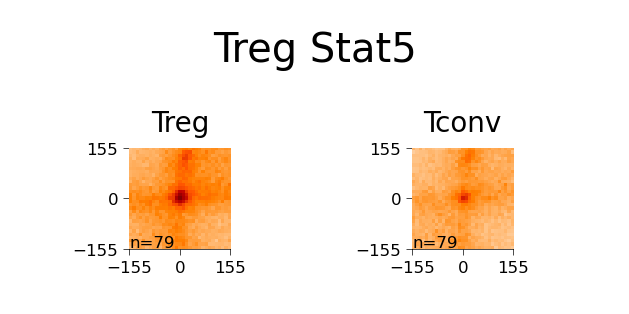

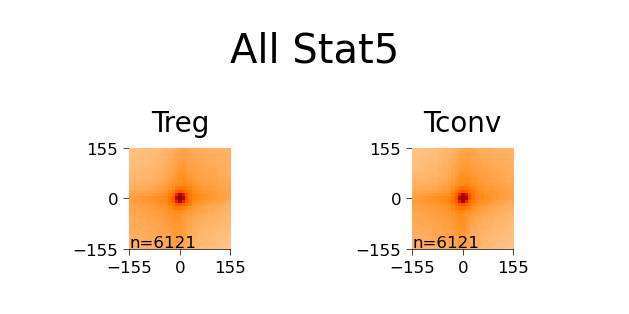

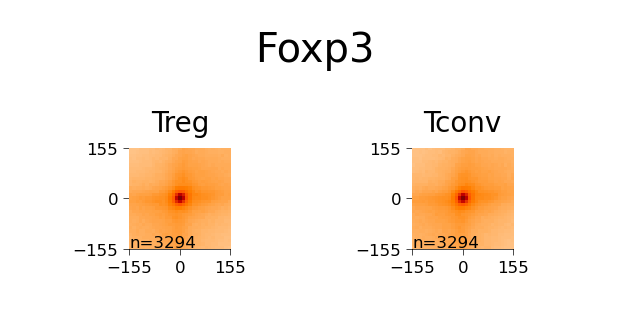

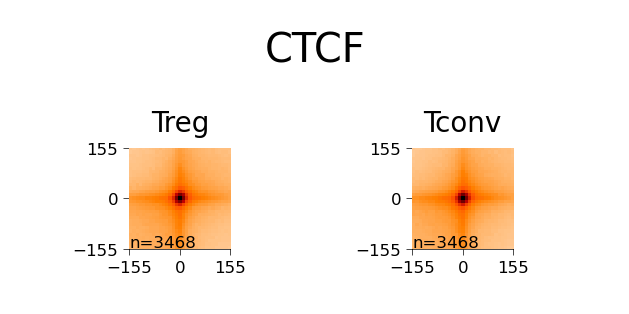

In [852]:
import math
plt.rcParams['pdf.fonttype'] = 42

indsoi_dict = {
    'Treg Stat5' : (loop_adata.obs['new_treg_stat'] > 0), 
    'All Stat5' : (loop_adata.obs['new_ns_stat'] > 0), 
    'Foxp3' : (loop_adata.obs['foxp3_peaks_yuri'] > 0), 
    'CTCF' : (loop_adata.obs['ctcf_p=1e-05'] > 1), 

}

for key, indsoi in indsoi_dict.items():
    comparisons = {
        'Treg' : 'Rename_Treg_all_no_chrM',
        'Tconv' : 'Rename_Tconv_all_no_chrM',
    }
    rows = 1
    cols = math.ceil(len(comparisons)/rows)
    fig, axs = init_subplots(len(comparisons), 1, fgsz=(40*mm, 40*mm), dpi = 100)
    axs = np.ravel(axs)
    for c, (name, comp1) in enumerate(comparisons.items()):
        ax = axs[c]
        pileup_1 = full_pileup_dict[comp1][oe_df.index.isin(loop_adata.obs.index)][indsoi].copy()
        m1 = np.nanmean(pileup_1, axis=0)

        n = len(m1)//2
        d = 2
        v1 = np.nanmean(pileup_1[:, n-d:n+d+1, n-d:n+d+1], axis=(1, 2))
        delta_mat = m1[5:-5, 5:-5]
        n = len(delta_mat)
        delta_mat_reshape = delta_mat
        res = 5
        ax.matshow(delta_mat_reshape, vmin=0, vmax=12, cmap='gist_heat_r',
                  extent = [-res*n, res*n, -res*n, res*n], zorder=3)
        ax.set_title(name)
        ax.set_xticks([-res*n, 0, res*n])
        ax.set_yticks([-res*n, 0, res*n])
        ax.tick_params(bottom=True, labelbottom=True, top=False, labeltop=False, left=True, labelleft=True)
        m = len(delta_mat_reshape)
        ax.text(-res*n, -res*(n-1), f'n={len(v1)}', fontsize=6)
        fig.suptitle(key, y=.9)
        plt.tight_layout()
        plt.savefig(f'./plots/paper/s31/baseline_loops_{key}.pdf')

/tmp/ipykernel_717572/1406125304.py:27: RuntimeWarning: Mean of empty slice


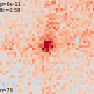

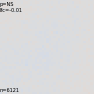

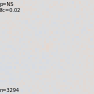

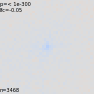

In [877]:
import math
from plotting_functions import *

indsoi_dict = {
    'Treg Stat5' : (loop_adata.obs['new_treg_stat'] > 0), 
    'All Stat5' : (loop_adata.obs['new_ns_stat'] > 0), 
    'Foxp3' : (loop_adata.obs['foxp3_peaks_yuri'] > 0), 
    'CTCF' : (loop_adata.obs['ctcf_p=1e-05'] > 1), 
}

for key, indsoi in indsoi_dict.items():
    comparisons = {
        'Treg ÷ Tcon (Ours)' : ['Rename_Treg_all_no_chrM', 'Rename_Tconv_all_no_chrM'],
    }
    rows = 1
    cols = math.ceil(len(comparisons)/rows)
    fig, axs = init_subplots_exact(1, 1, fgsz=(40*mm, 40*mm), as_list=True)
    for c, (label, (comp1, comp2)) in enumerate(comparisons.items()):
        ax = axs[c]
        pileup_1 = full_pileup_dict[comp1][oe_df.index.isin(loop_adata.obs.index)][indsoi].copy()
        pileup_2 = full_pileup_dict[comp2][oe_df.index.isin(loop_adata.obs.index)][indsoi].copy()
        m1 = np.nanmean(pileup_1, axis=0)
        m2 = np.nanmean(pileup_2, axis=0)

        n = len(m1)//2
        d = 2
        v1 = np.nanmean(pileup_1[:, n-d:n+d+1, n-d:n+d+1], axis=(1, 2))
        v2 = np.nanmean(pileup_2[:, n-d:n+d+1, n-d:n+d+1], axis=(1, 2))
        pval = samesize_nonan_test(v1, v2)[1]
        lfc = np.log2(np.nanmean(v1)/np.nanmean(v2))
        delta_mat = m1-m2
        ax.matshow(delta_mat, vmin=-2, vmax=2, cmap='coolwarm',
                   extent = [-res*n, res*n, -res*n, res*n], zorder=3
                  )
        ax.set_xticks([-res*n, 0, res*n])
        ax.set_yticks([-res*n, 0, res*n])
        ax.tick_params(bottom=True, labelbottom=True, top=False, labeltop=False, left=True, labelleft=True)
        m = len(delta_mat_reshape)
        p = format_pvalue(pval)
        plt.title(label)
        if np.abs(lfc) < .02:
            p = 'NS'
        ax.text(-res*n, res*(n-1), f'p={p}\nlfc={lfc.round(2)}', fontsize=6,
               va='top')
        
        ax.text(-res*n, -res*(n-1), f'n={len(v1)}', fontsize=6)
        fig.suptitle(f'Factor = {key}', y=1.3)
    fig.savefig(f'./plots/paper/s31/differential_apa_{key}.pdf', bbox_inches = 'tight')

#### Figure S24

In [ ]:
import networkx as nx
import community as community_louvain

def cluster_similar_motifs(motif_df_counts):
    # Create motif counts pivot table

    assert motif_df_counts.shape[1] < motif_df_counts.shape[0]
    # Calculate correlation
    corr = (motif_df_counts > 0).corr()
    
    # Create graph and perform clustering
    mat = corr.clip(0, 1).values
    mat[mat < .5] = 0
    mat[mat > .5] = 1
    G = nx.from_numpy_array(mat)
    partition = community_louvain.best_partition(G, weight='weight', resolution=4)
    return corr, partition
### Takes a long time to run
# corr, partition = cluster_similar_motifs(meme_motif_df)

In [ ]:
# from matplotlib_venn import venn3
# from plotting_functions import *
# fig, axs = init_subplots_exact(1, 1, fgsz=(mm*30, mm*30), dpi=300)
# my_venn3([
#     set(adata.obs.index[adata.obs['tss']>0]),
#     set(adata.obs.index[(adata.obs['tss'] > 0) & (adata.obs['all_atac']>0)]),
#     set(adata.obs.index[(adata.obs['tss'] > 0) & (adata.obs['metadomain_subloops_in_ancs']>0)]),
# ], ['All TSS', "TSS w/ ATAC", "TSS w/ metadomain Foci"], ax=axs)
# fig.savefig('./plots/FINAL_metadomainS/TSS_with_and_without_metadomains.pdf', bbox_inches='tight', dpi=300)

In [ ]:
# from plotting_functions import *

# fig, axs = init_subplots_exact(1, 1, fgsz=(mm*30, mm*30), dpi=300)
# my_venn2([set(adata.obs.index[adata.obs['tss']>0]),
#          set(adata.obs.index[adata.obs['metadomain_subloops_in_ancs']>0])], ['TSS', 'metadomains'], ax=axs)